# Connect Forest Management Model with Forest Carbon Budget Model

In [2]:
import numpy as np
import math
import matplotlib.pyplot as plt
import pandas as pd
import ipywidgets as widgets
from IPython.display import display
import ws3.forest
import time
import gurobipy as grb
import pickle
import libcbm
import os
from util_opt import compile_events, cbm_report, compile_scenario_maxstock, plot_scenario_maxstock, run_cbm_emissionstock, run_scenario, plugin_c_curves, plugin_c_curves_both, cbm_report_both, compare_ws3_cbm, compare_ws3_cbm_both, track_system_stock, track_system_emission, compile_scenario_minemission, plot_scenario_minemission, kpi_age, kpi_species, cmp_c_ss, cmp_c_se, results_scenarios, bootstrap_ogi, compare_kpi_age

In [3]:
base_year = 2020
horizon = 10
period_length = 10
max_age = 1000
n_steps = 100
tvy_name = 'totvol'
max_harvest = 1.0

In [4]:
# Define scenario options based on case study
scenario_options = {
    'redchris': ['no_cons','evenflow_cons', 'redchrs_AAC_90%', 'redchrs_AAC_80%', 'redchrs_AAC_70%', 'redchrs_AAC_60%', 'redchrs_AAC_50%', 'redchrs_AAC_40%', 'redchrs_AAC_30%', 'redchrs_AAC_20%', 'redchrs_AAC_10%' ],
    'goldenbear': ['no_cons', 'evenflow_cons', 'gldbr_AAC_90%', 'gldbr_AAC_80%', 'gldbr_AAC_70%', 'gldbr_AAC_60%', 'gldbr_AAC_50%', 'gldbr_AAC_40%', 'gldbr_AAC_30%', 'gldbr_AAC_20%', 'gldbr_AAC_10%'],
    'equitysilver': [ 'no_cons','evenflow_cons', 'eqtslvr_AAC_90%', 'eqtslvr_AAC_80%', 'eqtslvr_AAC_70%', 'eqtslvr_AAC_60%', 'eqtslvr_AAC_50%', 'eqtslvr_AAC_40%', 'eqtslvr_AAC_30%', 'eqtslvr_AAC_20%', 'eqtslvr_AAC_10%'],
    'test': ['no_cons', 'evenflow_cons', 'bau_redchrs']
}

# Function to handle case study selection and update scenario dropdown
def select_case_study(case_study):
    print(f"Selected case study: {case_study}")
    # Update the scenario dropdown based on the selected case study
    scenario_dropdown.options = scenario_options.get(case_study, [])
    scenario_dropdown.value = scenario_options[case_study][0]  # Set a default value

# Case study dropdown
case_study_dropdown = widgets.Dropdown(
    options=['redchris', 'goldenbear', 'equitysilver', 'test'],
    value='equitysilver',
    description='Case Study:'
)
case_study_dropdown.observe(lambda change: select_case_study(change['new']), names='value')
display(case_study_dropdown)

# Function to handle scenario selection
def select_scenario(scenario_name):
    print(f"Selected scenario: {scenario_name}")

# Scenario dropdown
scenario_dropdown = widgets.Dropdown(
    options=scenario_options['redchris'],  # Set initial options based on default case study
    value=scenario_options['redchris'][1],  # Set initial value
    description='Scenario:'
)
scenario_dropdown.observe(lambda change: select_scenario(change['new']), names='value')
display(scenario_dropdown)

# Function to handle objective functon
def select_obj(obj_mode):
    print(f"Selected objective: {obj_mode}")
obj_dropdown = widgets.Dropdown(
    options=['max_hv', 'min_ha', 'max_st', 'min_em'],
    value='min_em',
    description='Objective:'
)
display(obj_dropdown)
obj_dropdown.observe(lambda change: select_obj(change['new']), names='value')

Dropdown(description='Case Study:', index=2, options=('redchris', 'goldenbear', 'equitysilver', 'test'), value…

Dropdown(description='Scenario:', index=1, options=('no_cons', 'evenflow_cons', 'redchrs_AAC_90%', 'redchrs_AA…

Dropdown(description='Objective:', index=3, options=('max_hv', 'min_ha', 'max_st', 'min_em'), value='min_em')

In [5]:
# Initialize main widget components 
hwp_pool_effect = widgets.FloatSlider(min=0, max=1, step=1, description='HWP_effect', value=1, layout=widgets.Layout(margin='10px 0'))
release_immediately = widgets.FloatSlider(min=0, max=1, step=1, description='Release immediately', value=1, layout=widgets.Layout(margin='10px 0'))
displacement_effect = widgets.FloatSlider(min=0, max=1, step=1, description='Displacement', value=1, layout=widgets.Layout(margin='10px 0'))
clt_percentage = widgets.FloatSlider(min=0, max=1, step=0.1, description='CLT_percent:', value=0.5, layout=widgets.Layout(margin='10px 0'))
credibility = widgets.FloatSlider(min=0, max=1, step=0.1, description='Credibility:', value=1, layout=widgets.Layout(margin='10px 0'))
# max_harvest = widgets.FloatSlider(min=0, max=1, step=0.05, description='Max_harvest:', value=1.0, layout=widgets.Layout(margin='10px 0'))
budget_input = widgets.FloatText(value=10000000, description='Budget:', layout=widgets.Layout(margin='10px 0'))

release_immediately.layout.display = 'none' if hwp_pool_effect.value != 0 else 'block'
displacement_effect.layout.display = 'block' if hwp_pool_effect.value != 0 else 'none'
clt_percentage.layout.display = 'block' if hwp_pool_effect.value != 0 and displacement_effect.value != 0 else 'none'
credibility.layout.display = 'block' if hwp_pool_effect.value != 0 and displacement_effect.value != 0 else 'none'

container = widgets.VBox([
    hwp_pool_effect, release_immediately, displacement_effect, clt_percentage, credibility, budget_input  
    # ,max_harvest
])

display(container)

def update_widgets(change):
    hwp_pool_effect_value = hwp_pool_effect.value
    displacement_effect_value = displacement_effect.value

    release_immediately.layout.display = 'block' if hwp_pool_effect_value == 0 else 'none'
    displacement_effect.layout.display = 'block' if hwp_pool_effect_value != 0 else 'none'

    clt_percentage.layout.display = 'block' if hwp_pool_effect_value != 0 and displacement_effect_value != 0 else 'none'
    credibility.layout.display = 'block' if hwp_pool_effect_value != 0 and displacement_effect_value != 0 else 'none'

hwp_pool_effect.observe(update_widgets, names='value')
displacement_effect.observe(update_widgets, names='value')

In [6]:
#Start Calculating the Running Time
Start = time.time()

In [7]:
case_study = case_study_dropdown.value
scenario_name = scenario_dropdown.value
obj_mode = obj_dropdown.value
hwp_pool_effect_value = hwp_pool_effect.value
release_immediately_value = release_immediately.value if hwp_pool_effect_value == 0 else 0
displacement_effect = displacement_effect.value if hwp_pool_effect_value != 0 else 0
clt_percentage = clt_percentage.value if displacement_effect != 0 else 0
credibility = credibility.value if displacement_effect != 0 else 0
# max_harvest = max_harvest.value
budget_input = budget_input.value

In [8]:
# Define case study mappings and retrieve model details based on case study
case_study_options = {
    'redchris': {
        'model_name': 'redchris',
        'model_path': './data/woodstock_model_files_redchris'
    },
    'goldenbear': {
        'model_name': 'goldenbear',
        'model_path': './data/woodstock_model_files_goldenbear'
    },
    'equitysilver': {
        'model_name': 'equitysilver',
        'model_path': './data/woodstock_model_files_equitysilver'
    },
    'test': {
        'model_name': 'redchris',
        'model_path': './data/woodstock_model_files_redchris_test'
    }
}

model_info = case_study_options.get(case_study)

if model_info:
    model_name = model_info['model_name']
    model_path = model_info['model_path']
else:
    print('The case study name is not valid')


In [9]:
# Create and Run `ForestModel` instance
fm = ws3.forest.ForestModel(model_name=model_name,
                            model_path=model_path,
                            base_year=base_year,
                            horizon=horizon,
                            period_length=period_length,
                            max_age=max_age)
fm.import_landscape_section()
fm.import_areas_section()
fm.import_yields_section()
fm.import_actions_section()
fm.import_transitions_section()
fm.initialize_areas()
fm.add_null_action()
fm.reset_actions()
fm.grow()

In [10]:
# Flag 'harvest' as a harvesting action in the ws3 model
harvest_acode='harvest'
fm.actions[harvest_acode].is_harvest = True

In [11]:
# Read curves
file_directory = "./inputs/curves"
file_names = [f"{case_study}_c_curves_p.pkl", f"{case_study}_c_curves_f.pkl"]
loaded_data = {}

for filename in file_names:
    file_path = os.path.join(file_directory, filename)
    with open(file_path, 'rb') as file:
        loaded_data[filename] = pickle.load(file)
    print(f"Loaded data from {file_path}")

c_curves_p = loaded_data.get(f"{case_study}_c_curves_p.pkl")
c_curves_f = loaded_data.get(f"{case_study}_c_curves_f.pkl")

Loaded data from ./inputs/curves/equitysilver_c_curves_p.pkl
Loaded data from ./inputs/curves/equitysilver_c_curves_f.pkl


In [12]:
# Plug carbon and old groth yield curves into forest model
plugin_c_curves(fm, c_curves_p, c_curves_f)
bootstrap_ogi(fm)

Running for equitysilver_min_em_no_cons...
running no_cons scenario
Set parameter Username
Academic license - for non-commercial use only - expires 2025-01-09
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17023 rows, 83258 columns and 83258 nonzeros
Model fingerprint: 0xca0e4d55
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]
Presolve removed 17023 rows and 83258 columns
Presolve time: 0.05s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6051199e+08   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.06 seconds (0.03 work units)
Optimal objective -1.605119881e+08


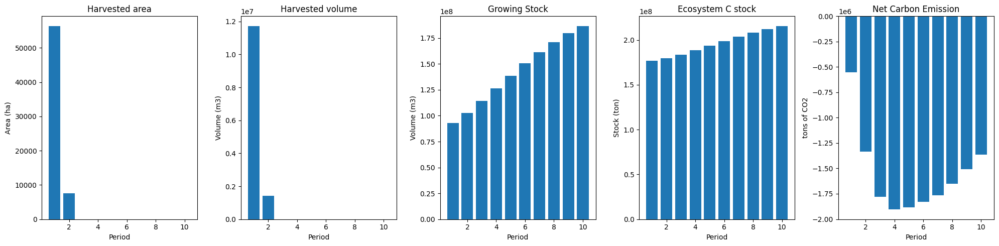

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_no_cons_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  13888
The economic indicator (the provincial government revenues) is:  473621
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


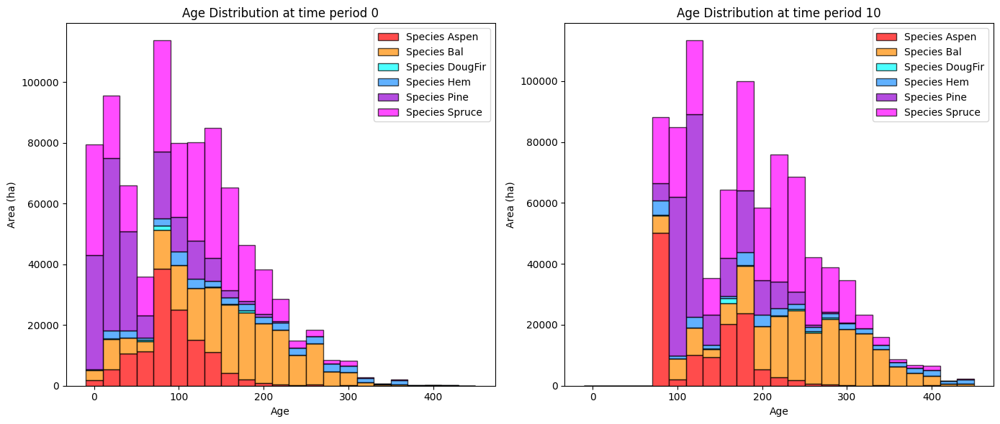

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_no_cons_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   27968.118214    8815.990985
DougFir    947.047810    2596.453806    1649.405996
Bal      59315.970469  153327.955345   94011.984876
Spruce   36410.744598  195891.253146  159480.508548
Aspen    29632.731169   69125.134591   39492.403422
Pine      7432.733686   67911.175549   60478.441863

Old growth has **increased** by 363928.74 hectares from time period 0 to time period 10.


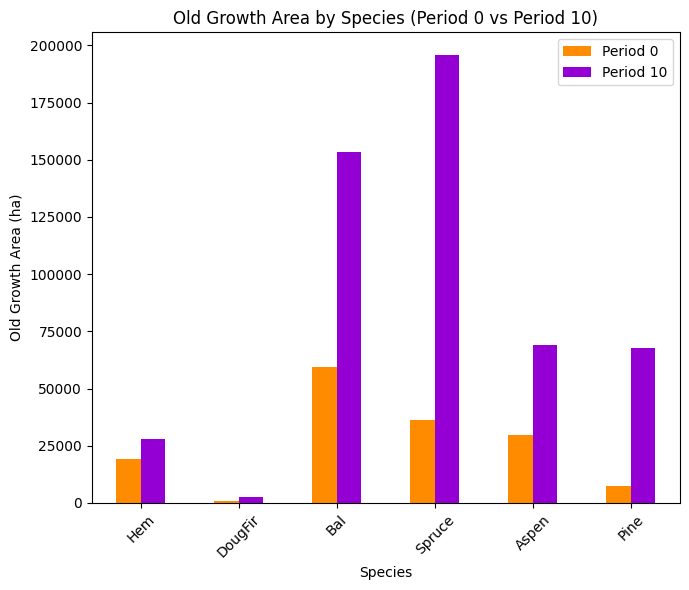

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_no_cons_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7421

Diversity has **decreased** by 1.71% from time 0 to time 10.


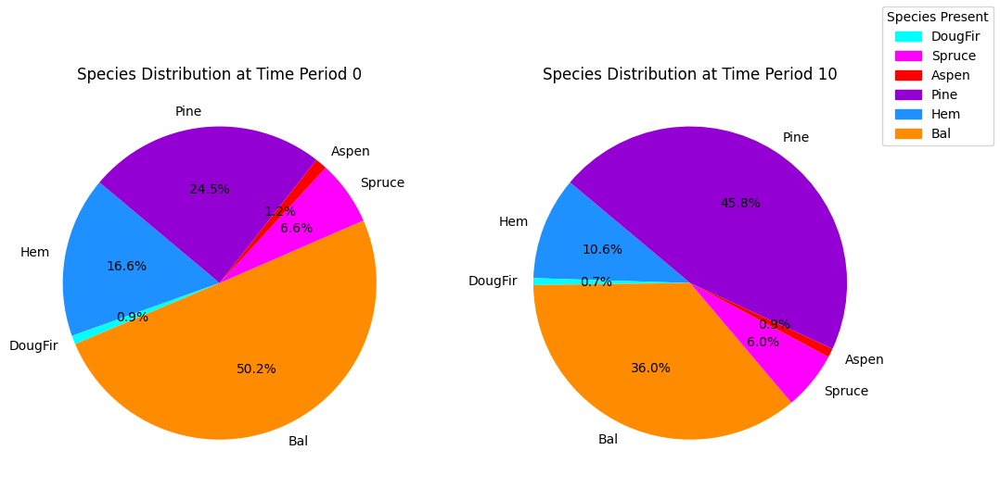

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_no_cons_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.22s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering t

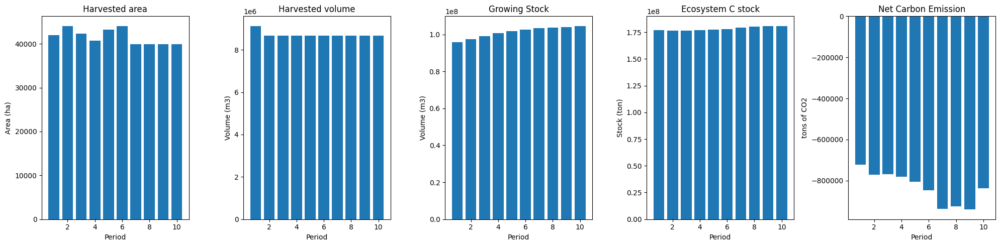

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


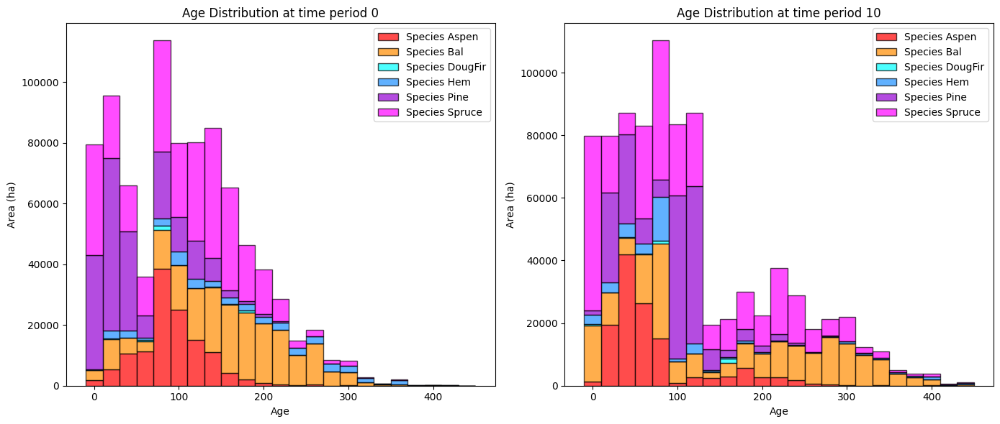

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


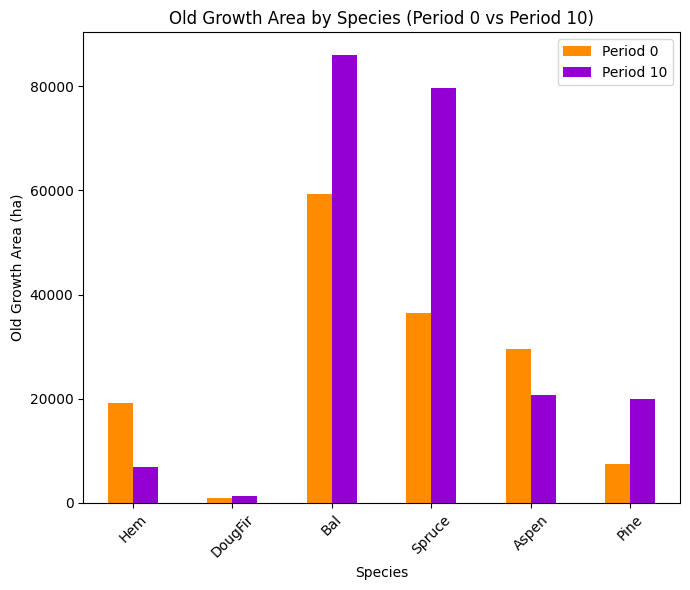

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


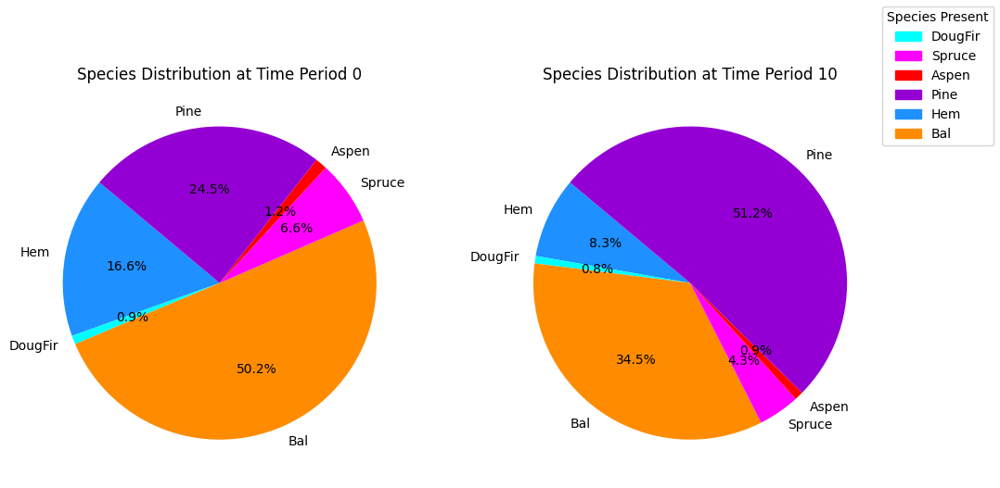

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


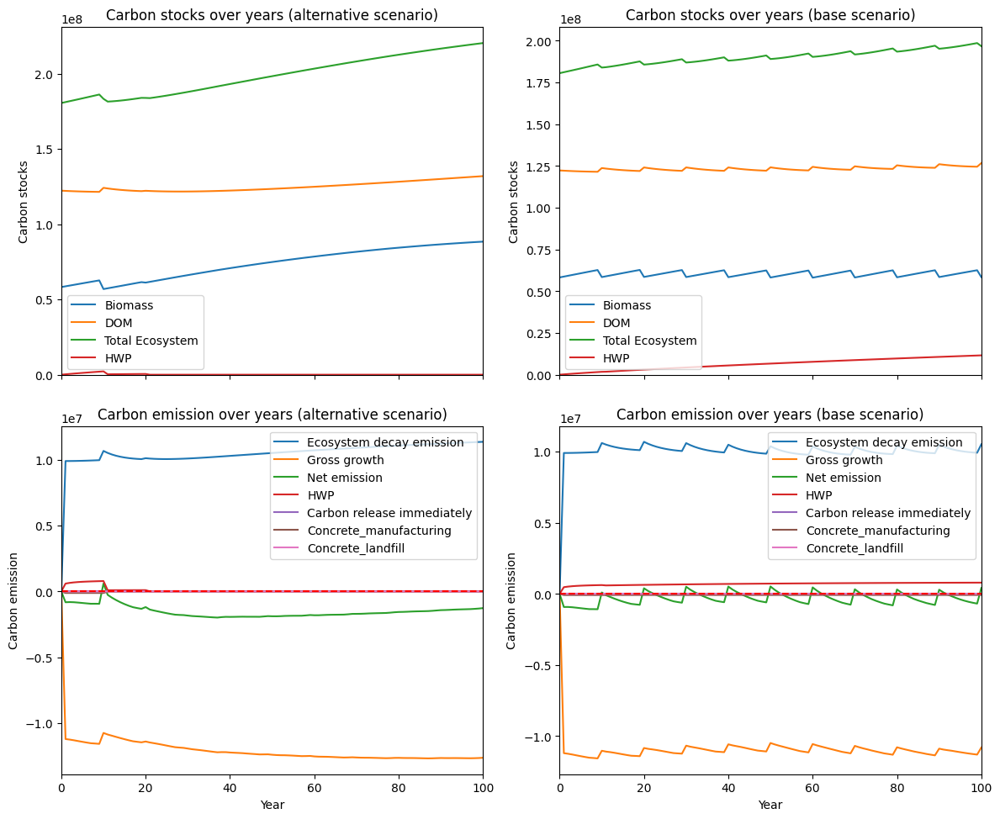

---------------------------------------------------------------------------------------
Net emission difference -118690788.55150706
Net emission base scenario -33180983.42591032
Net emission alternative scenario -151871771.97741735
dollar_per_ton is:  0.08425253654507822
Comparison of Old Growth Areas (Alternative - Base)
           0             10     Difference
Hem      0.0   21068.973829   21068.973829
DougFir  0.0    1282.590089    1282.590089
Bal      0.0   67299.537508   67299.537508
Spruce   0.0  116296.075644  116296.075644
Aspen    0.0   48359.764451   48359.764451
Pine     0.0   47973.932454   47973.932454

Overall, the old growth area has **increased** by 302280.87 hectares in the alternative scenario compared to the base scenario.


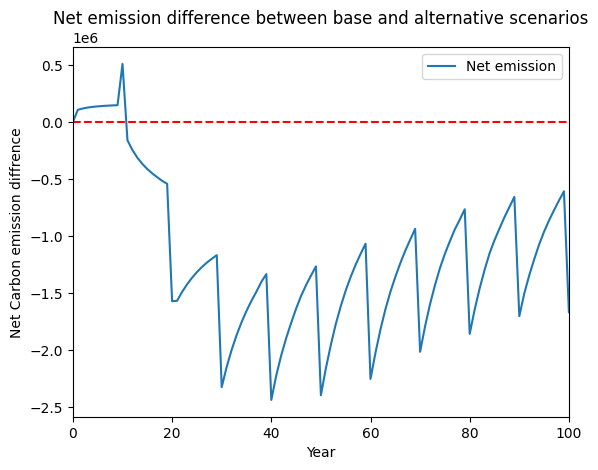

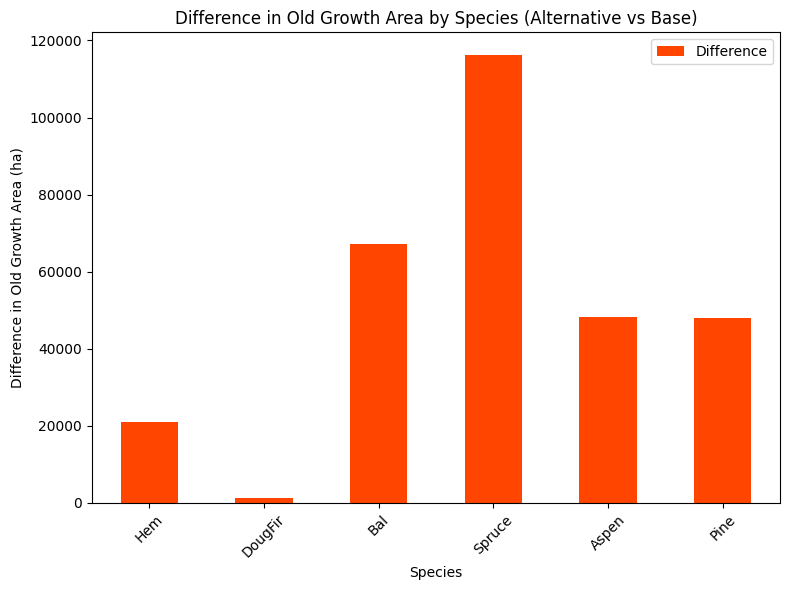

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


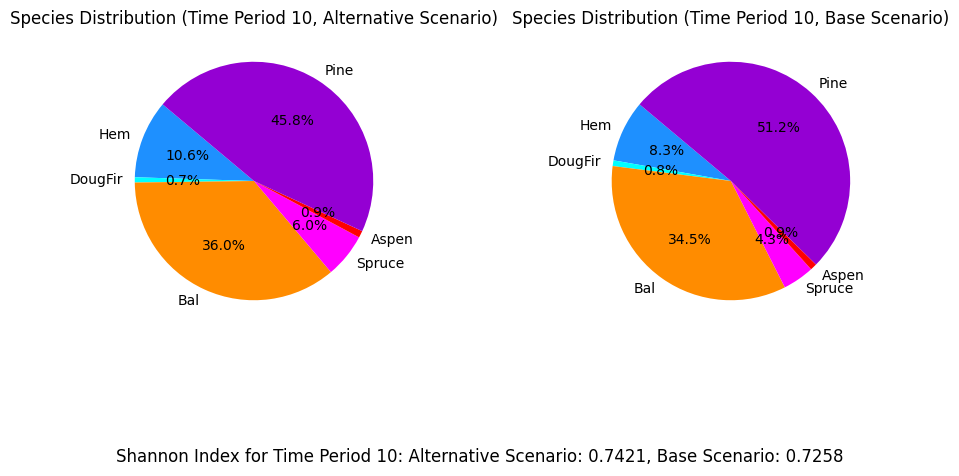

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_evenflow_cons...
running even flow constraints scenario
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17063 rows, 83258 columns and 514878 nonzeros
Model fingerprint: 0xd839711e
Coefficient statistics:
  Matrix range     [5e-03, 6e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]
Presolve removed 8690 rows and 8884 columns
Presolve time: 0.18s
Presolved: 8373 rows, 74374 columns, 486421 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Orde

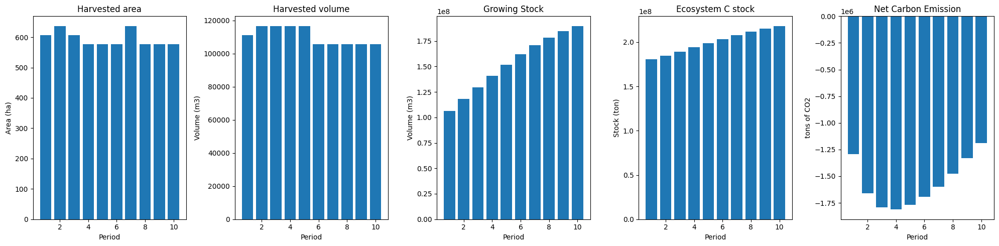

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_evenflow_cons_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  1169
The economic indicator (the provincial government revenues) is:  39891
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


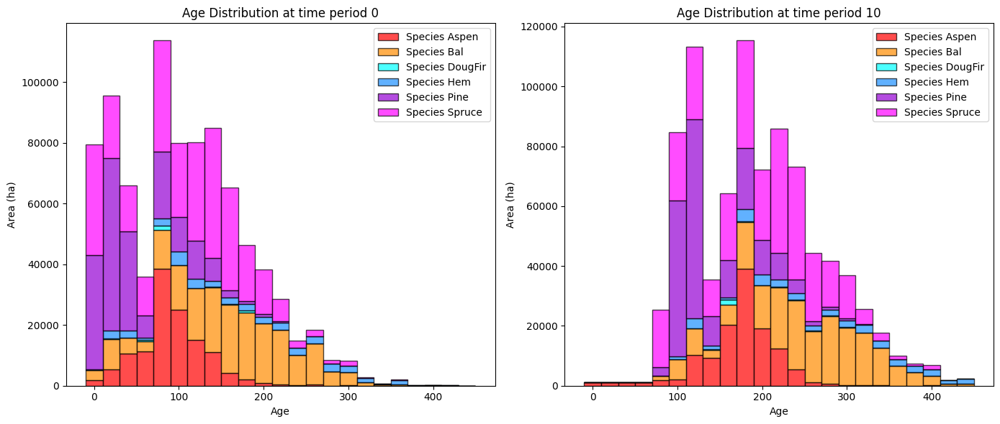

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_evenflow_cons_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   32688.964561   13536.837333
DougFir    947.047810    2749.298212    1802.250402
Bal      59315.970469  157689.747715   98373.777247
Spruce   36410.744598  198358.607639  161947.863041
Aspen    29632.731169  112410.787462   82778.056293
Pine      7432.733686   70671.811755   63239.078069

Old growth has **increased** by 421677.86 hectares from time period 0 to time period 10.


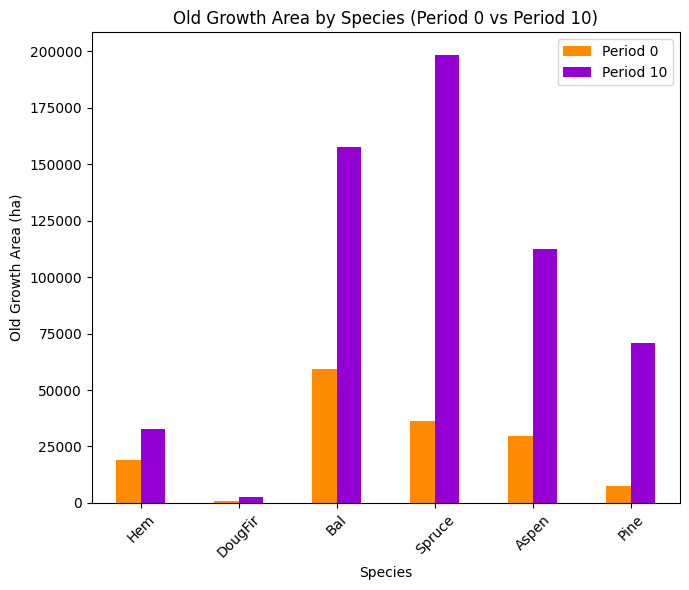

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_evenflow_cons_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7446

Diversity has **decreased** by 1.45% from time 0 to time 10.


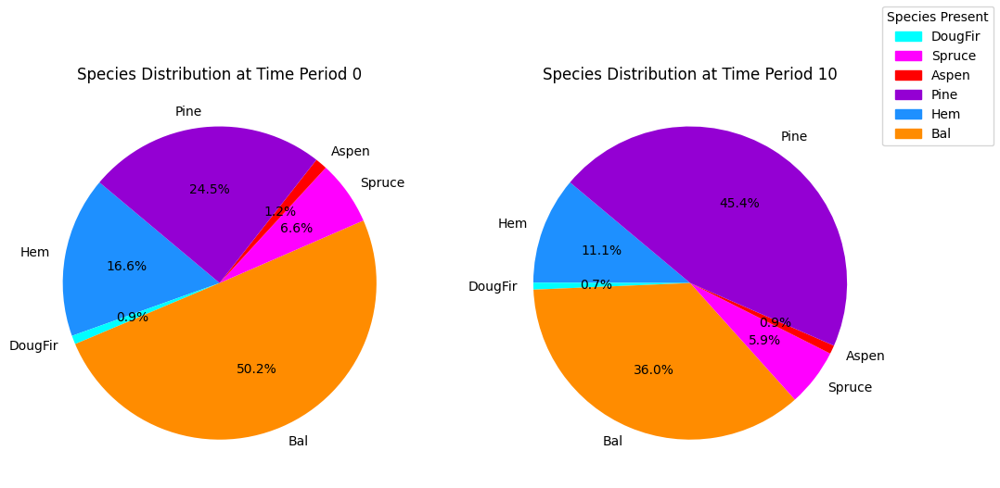

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_evenflow_cons_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.25s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Orde

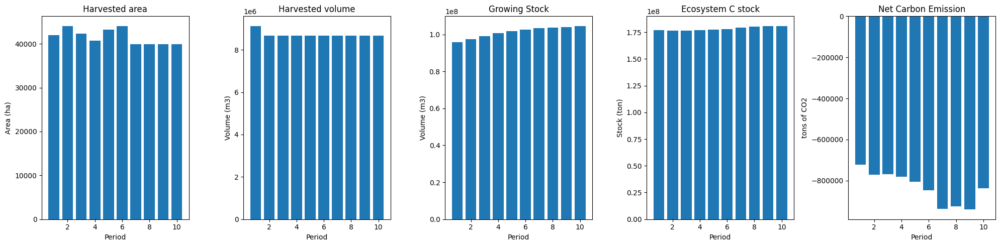

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


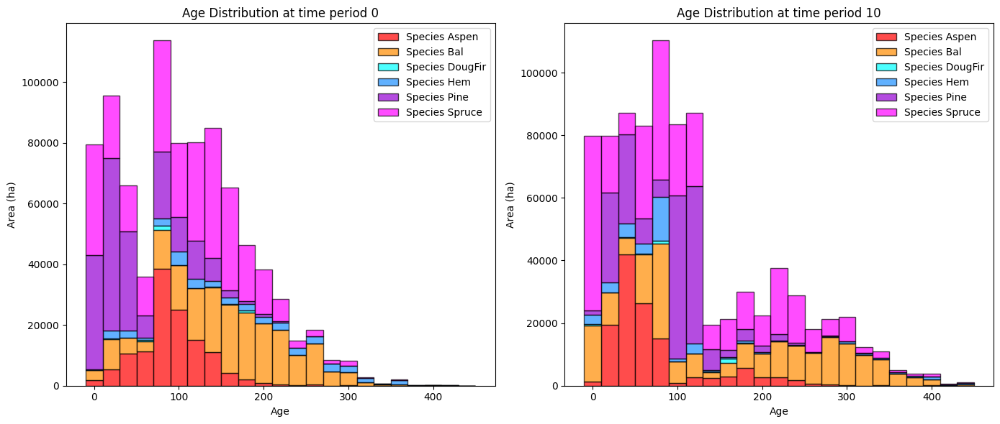

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


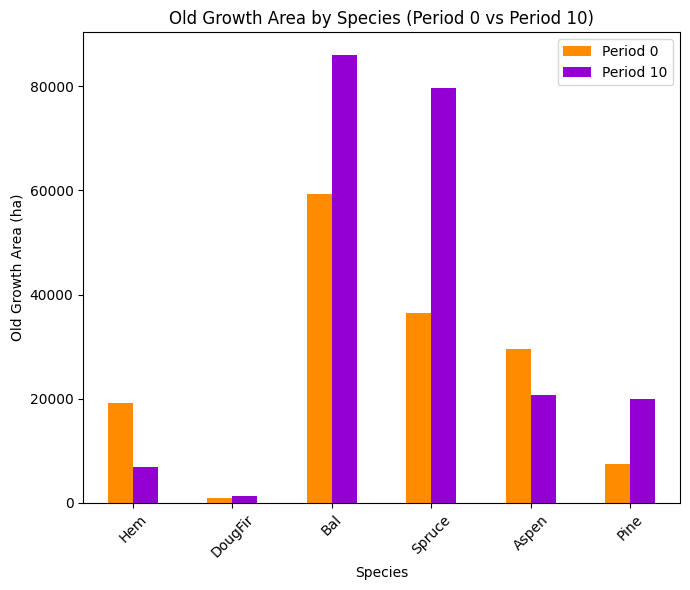

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


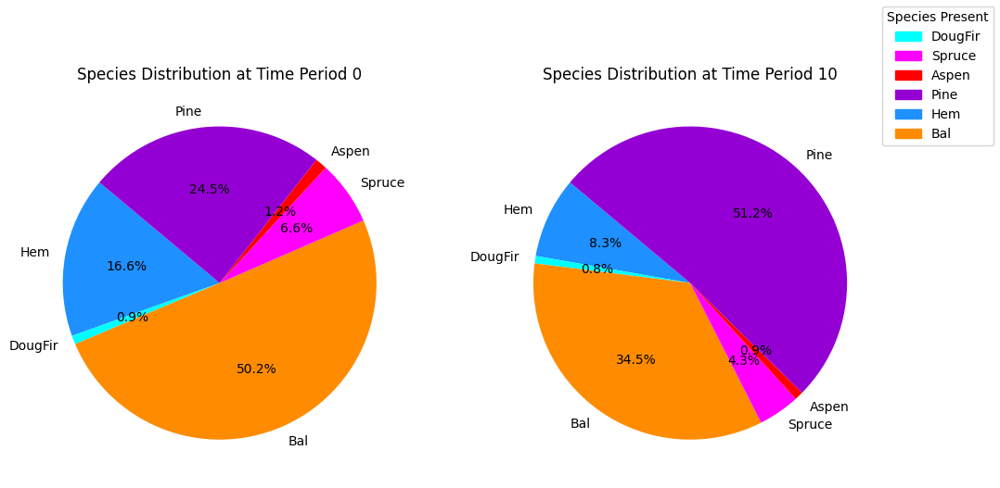

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


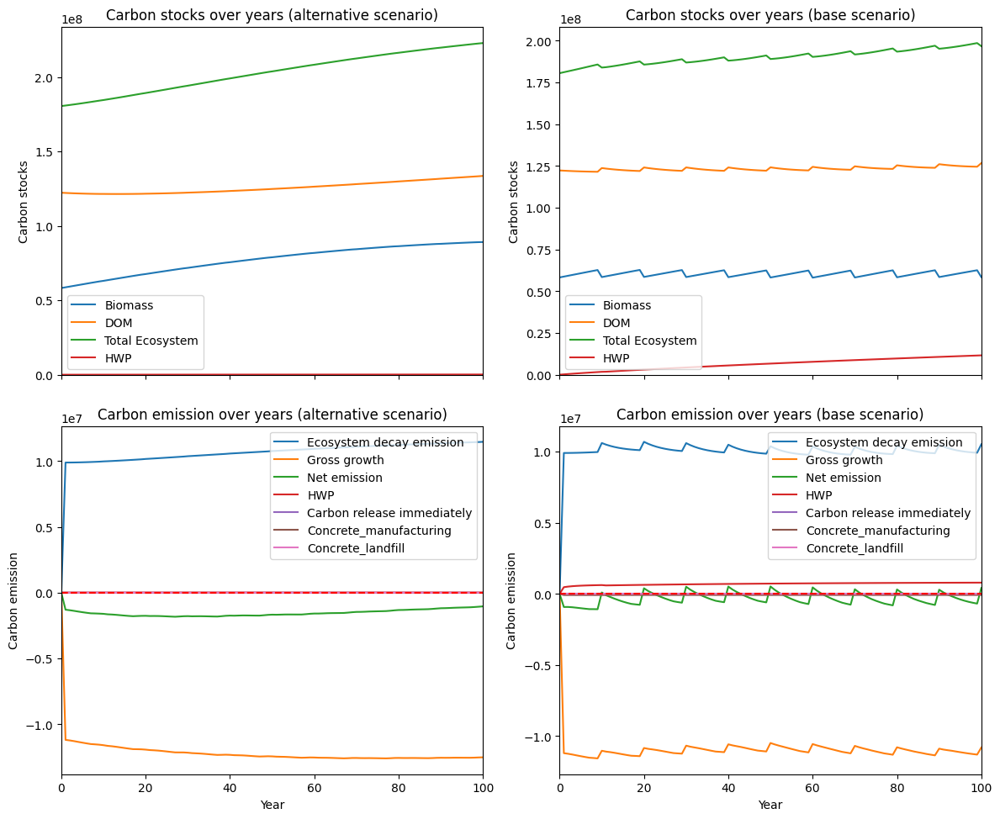

---------------------------------------------------------------------------------------
Net emission difference -121767644.2668058
Net emission base scenario -33180983.42591032
Net emission alternative scenario -154948627.69271615
dollar_per_ton is:  0.08212362208542806
Comparison of Old Growth Areas (Alternative - Base)
           0             10     Difference
Hem      0.0   25789.820177   25789.820177
DougFir  0.0    1435.434494    1435.434494
Bal      0.0   71661.329878   71661.329878
Spruce   0.0  118763.430137  118763.430137
Aspen    0.0   91645.417323   91645.417323
Pine     0.0   50734.568661   50734.568661

Overall, the old growth area has **increased** by 360030.00 hectares in the alternative scenario compared to the base scenario.


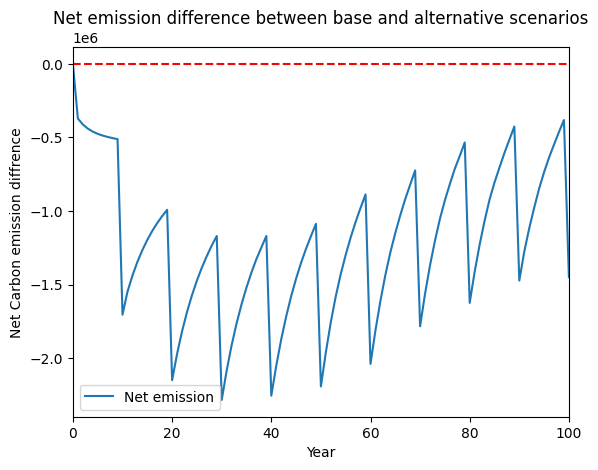

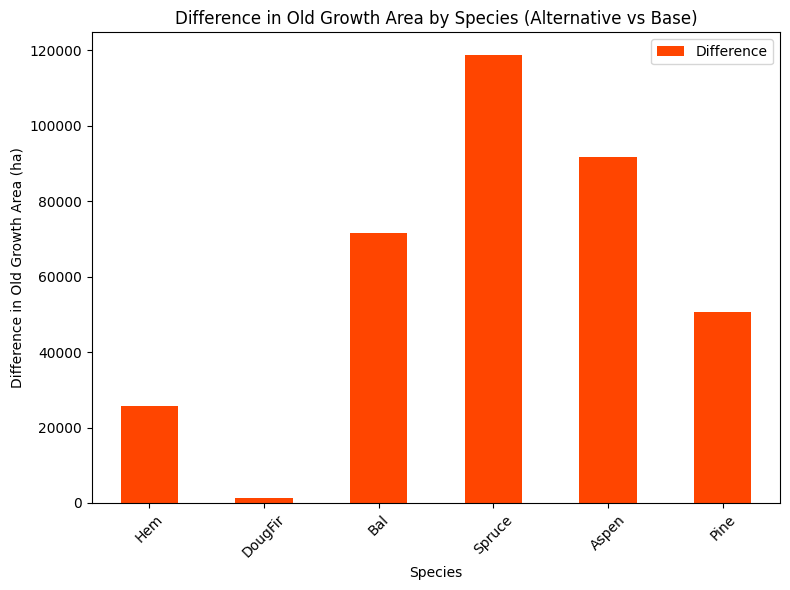

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


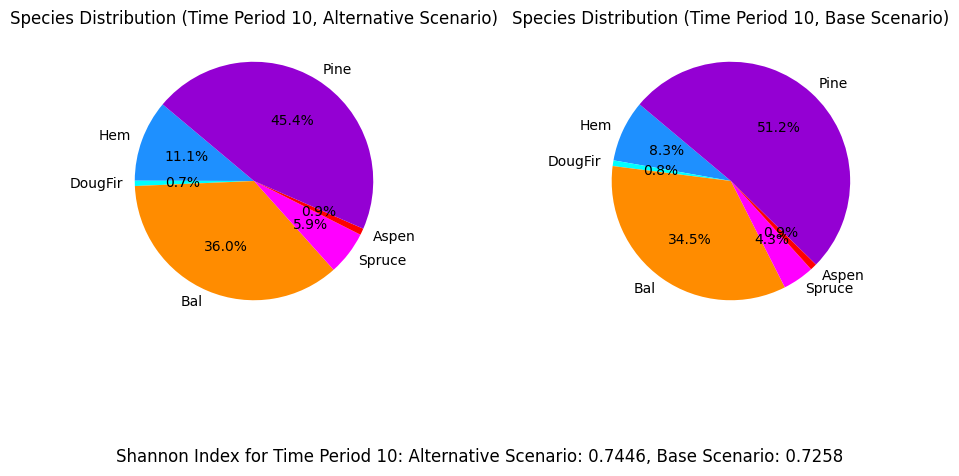

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_90%...
running the scenario for the Equity Silver mining site (90%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xed32ec6f
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.23s
Presolved: 8375 r

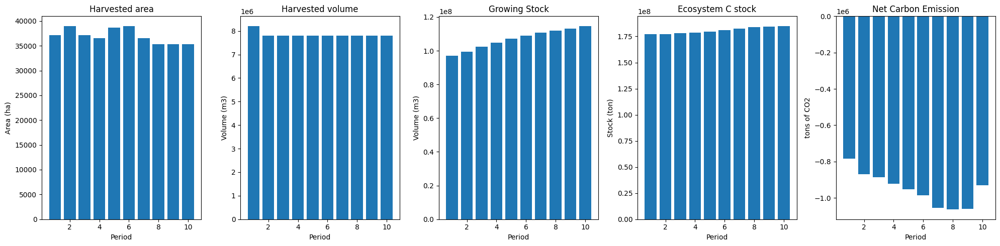

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_90%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  82941
The economic indicator (the provincial government revenues) is:  2828481
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


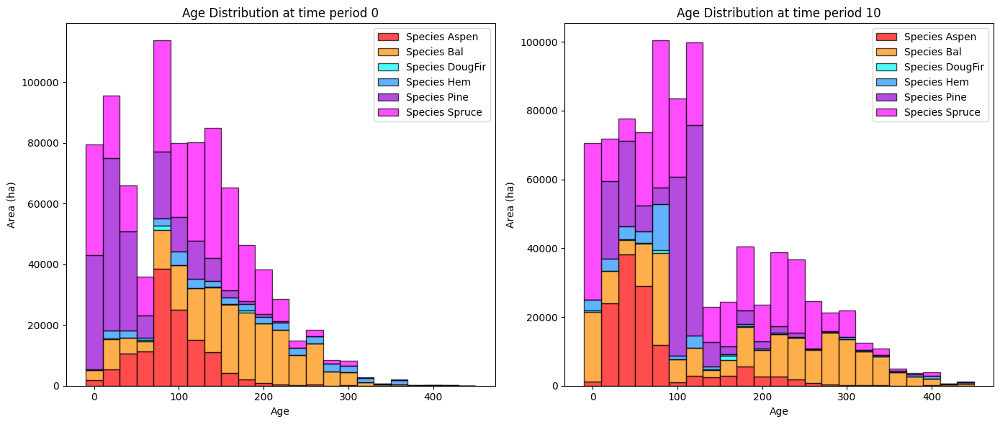

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_90%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   7163.103152 -11989.024077
DougFir    947.047810   1327.027133    379.979323
Bal      59315.970469  89835.112234  30519.141766
Spruce   36410.744598  99830.062344  63419.317746
Aspen    29632.731169  20782.322147  -8850.409022
Pine      7432.733686  24030.325825  16597.592139

Old growth has **increased** by 90076.60 hectares from time period 0 to time period 10.


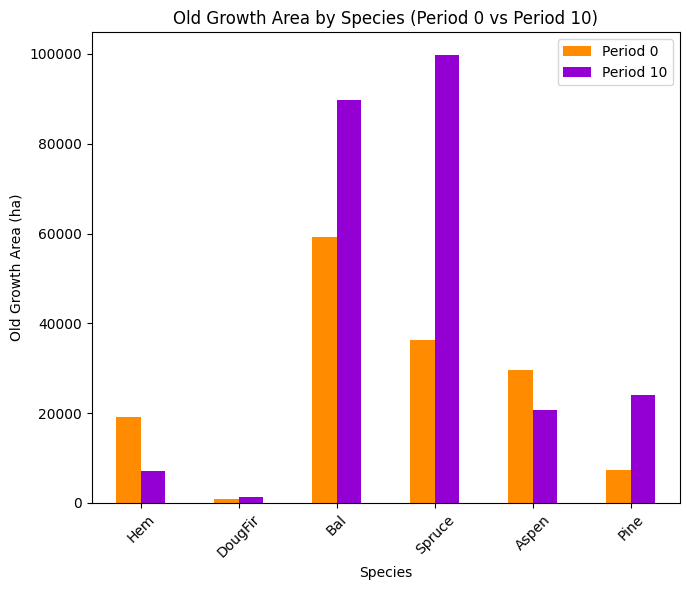

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_90%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7137

Diversity has **decreased** by 4.54% from time 0 to time 10.


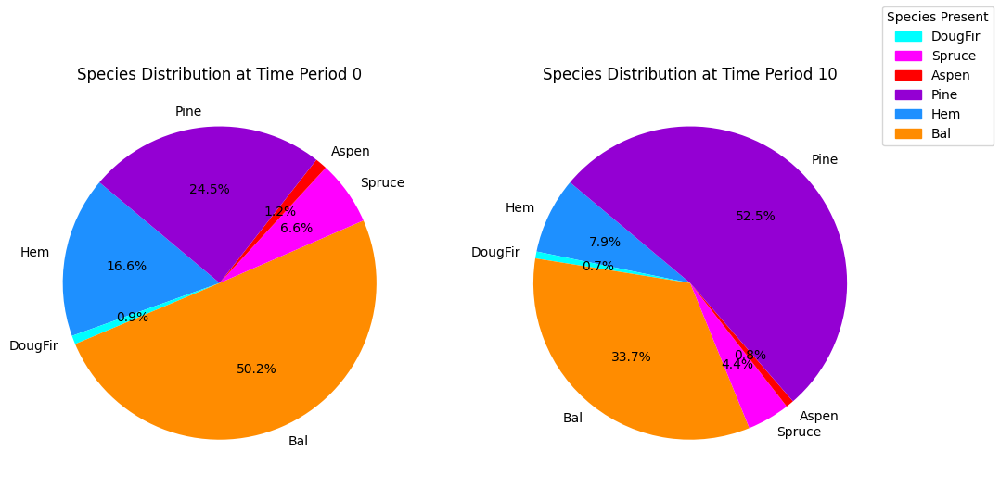

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_90%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.31s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

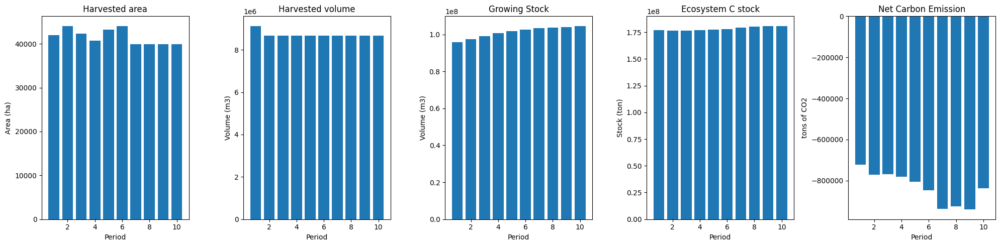

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


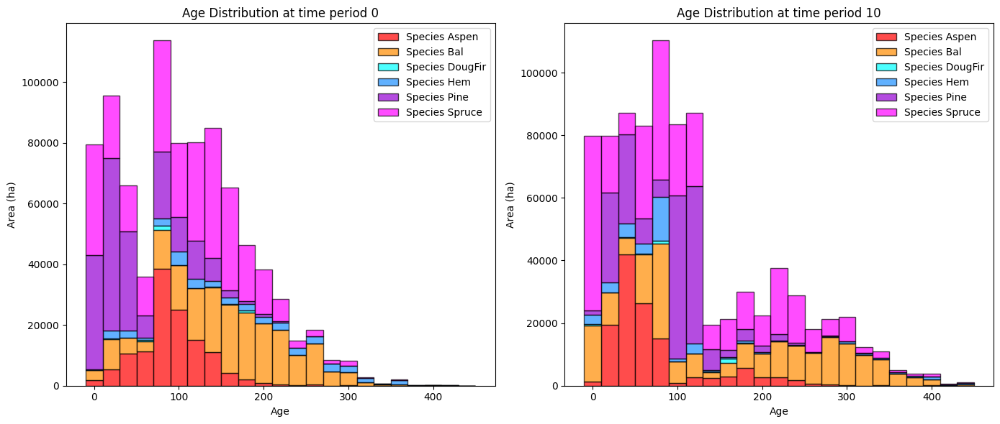

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


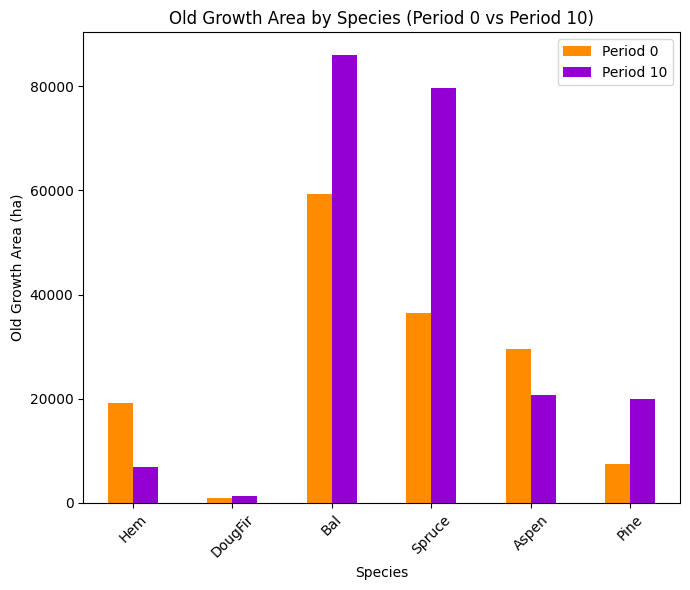

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


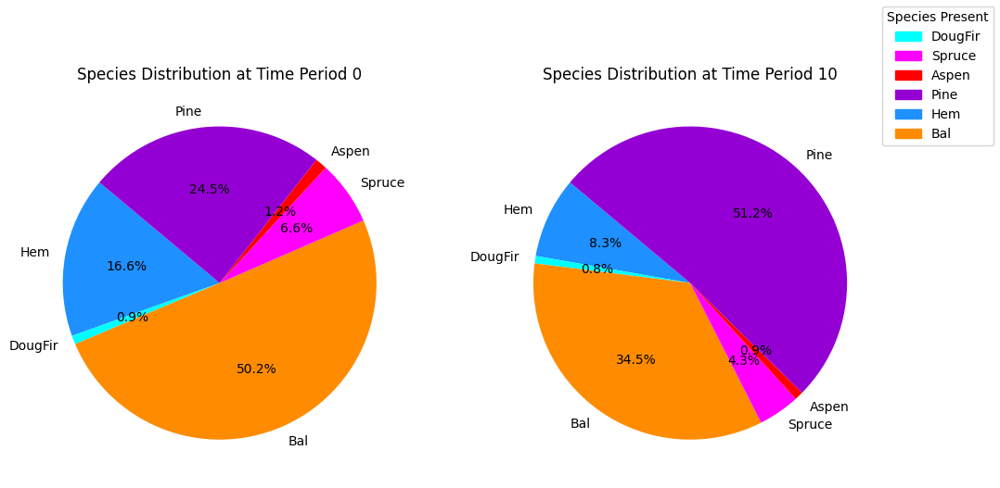

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


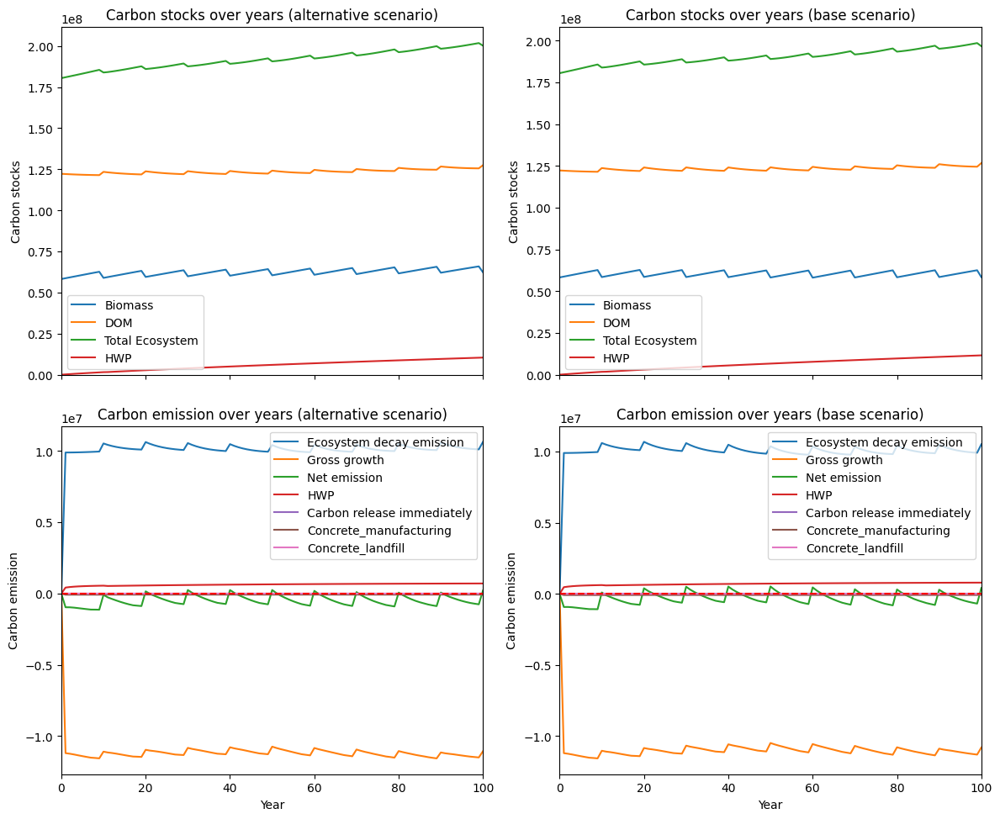

---------------------------------------------------------------------------------------
Net emission difference -15638228.38883374
Net emission base scenario -33180983.42591032
Net emission alternative scenario -48819211.81474406
dollar_per_ton is:  0.6394586235318293
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0    263.958768    263.958768
DougFir  0.0     13.163416     13.163416
Bal      0.0   3806.694397   3806.694397
Spruce   0.0  20234.884842  20234.884842
Aspen    0.0     16.952008     16.952008
Pine     0.0   4093.082731   4093.082731

Overall, the old growth area has **increased** by 28428.74 hectares in the alternative scenario compared to the base scenario.


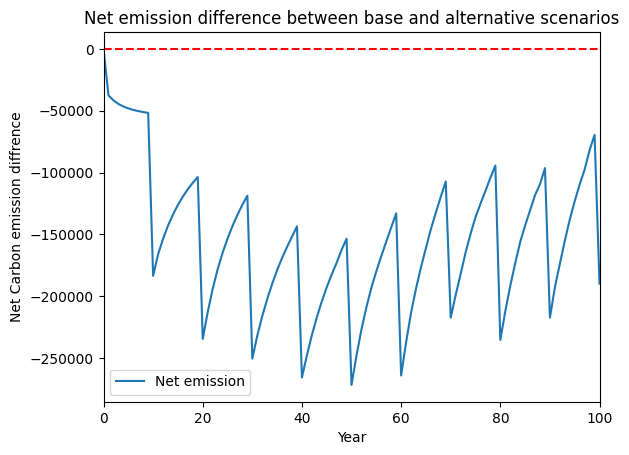

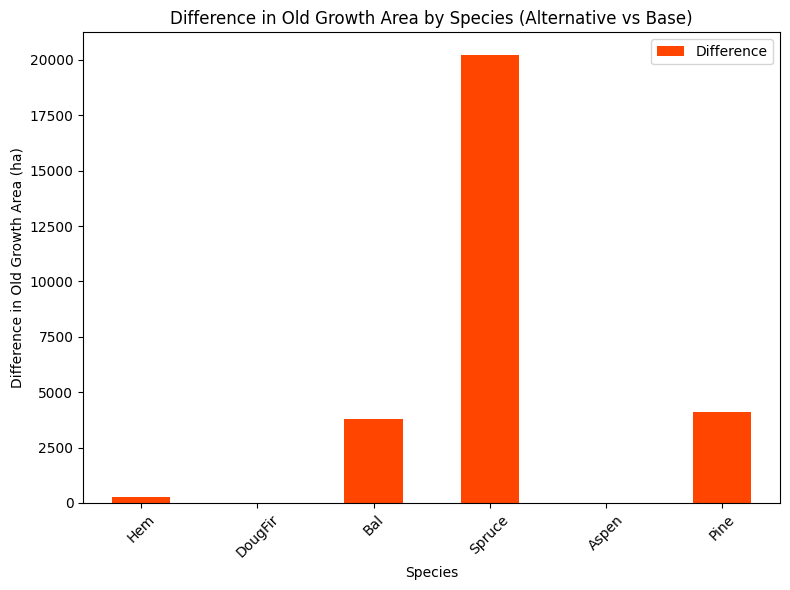

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


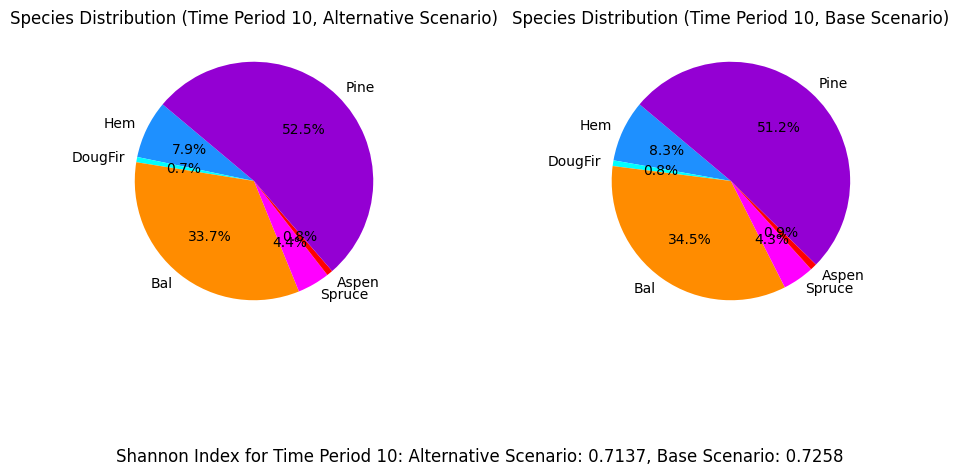

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_80%...
running the scenario for the Equity Silver mining site (80%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x051139f4
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.23s
Presolved: 8375 r

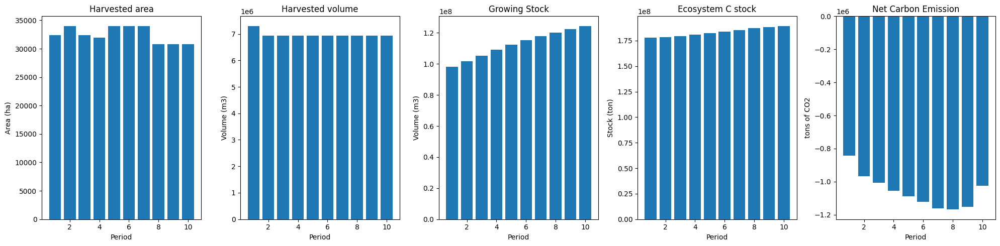

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_80%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  73725
The economic indicator (the provincial government revenues) is:  2514205
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


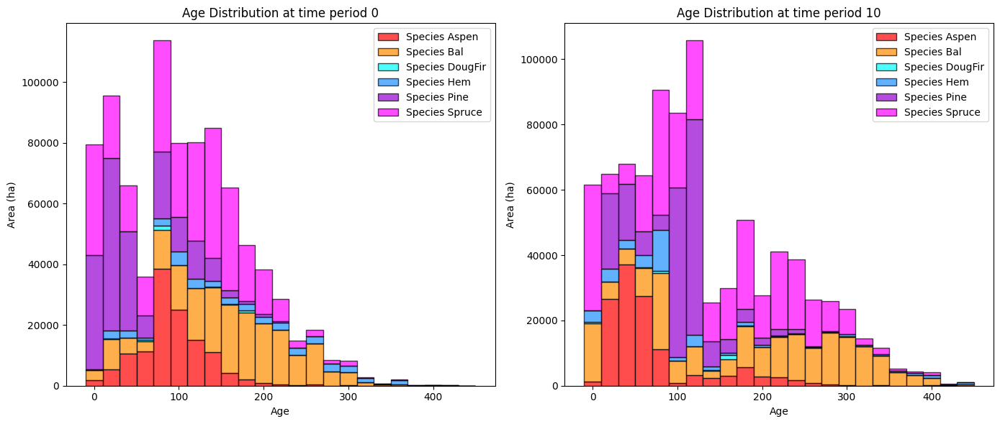

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_80%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    7498.808310 -11653.318919
DougFir    947.047810    1418.810048    471.762238
Bal      59315.970469  101309.611503  41993.641034
Spruce   36410.744598  117010.853839  80600.109241
Aspen    29632.731169   20956.038777  -8676.692392
Pine      7432.733686   27250.907561  19818.173874

Old growth has **increased** by 122553.68 hectares from time period 0 to time period 10.


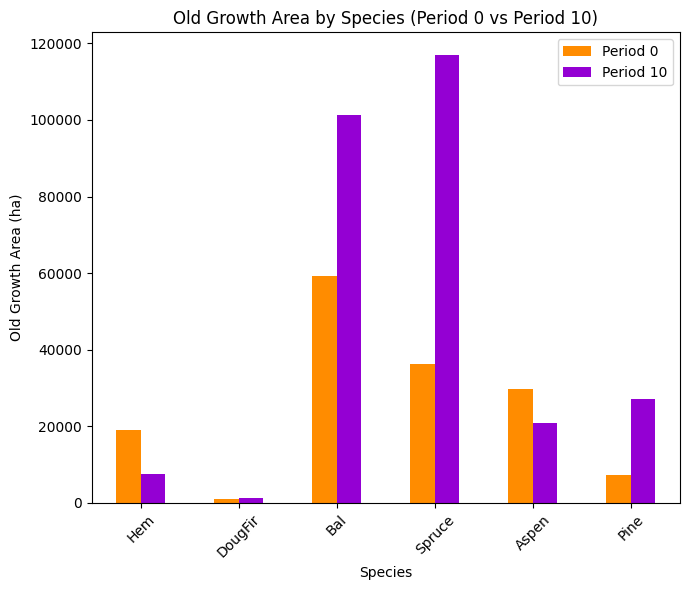

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_80%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7063

Diversity has **decreased** by 5.29% from time 0 to time 10.


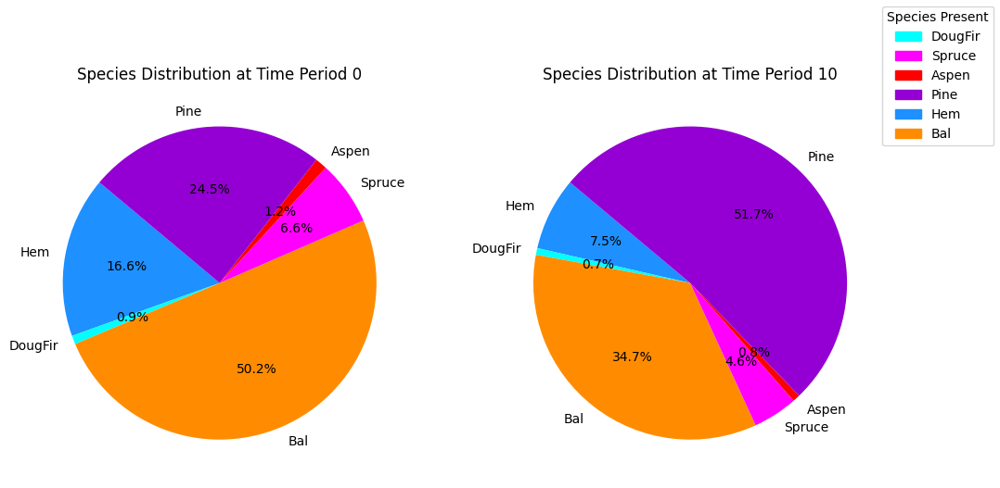

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_80%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.25s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

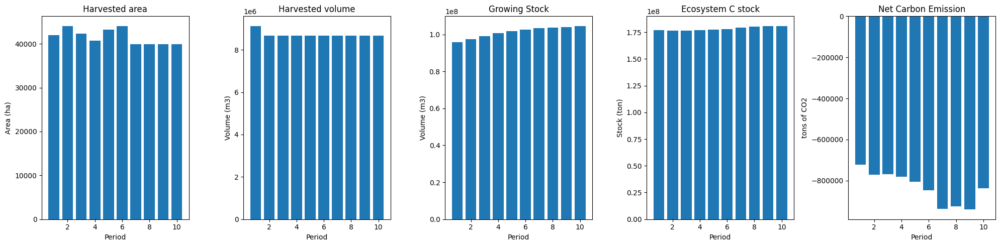

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


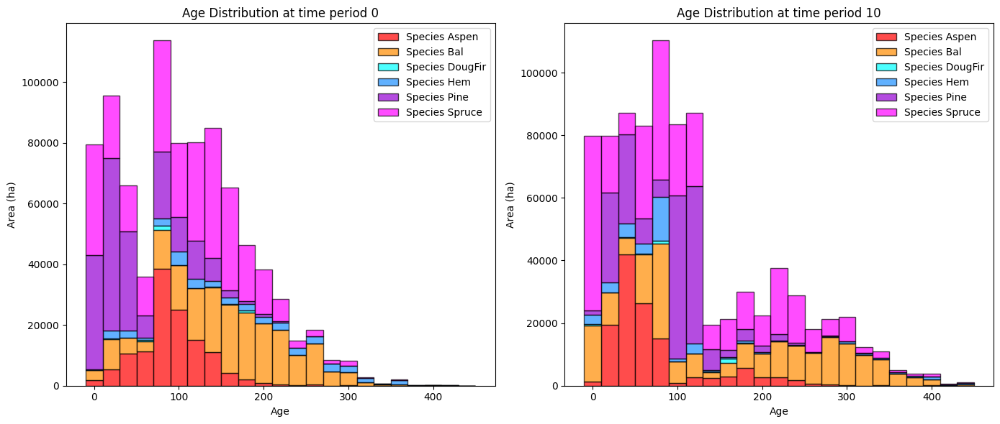

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


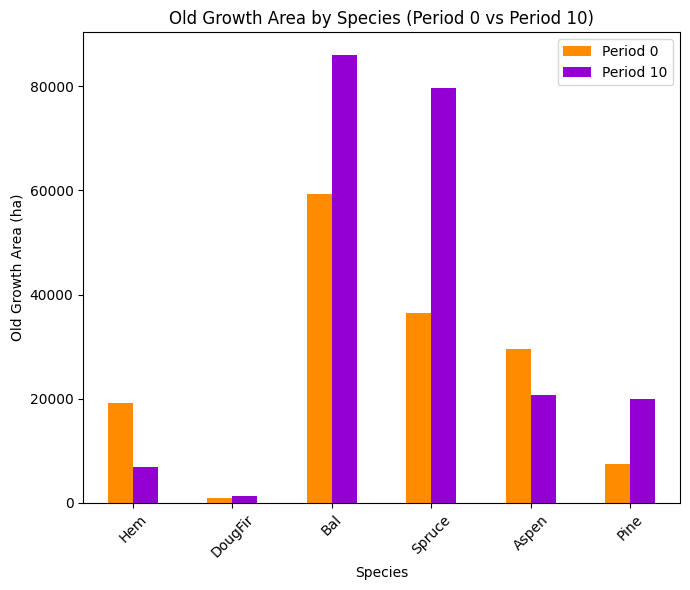

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


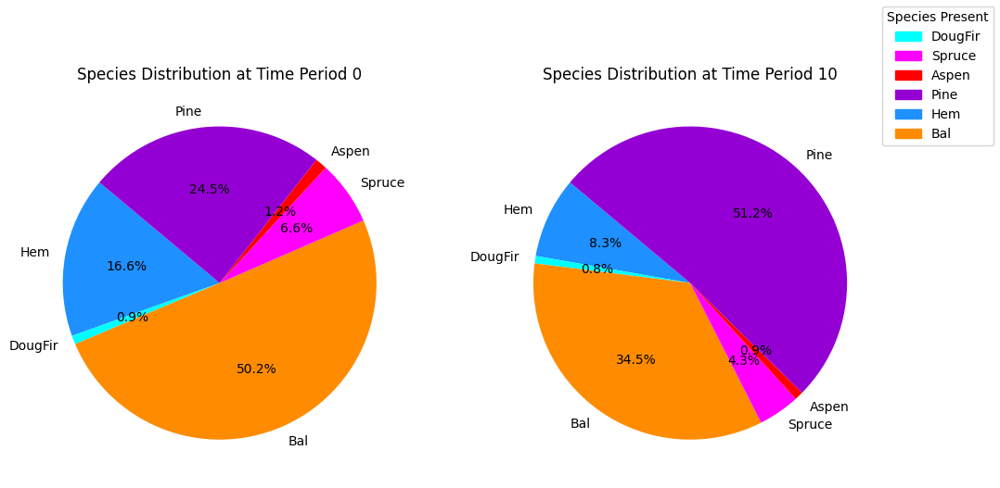

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


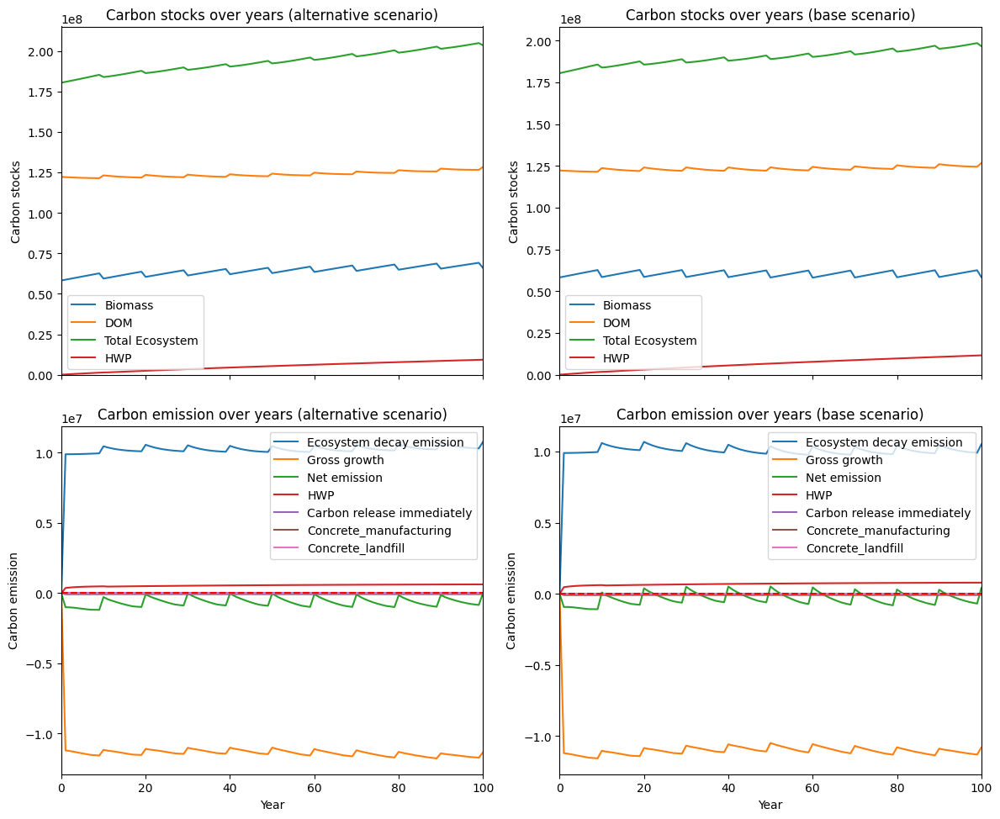

---------------------------------------------------------------------------------------
Net emission difference -30799824.43285871
Net emission base scenario -33180983.42591032
Net emission alternative scenario -63980807.85876904
dollar_per_ton is:  0.32467717541050417
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0    599.663926    599.663926
DougFir  0.0    104.946331    104.946331
Bal      0.0  15281.193665  15281.193665
Spruce   0.0  37415.676337  37415.676337
Aspen    0.0    190.668638    190.668638
Pine     0.0   7313.664466   7313.664466

Overall, the old growth area has **increased** by 60905.81 hectares in the alternative scenario compared to the base scenario.


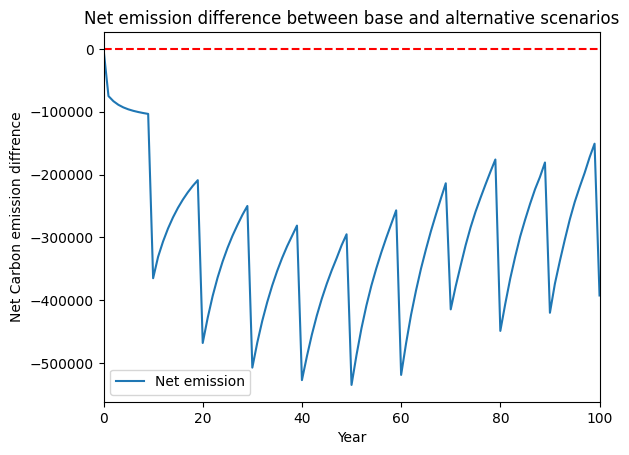

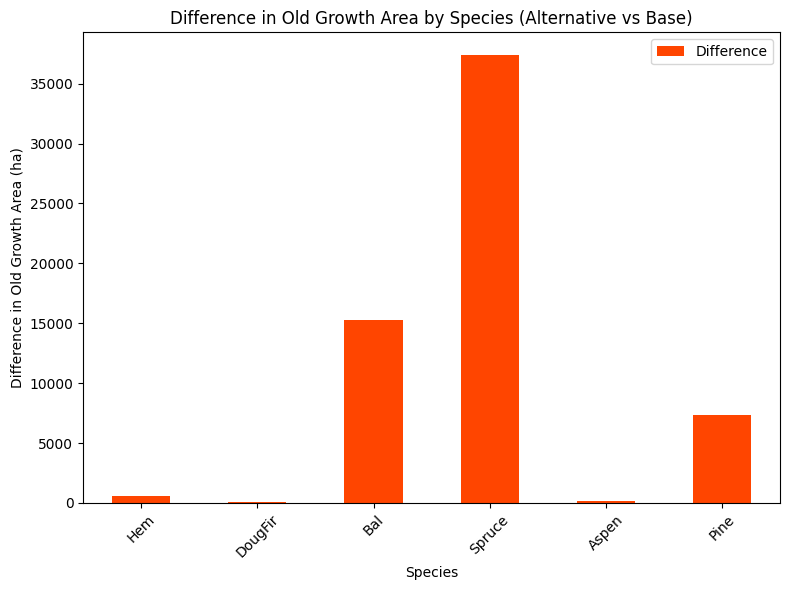

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


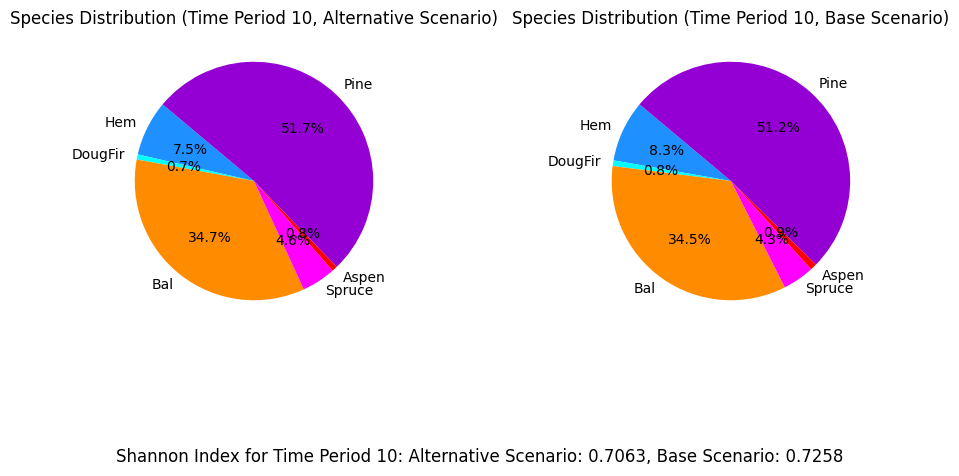

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_70%...
running the scenario for the Equity Silver mining site (70%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xa20fa253
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.28s
Presolved: 8375 r

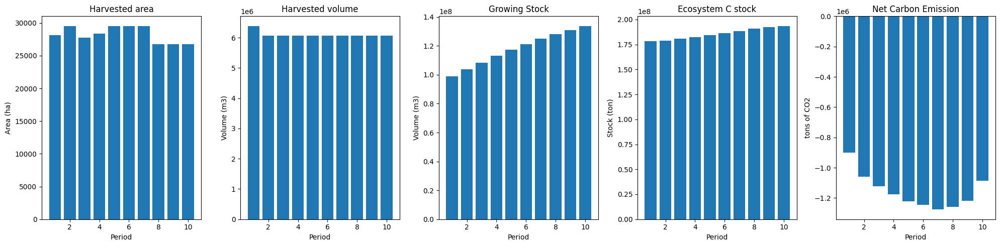

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_70%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  64510
The economic indicator (the provincial government revenues) is:  2199929
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


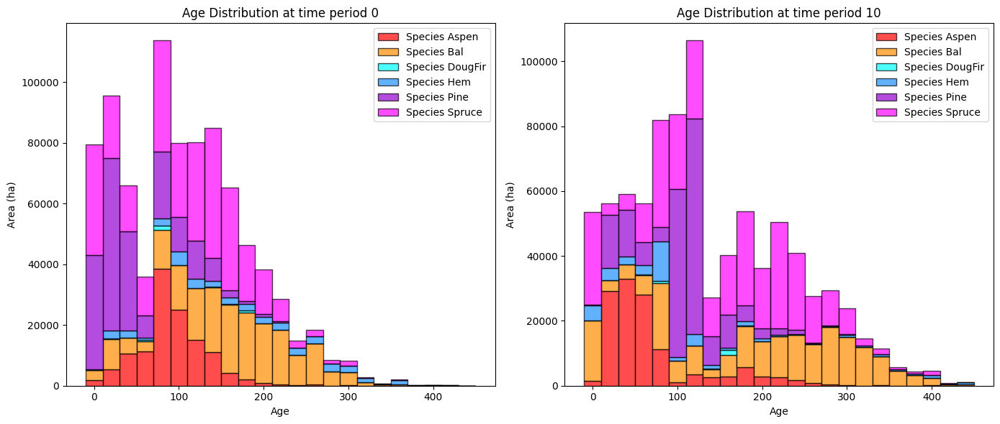

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_70%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229    7898.230694  -11253.896535
DougFir    947.047810    1720.458844     773.411034
Bal      59315.970469  107483.503494   48167.533026
Spruce   36410.744598  139012.955262  102602.210664
Aspen    29632.731169   21224.323056   -8408.408113
Pine      7432.733686   33943.049692   26510.316006

Old growth has **increased** by 158391.17 hectares from time period 0 to time period 10.


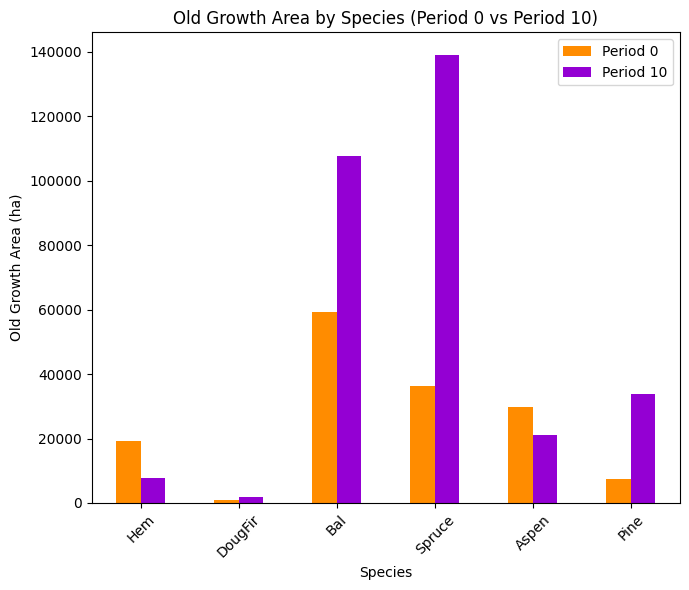

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_70%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.6987

Diversity has **decreased** by 6.05% from time 0 to time 10.


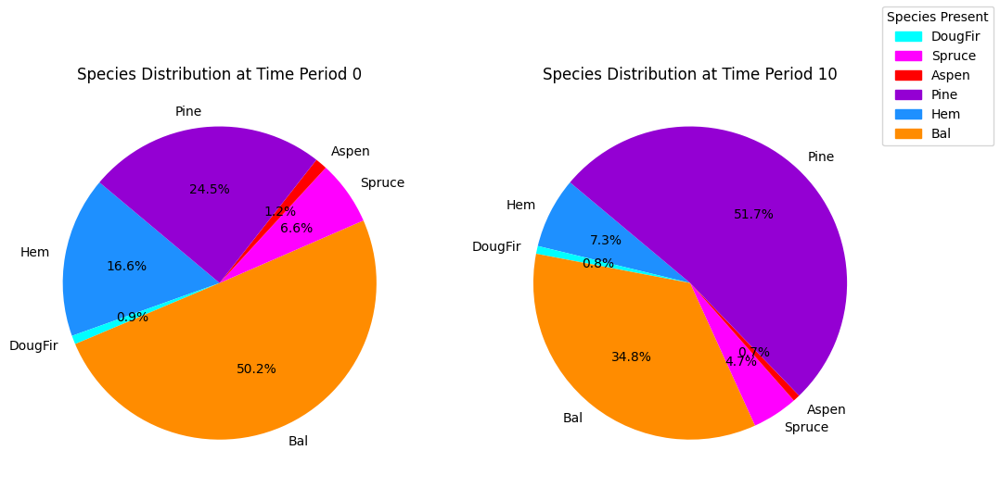

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_70%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.22s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

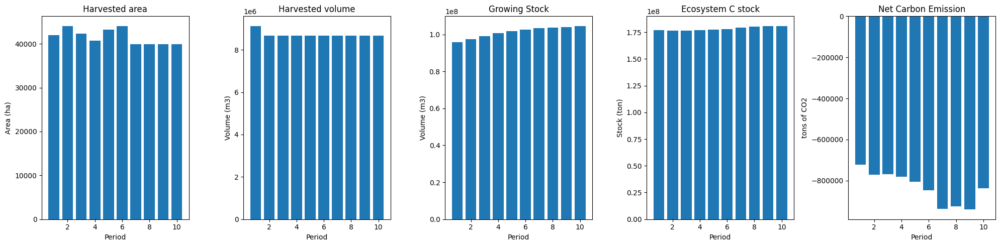

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


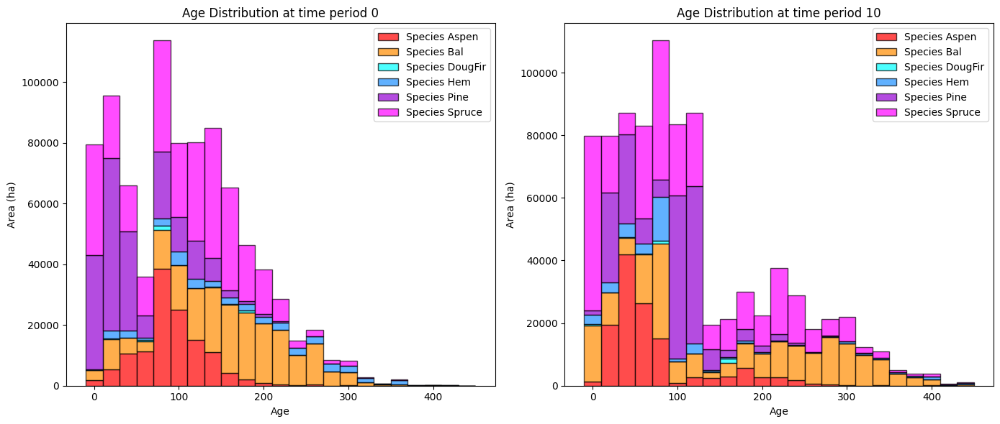

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


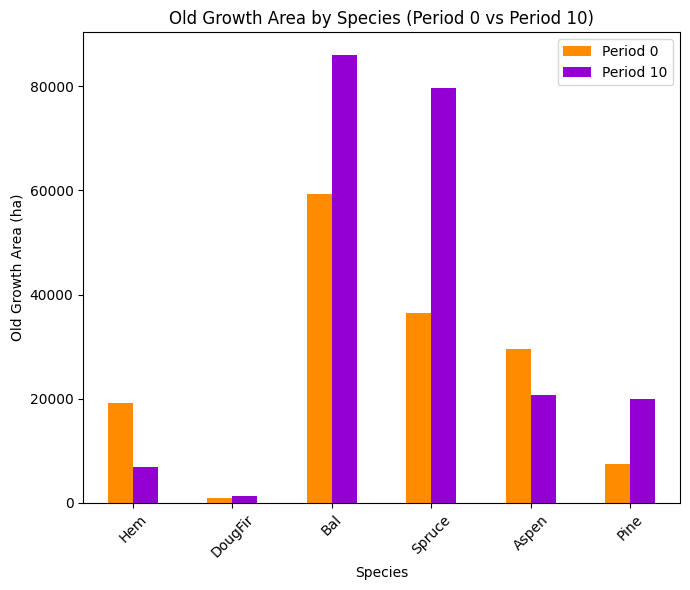

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


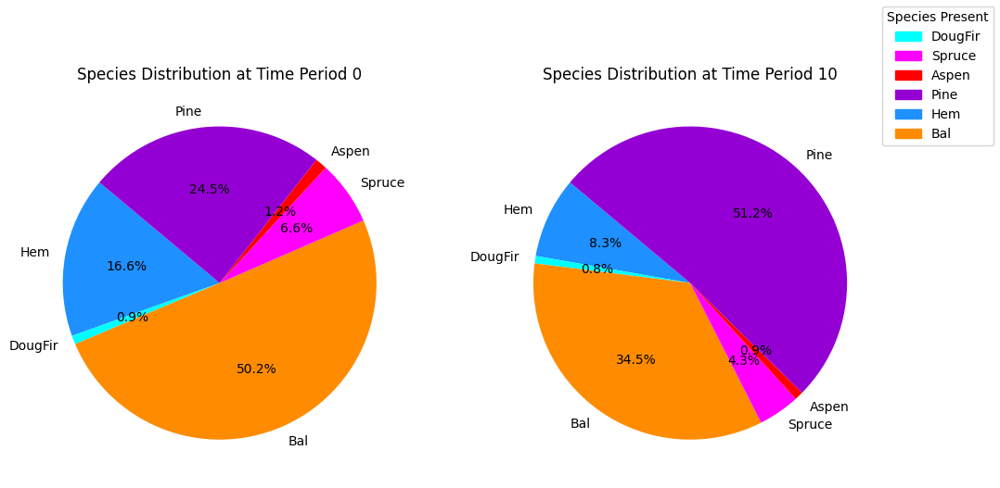

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


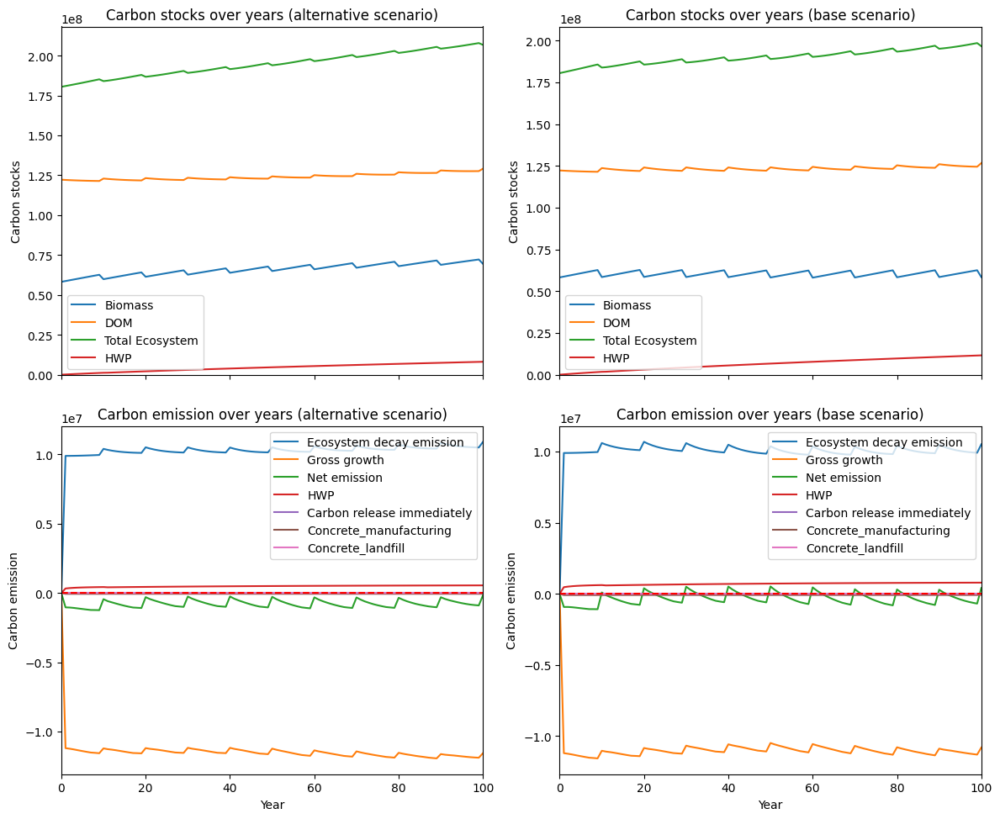

---------------------------------------------------------------------------------------
Net emission difference -45203645.57704431
Net emission base scenario -33180983.42591032
Net emission alternative scenario -78384629.00295463
dollar_per_ton is:  0.22122109560734818
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0    999.086309    999.086309
DougFir  0.0    406.595127    406.595127
Bal      0.0  21455.085657  21455.085657
Spruce   0.0  59417.777760  59417.777760
Aspen    0.0    458.952917    458.952917
Pine     0.0  14005.806598  14005.806598

Overall, the old growth area has **increased** by 96743.30 hectares in the alternative scenario compared to the base scenario.


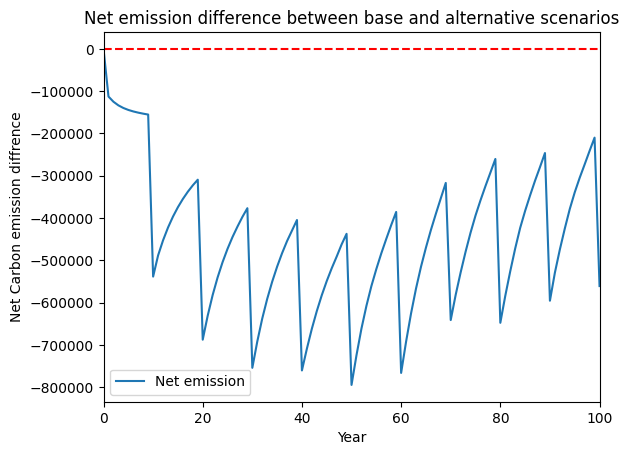

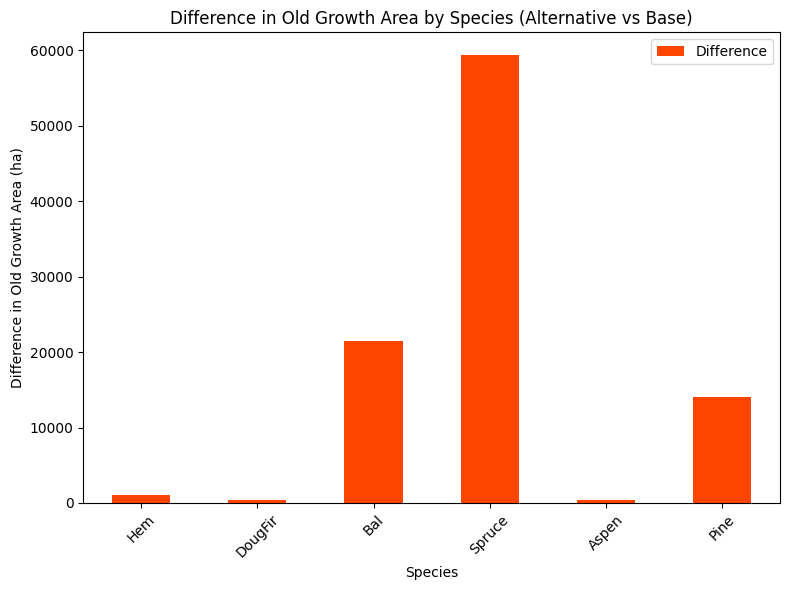

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


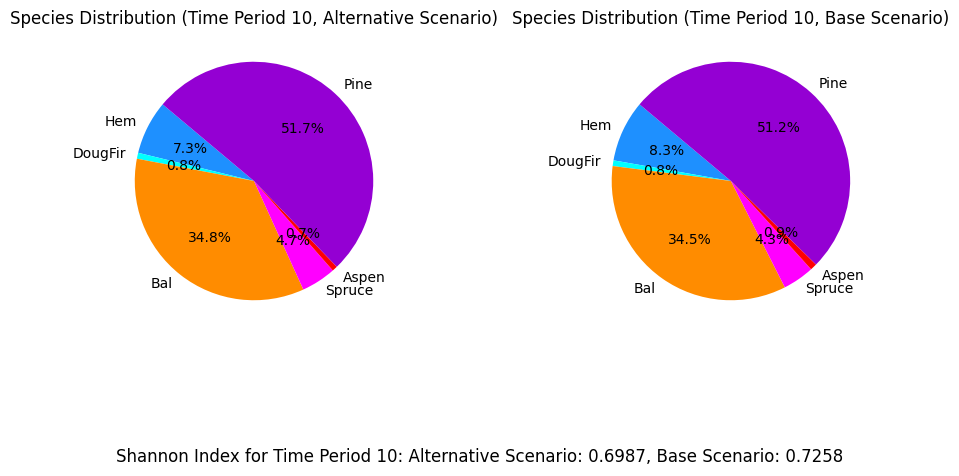

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_60%...
running the scenario for the Equity Silver mining site (60%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xe107331d
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.24s
Presolved: 8375 r

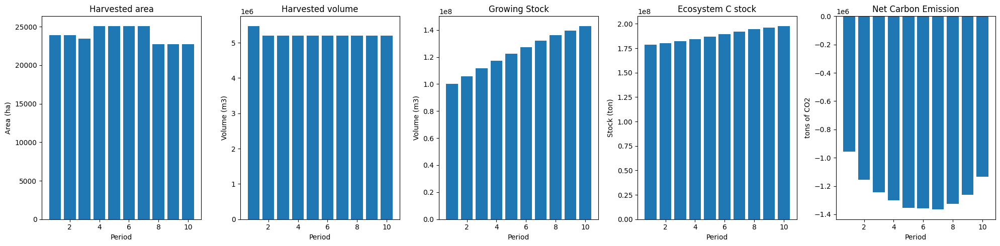

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_60%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  55294
The economic indicator (the provincial government revenues) is:  1885654
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


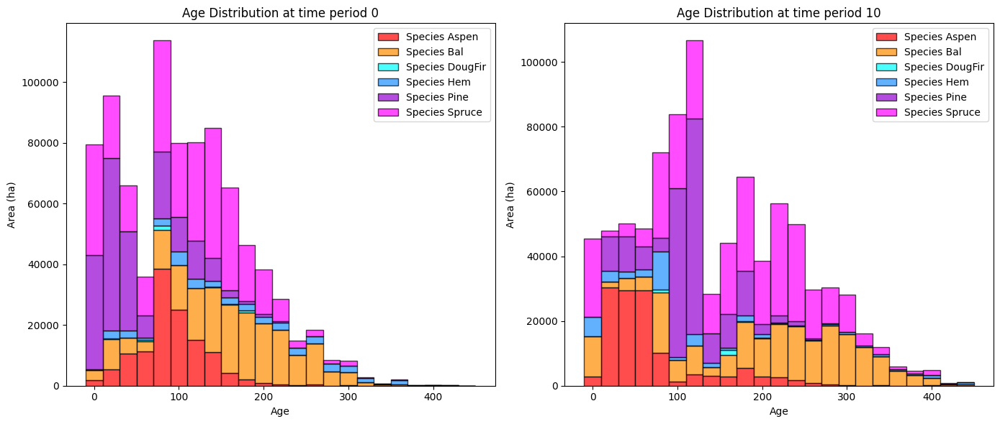

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_60%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229    8343.599207  -10808.528022
DougFir    947.047810    1891.569319     944.521509
Bal      59315.970469  118401.129880   59085.159412
Spruce   36410.744598  157365.447529  120954.702931
Aspen    29632.731169   21487.607177   -8145.123992
Pine      7432.733686   41644.564046   34211.830360

Old growth has **increased** by 196242.56 hectares from time period 0 to time period 10.


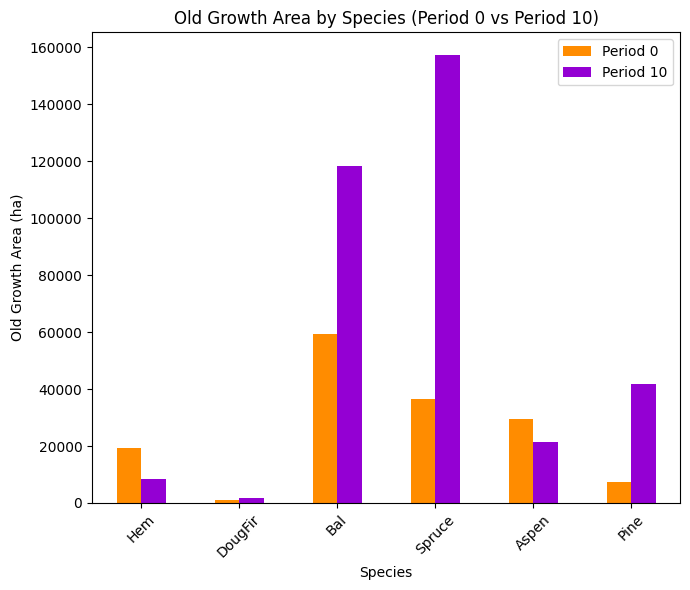

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_60%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.6929

Diversity has **decreased** by 6.63% from time 0 to time 10.


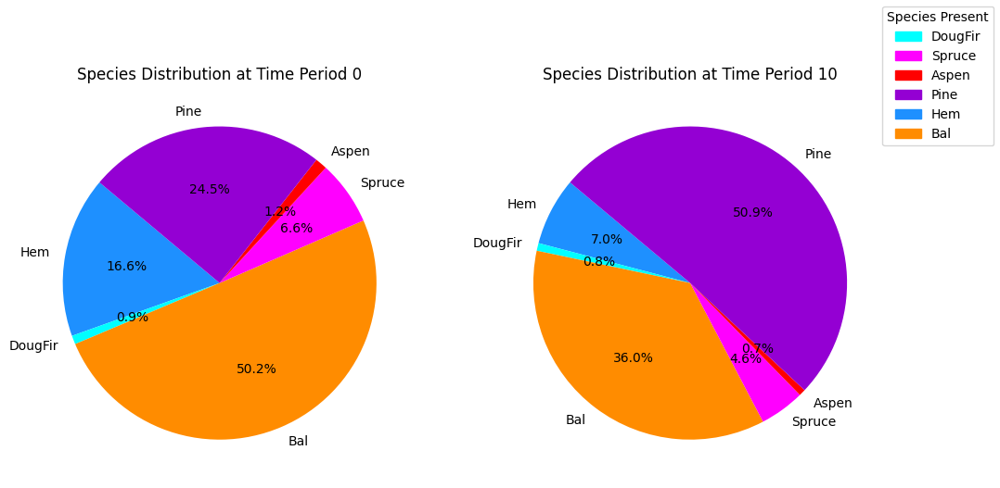

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_60%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.28s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

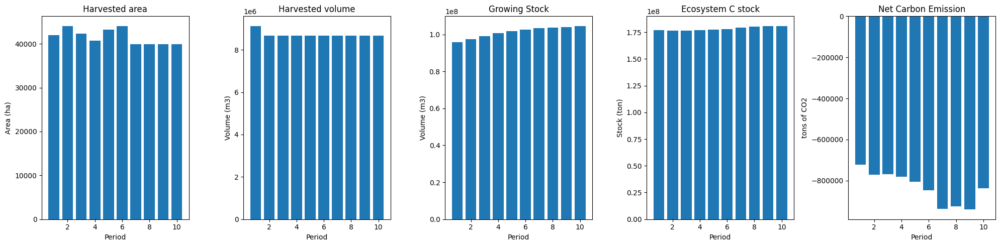

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


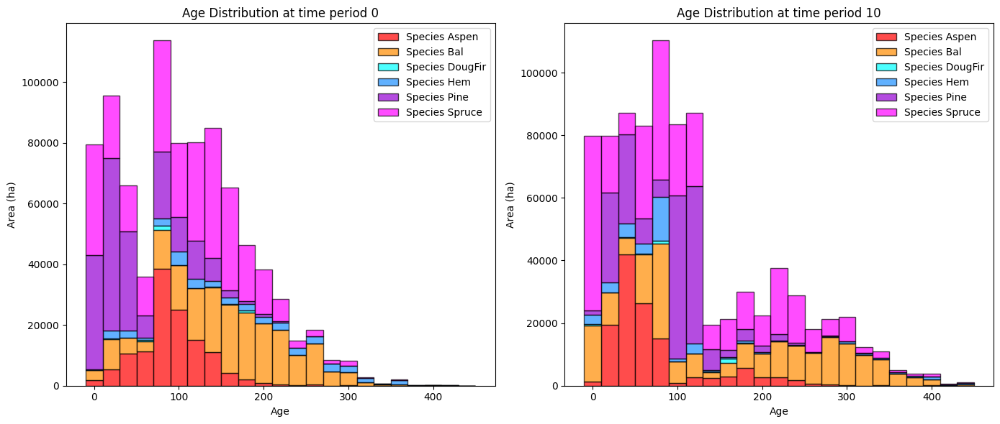

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


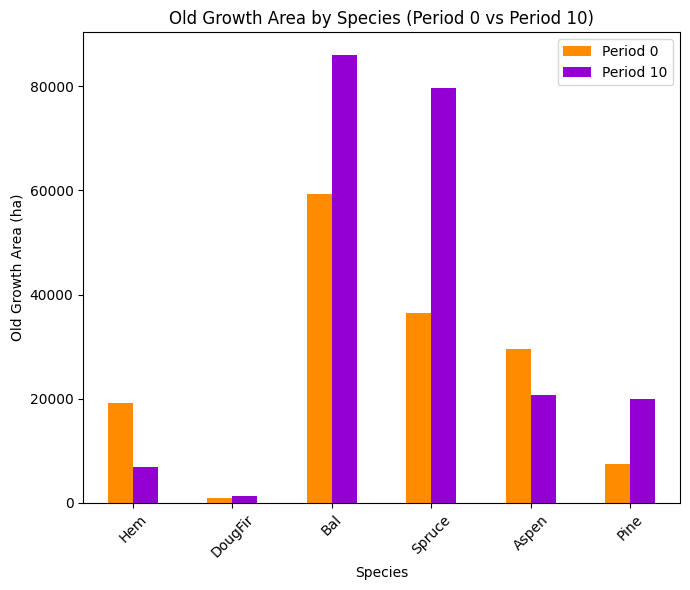

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


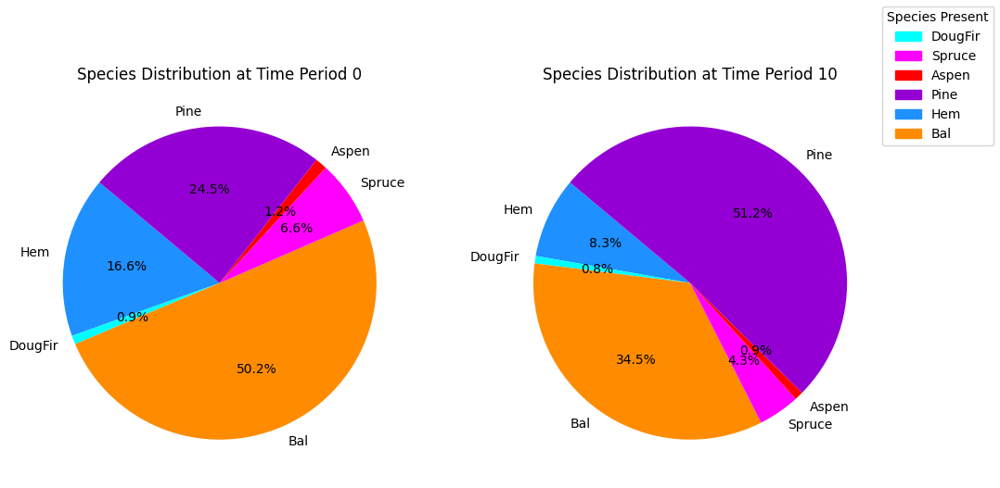

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


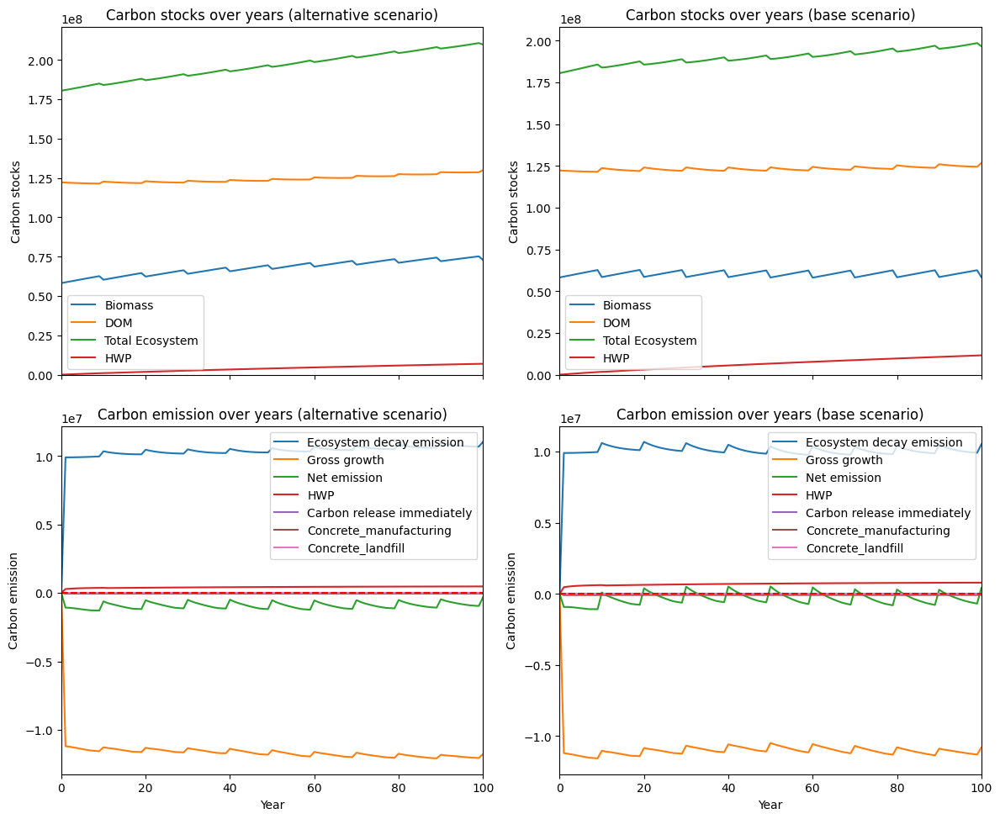

---------------------------------------------------------------------------------------
Net emission difference -59287501.78239057
Net emission base scenario -33180983.42591032
Net emission alternative scenario -92468485.20830089
dollar_per_ton is:  0.16866961331418717
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0   1444.454822   1444.454822
DougFir  0.0    577.705602    577.705602
Bal      0.0  32372.712043  32372.712043
Spruce   0.0  77770.270028  77770.270028
Aspen    0.0    722.237038    722.237038
Pine     0.0  21707.320952  21707.320952

Overall, the old growth area has **increased** by 134594.70 hectares in the alternative scenario compared to the base scenario.


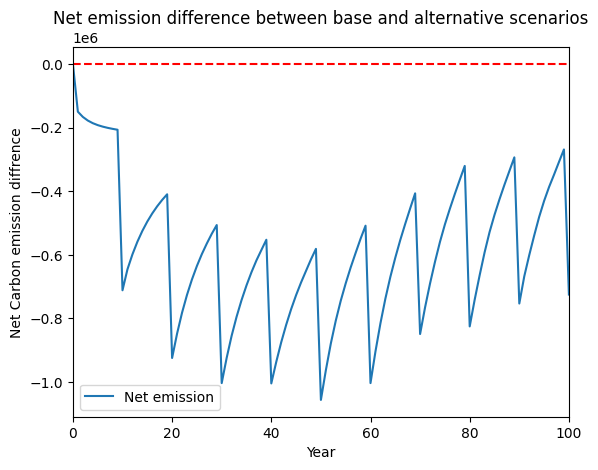

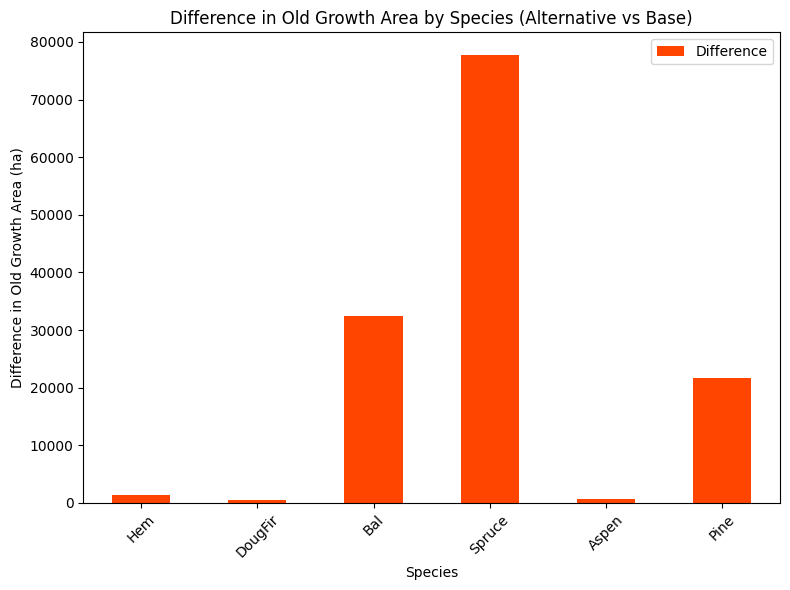

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


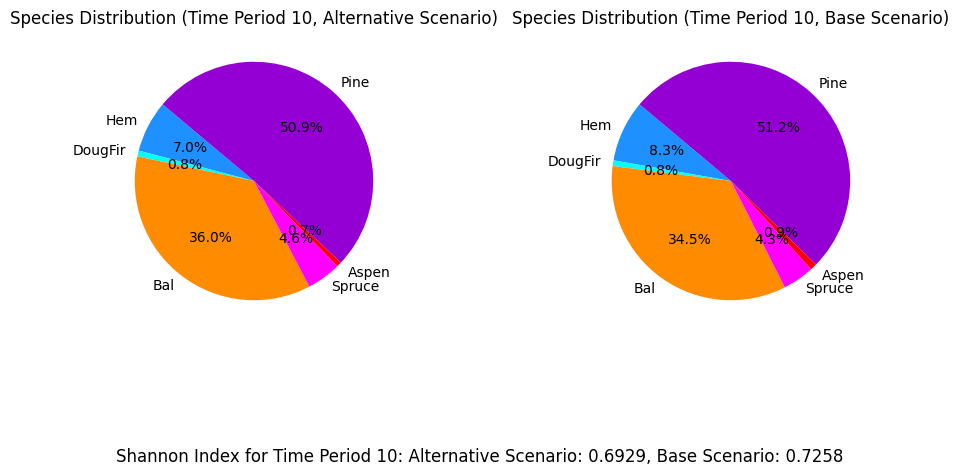

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_50%...
running the scenario for the Equity Silver mining site (50%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x2b70fcc3
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.24s
Presolved: 8375 r

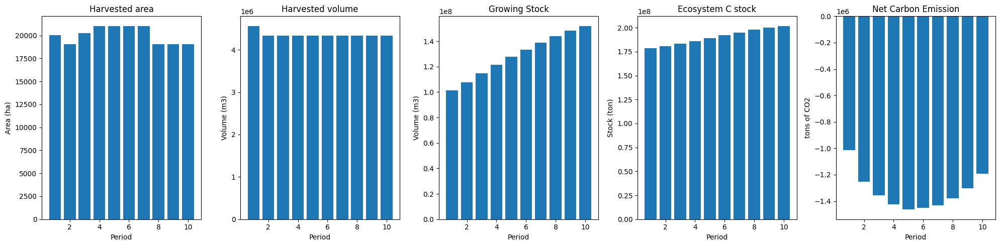

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  46078
The economic indicator (the provincial government revenues) is:  1571378
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


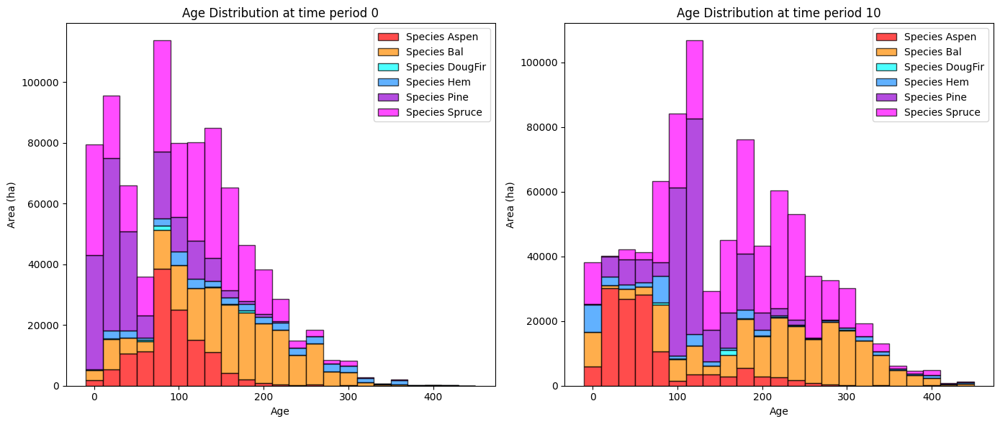

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   10814.920716   -8337.206513
DougFir    947.047810    1996.758201    1049.710391
Bal      59315.970469  127334.730981   68018.760512
Spruce   36410.744598  174630.075162  138219.330564
Aspen    29632.731169   21948.173666   -7684.557503
Pine      7432.733686   48233.729685   40800.995999

Old growth has **increased** by 232067.03 hectares from time period 0 to time period 10.


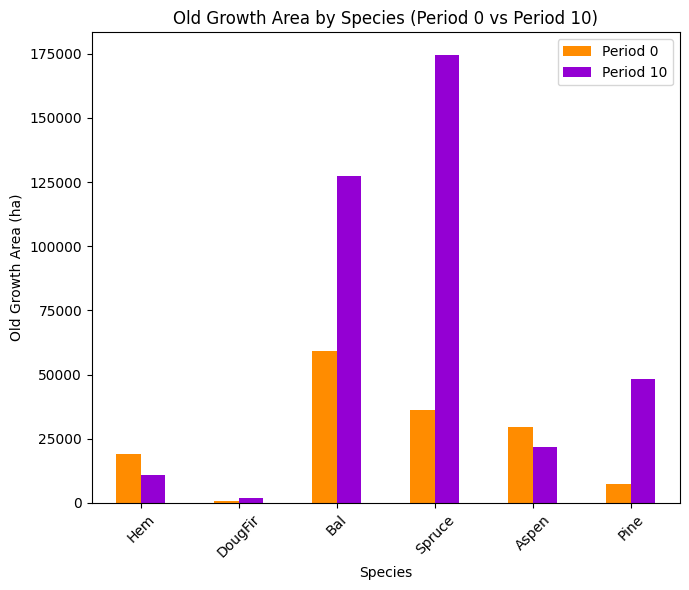

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.6930

Diversity has **decreased** by 6.61% from time 0 to time 10.


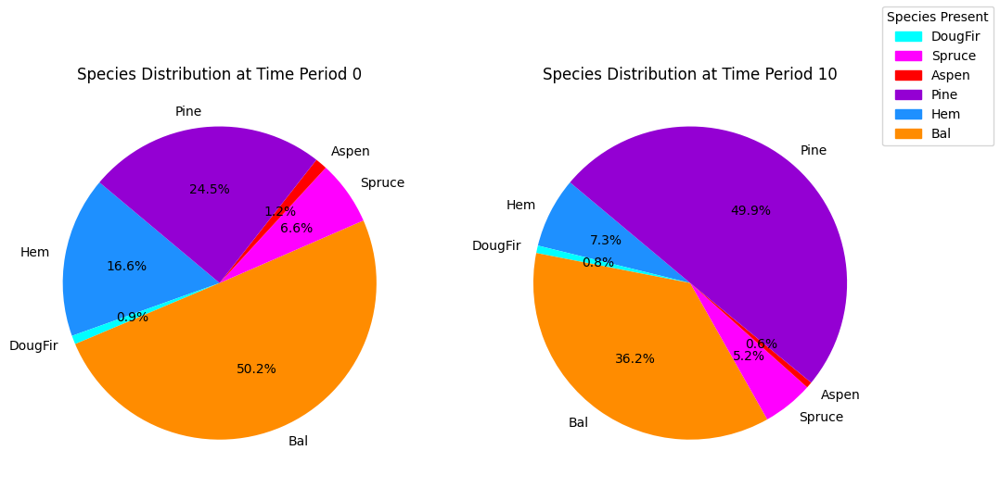

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.28s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

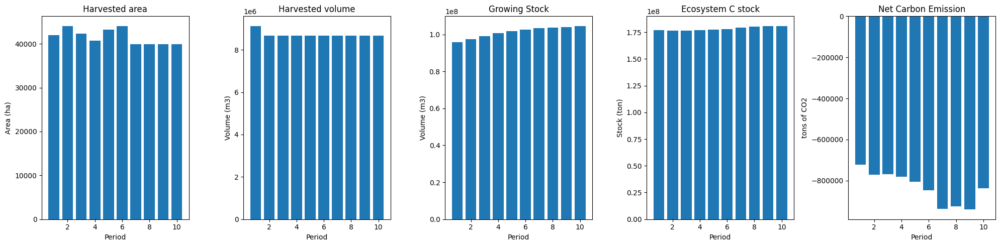

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------


In [ ]:
Start = time.time()
scenario_names = scenario_options.get(case_study, [])
for scenario_name in scenario_names:
    print(f"Running for {case_study}_{obj_mode}_{scenario_name}...")
    results_scenarios(fm, 
                      clt_percentage, 
                      credibility, 
                      budget_input, 
                      n_steps, 
                      max_harvest, 
                      scenario_name, 
                      displacement_effect, 
                      hwp_pool_effect_value, 
                      release_immediately_value, 
                      case_study, 
                      obj_mode,                   
                      pickle_output_base=False, 
                      pickle_output_alter=False)
print('It took', round((time.time() - Start) / 60, 1), "minutes to run all scenarios.")

Running for equitysilver_min_em_eqtslvr_AAC_50%...
running the scenario for the Equity Silver mining site (50%_AAC),
Set parameter Username
Academic license - for non-commercial use only - expires 2025-01-09
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x2b70fcc3
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.22s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier l

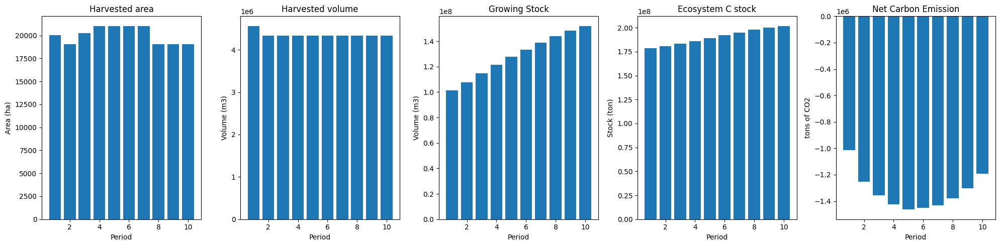

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  46078
The economic indicator (the provincial government revenues) is:  1571378
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


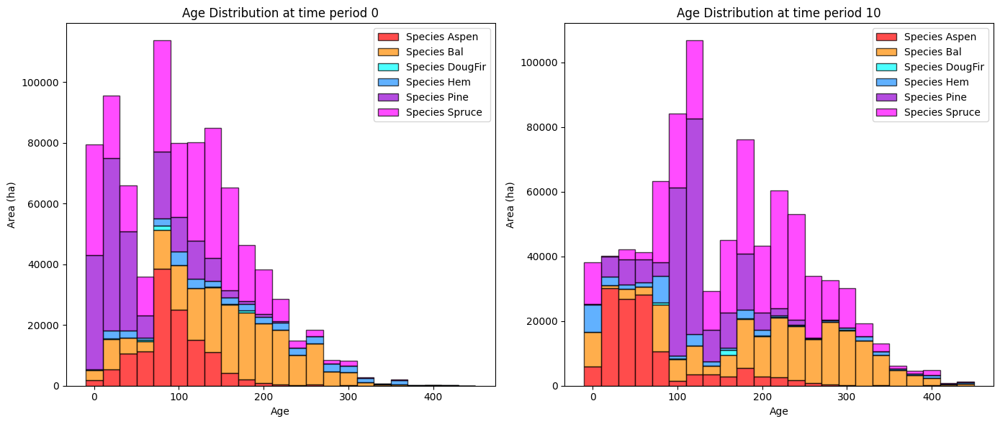

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   10814.920716   -8337.206513
DougFir    947.047810    1996.758201    1049.710391
Bal      59315.970469  127334.730981   68018.760512
Spruce   36410.744598  174630.075162  138219.330564
Aspen    29632.731169   21948.173666   -7684.557503
Pine      7432.733686   48233.729685   40800.995999

Old growth has **increased** by 232067.03 hectares from time period 0 to time period 10.


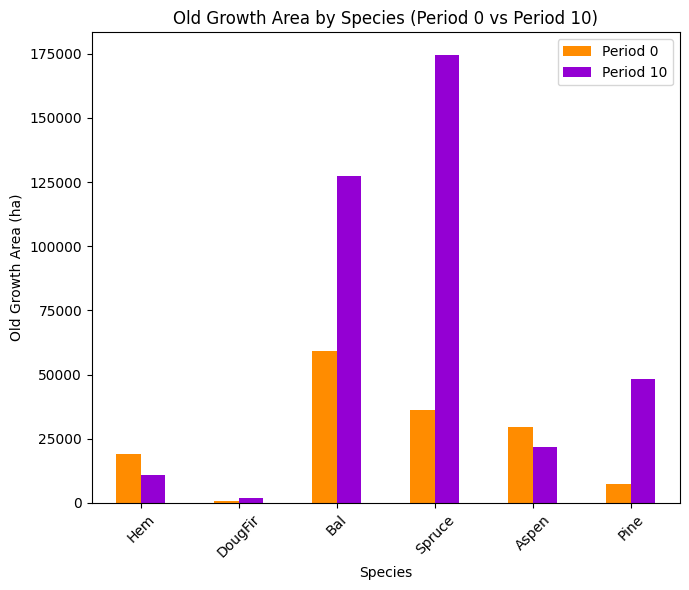

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.6930

Diversity has **decreased** by 6.61% from time 0 to time 10.


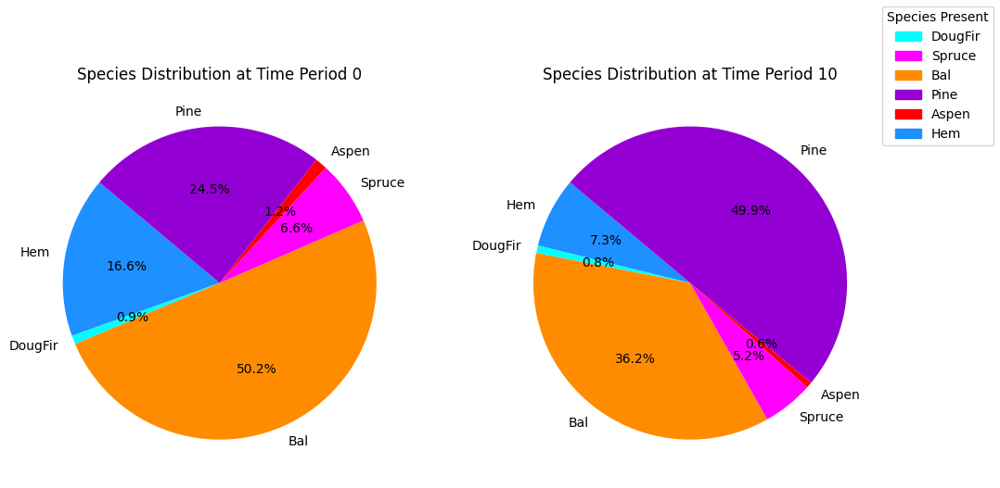

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_50%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.23s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

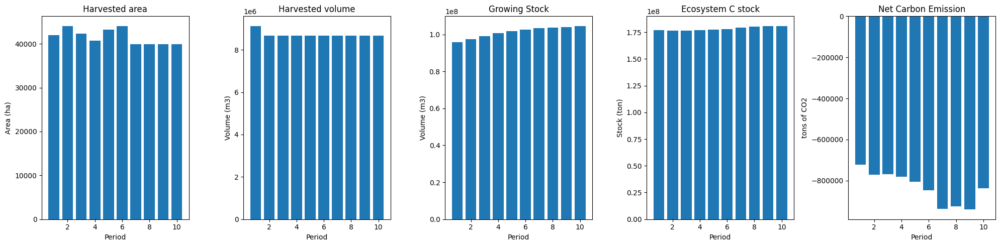

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


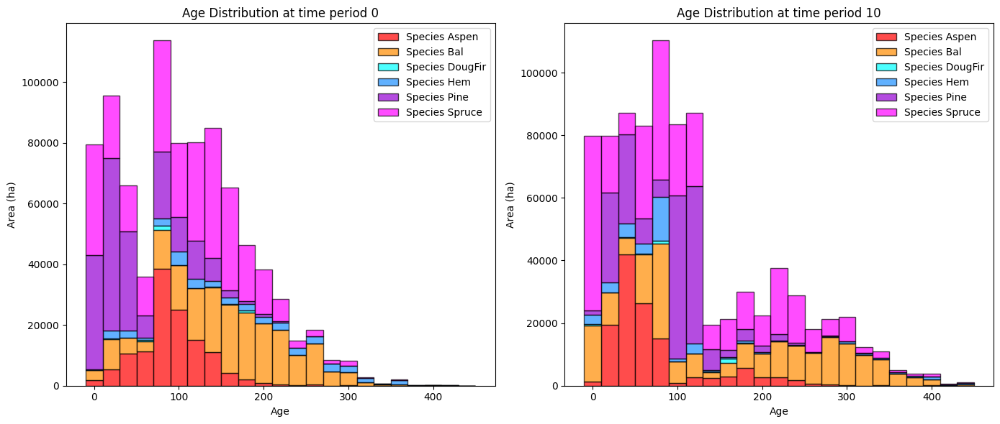

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


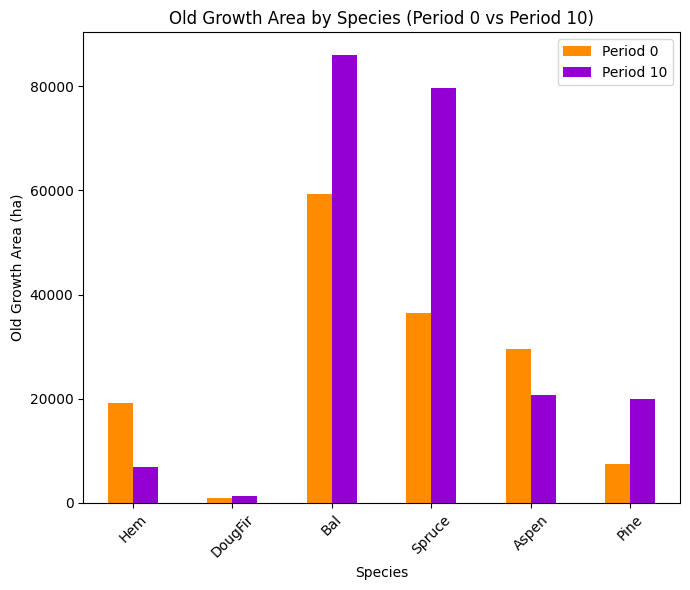

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


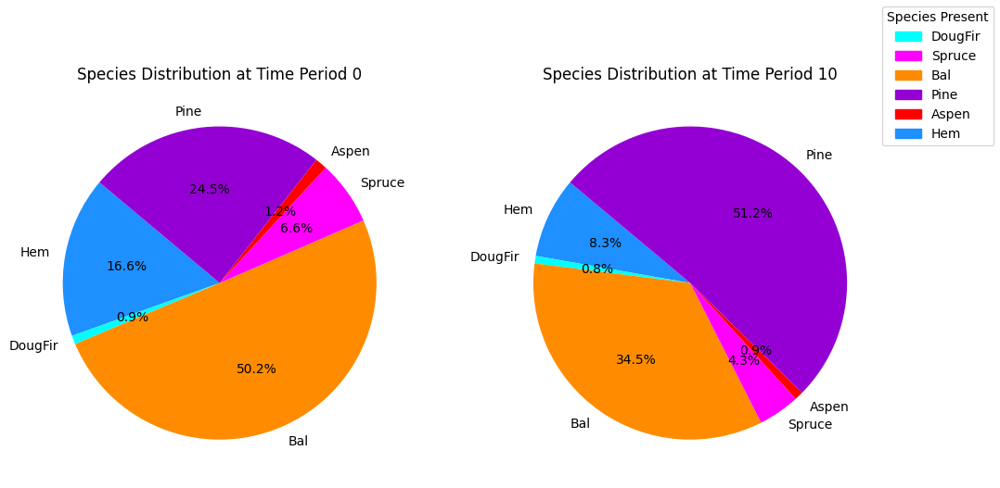

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


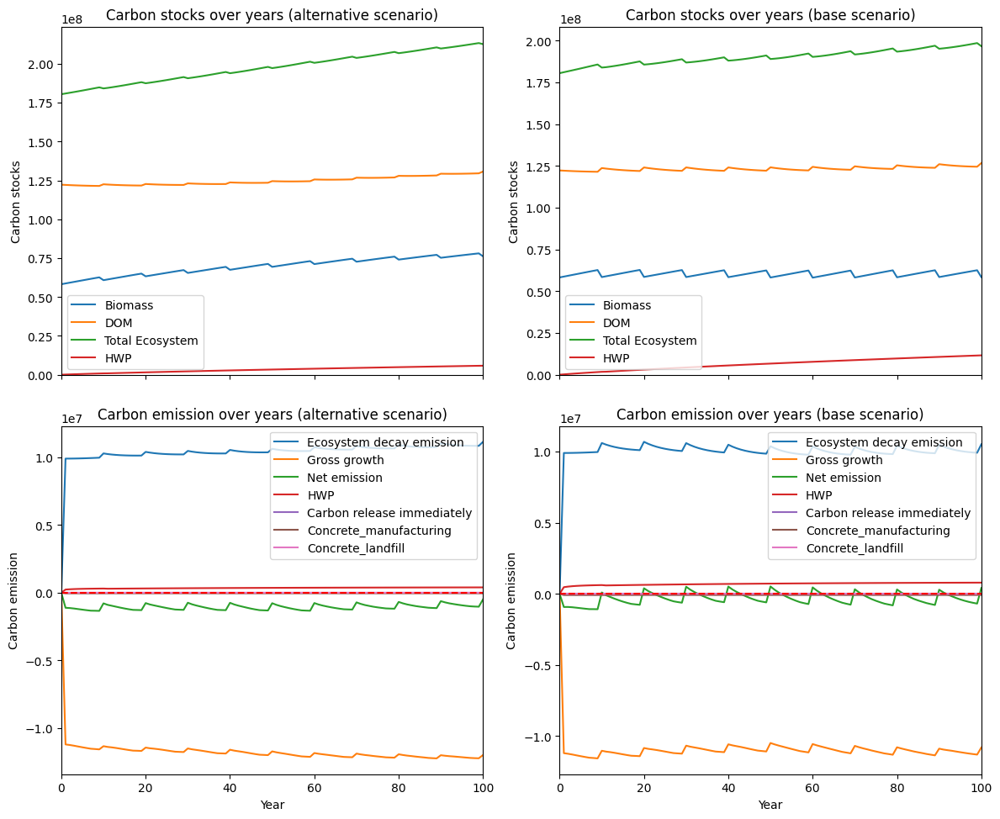

---------------------------------------------------------------------------------------
Net emission difference -72675933.12892014
Net emission base scenario -33180983.42591032
Net emission alternative scenario -105856916.55483046
dollar_per_ton is:  0.13759713249585606
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0   3915.776331   3915.776331
DougFir  0.0    682.894484    682.894484
Bal      0.0  41306.313144  41306.313144
Spruce   0.0  95034.897660  95034.897660
Aspen    0.0   1182.803527   1182.803527
Pine     0.0  28296.486591  28296.486591

Overall, the old growth area has **increased** by 170419.17 hectares in the alternative scenario compared to the base scenario.


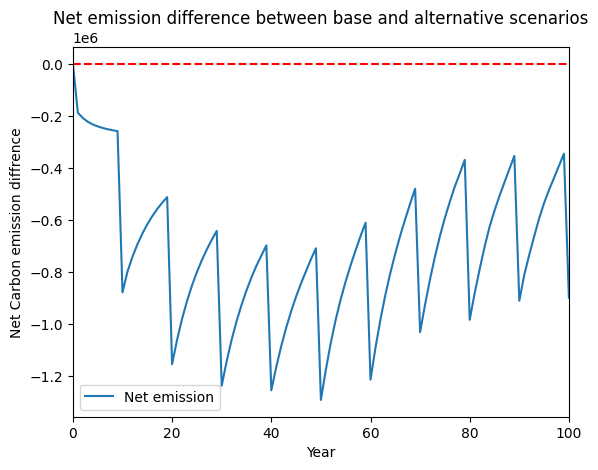

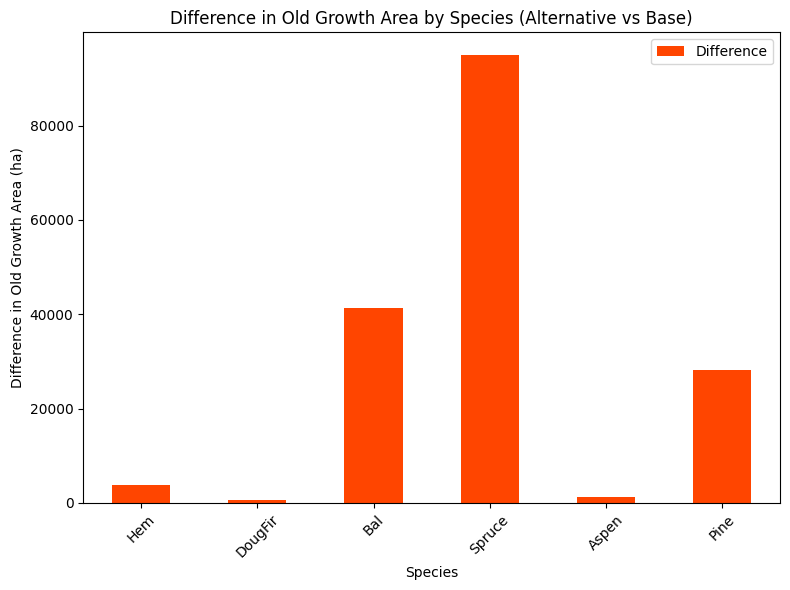

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


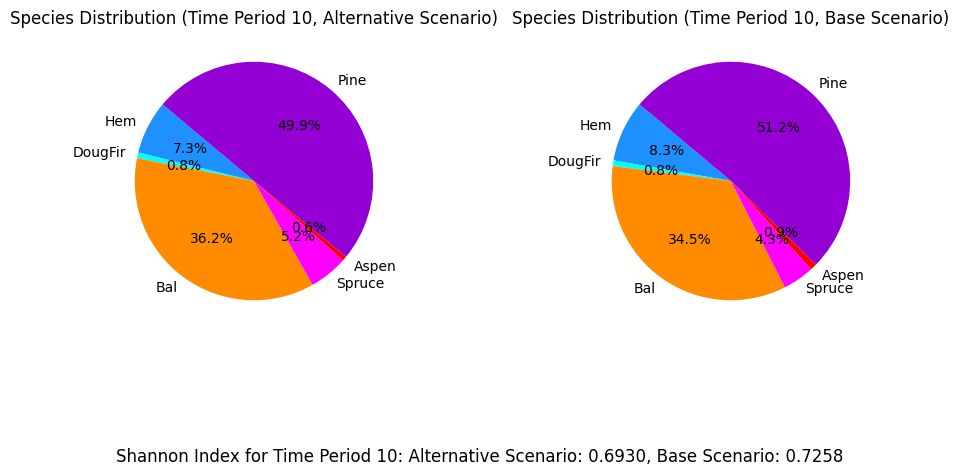

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_40%...
running the scenario for the Equity Silver mining site (40%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x66683318
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.23s
Presolved: 8375 r

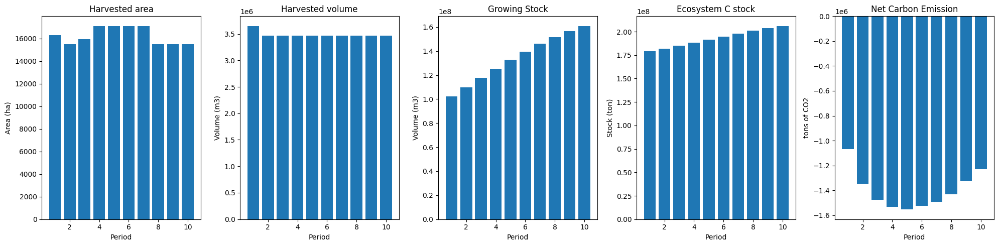

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_40%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  36862
The economic indicator (the provincial government revenues) is:  1257102
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


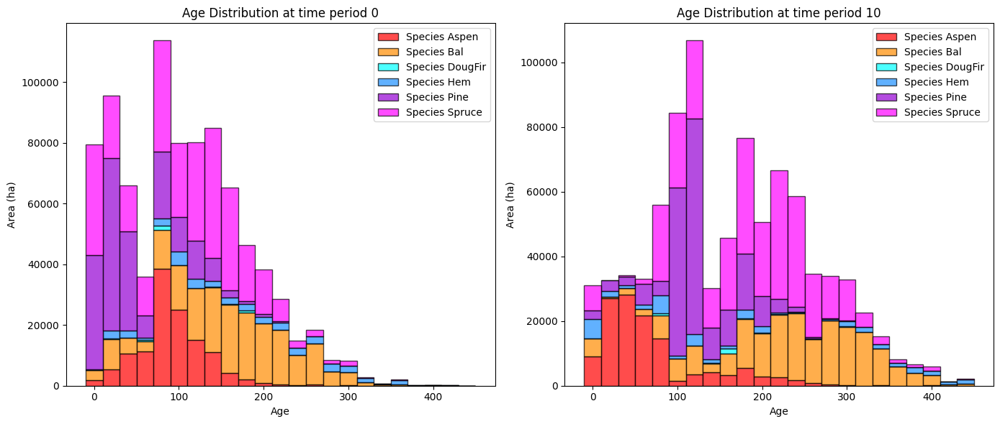

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_40%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   17400.239154   -1751.888075
DougFir    947.047810    2040.537711    1093.489901
Bal      59315.970469  141644.595271   82328.624802
Spruce   36410.744598  184219.698122  147808.953525
Aspen    29632.731169   22935.368583   -6697.362586
Pine      7432.733686   54307.531124   46874.797438

Old growth has **increased** by 269656.62 hectares from time period 0 to time period 10.


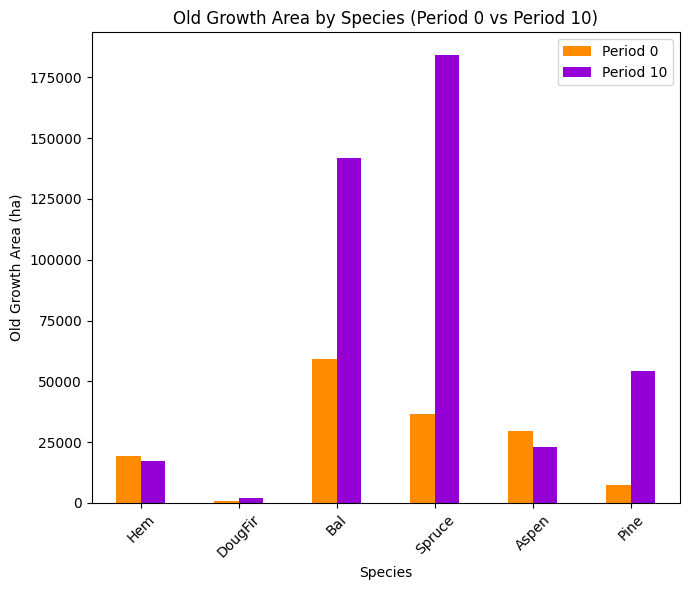

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_40%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.6971

Diversity has **decreased** by 6.20% from time 0 to time 10.


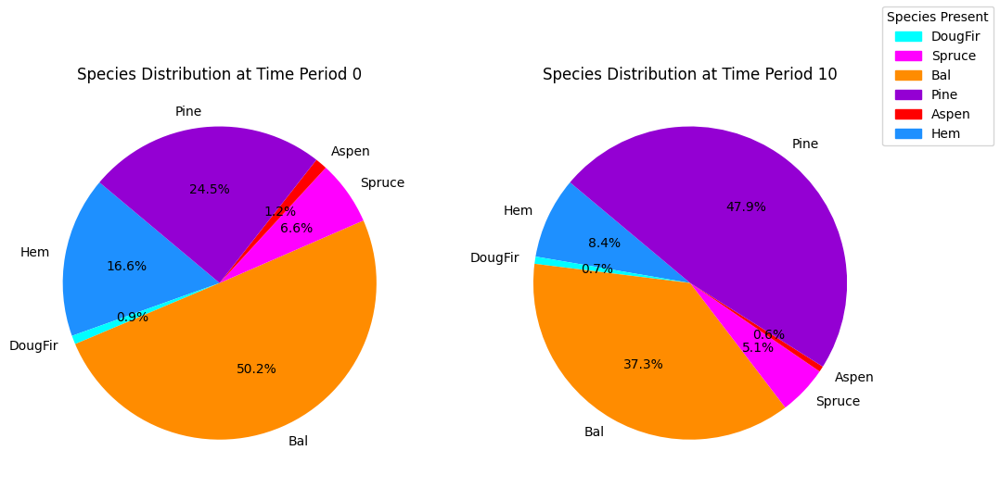

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_40%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.22s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

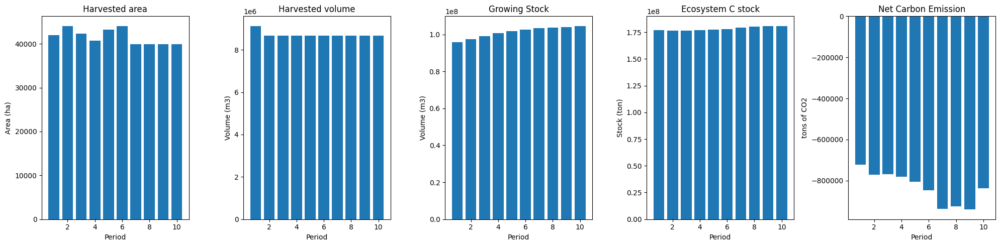

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


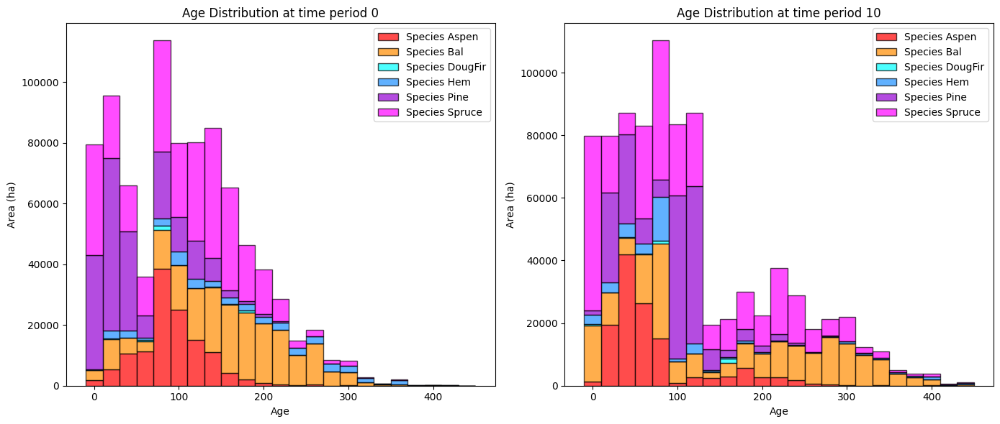

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


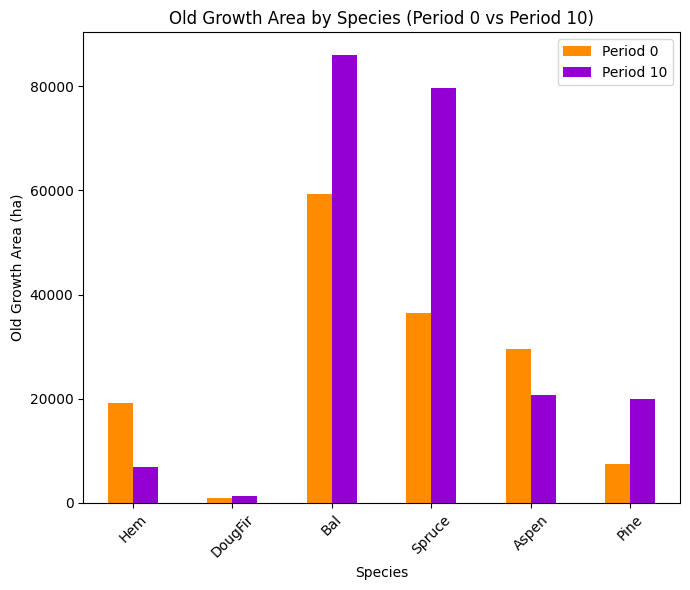

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


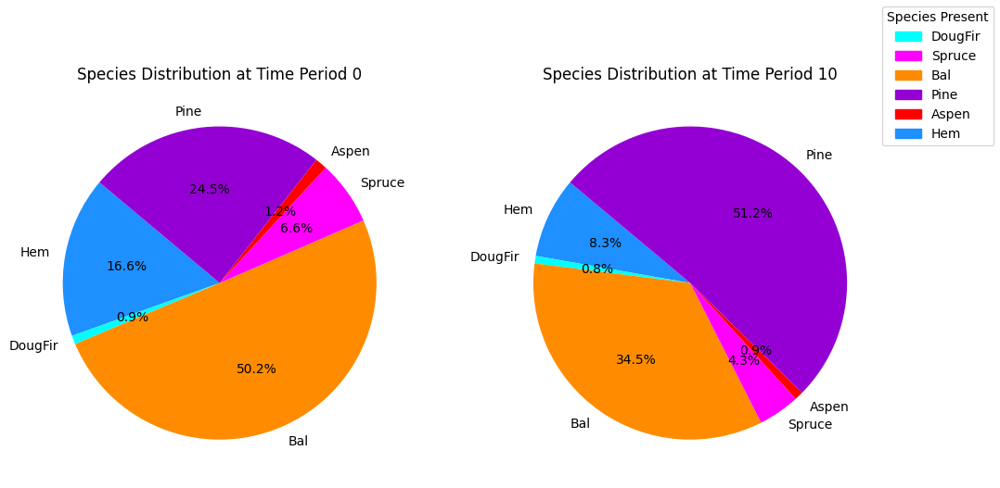

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


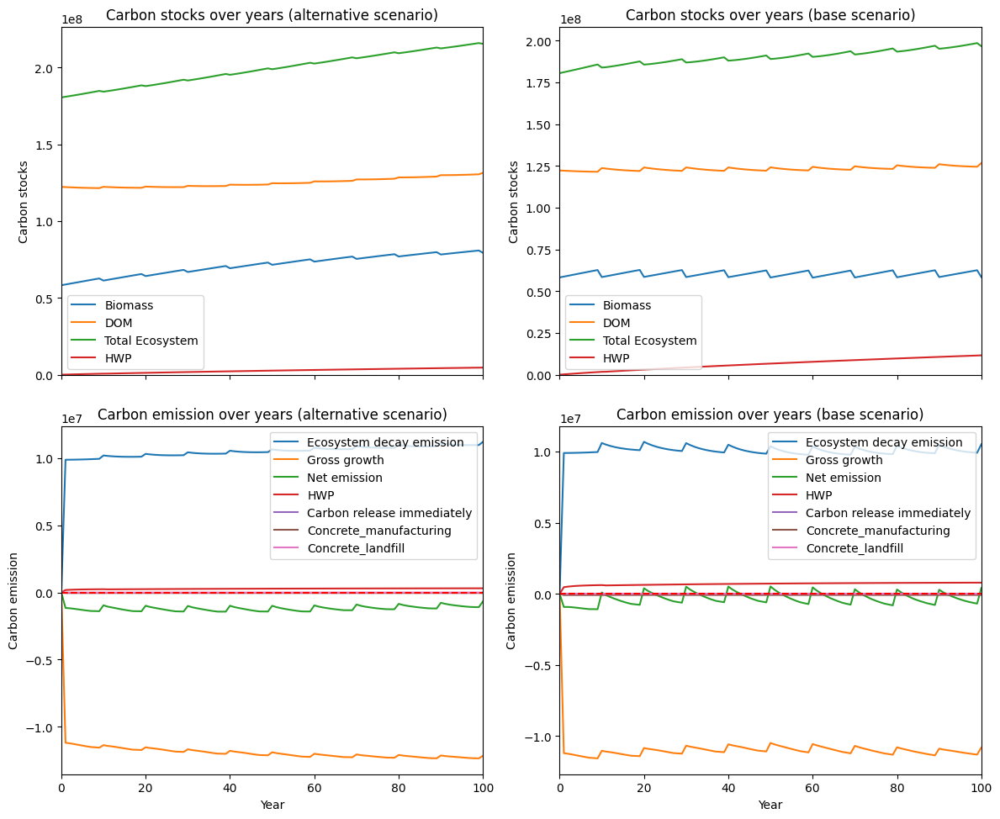

---------------------------------------------------------------------------------------
Net emission difference -85652121.03859198
Net emission base scenario -33180983.42591032
Net emission alternative scenario -118833104.4645023
dollar_per_ton is:  0.11675134110799584
Comparison of Old Growth Areas (Alternative - Base)
           0             10     Difference
Hem      0.0   10501.094769   10501.094769
DougFir  0.0     726.673993     726.673993
Bal      0.0   55616.177433   55616.177433
Spruce   0.0  104624.520621  104624.520621
Aspen    0.0    2169.998444    2169.998444
Pine     0.0   34370.288030   34370.288030

Overall, the old growth area has **increased** by 208008.75 hectares in the alternative scenario compared to the base scenario.


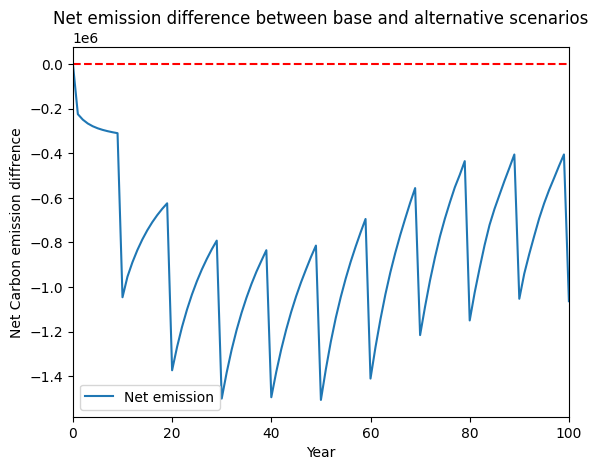

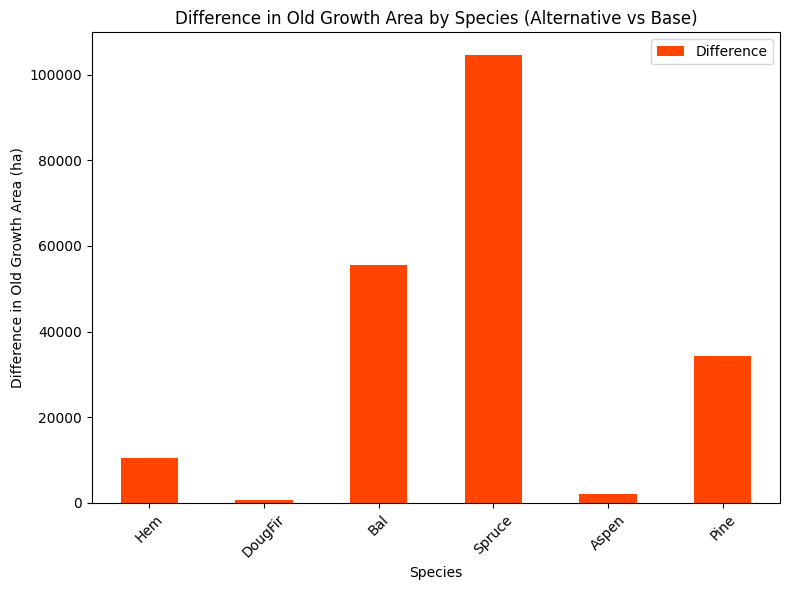

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


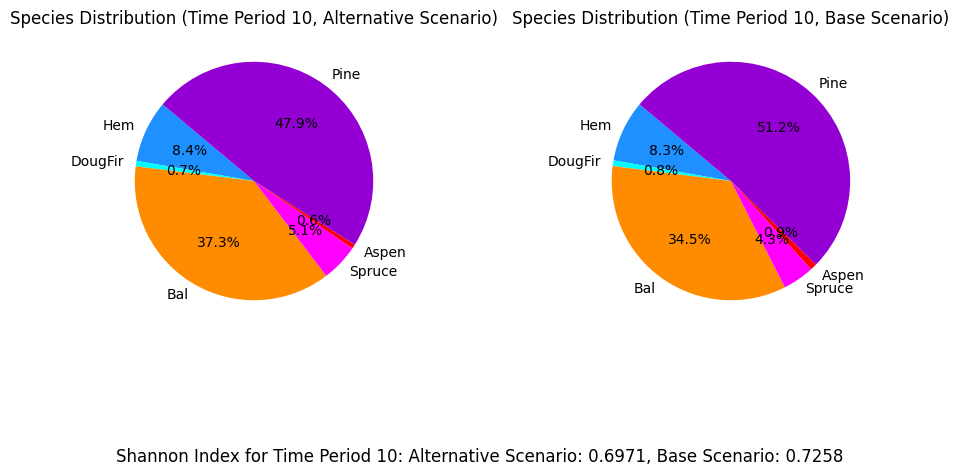

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_30%...
running the scenario for the Equity Silver mining site (30%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x2750aa72
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.23s
Presolved: 8375 r

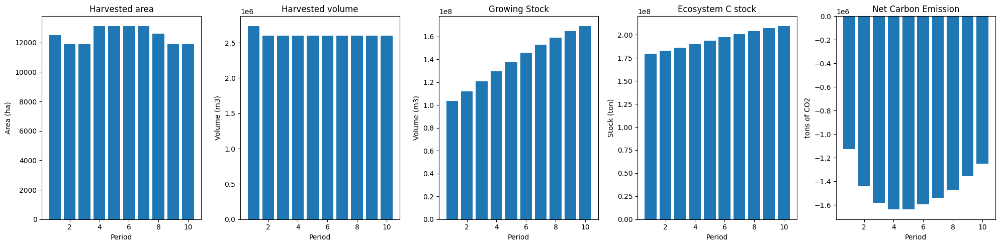

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_30%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  27647
The economic indicator (the provincial government revenues) is:  942827
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


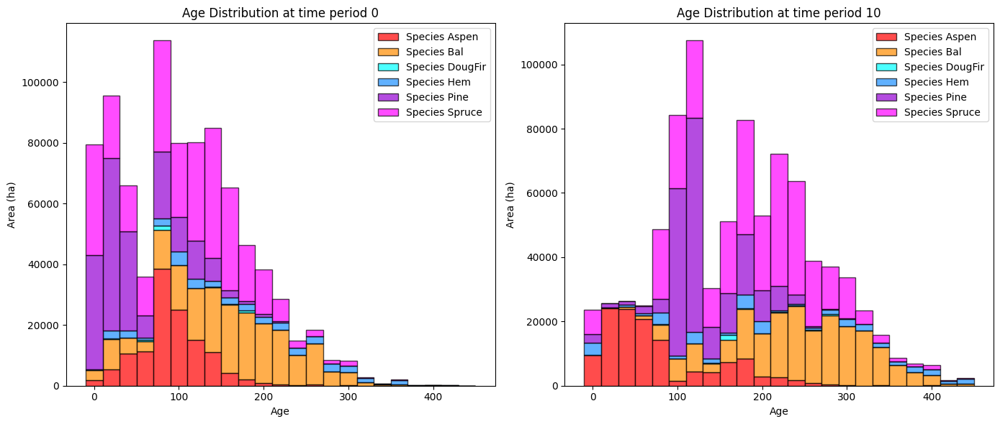

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_30%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   24411.926972    5259.799744
DougFir    947.047810    2645.801088    1698.753278
Bal      59315.970469  152028.073845   92712.103376
Spruce   36410.744598  188045.551764  151634.807166
Aspen    29632.731169   30330.376843     697.645673
Pine      7432.733686   61685.841148   54253.107462

Old growth has **increased** by 306256.22 hectares from time period 0 to time period 10.


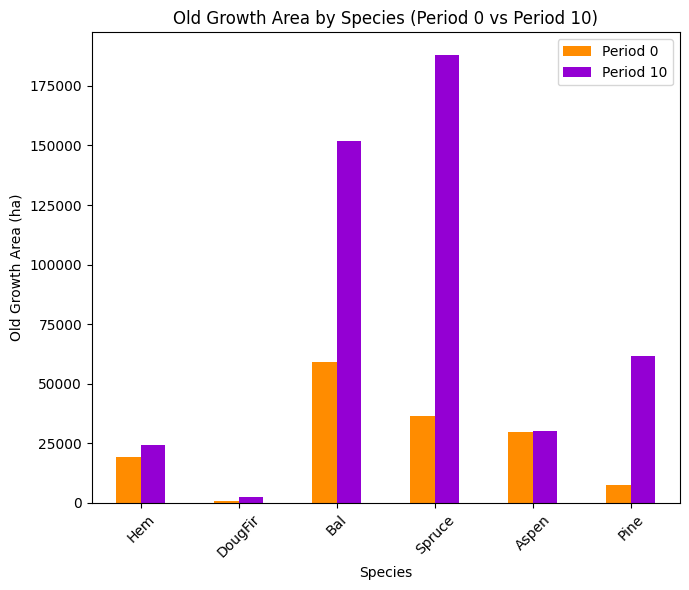

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_30%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7071

Diversity has **decreased** by 5.21% from time 0 to time 10.


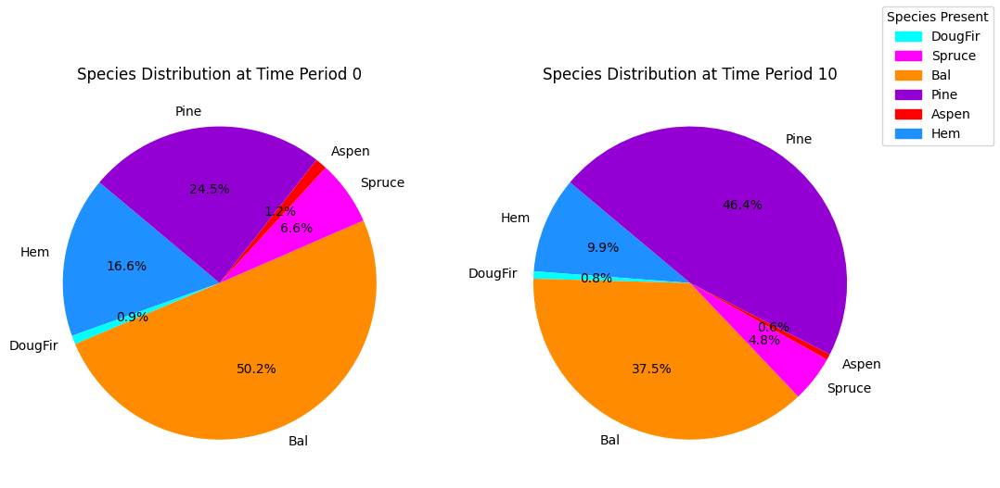

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_30%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.24s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

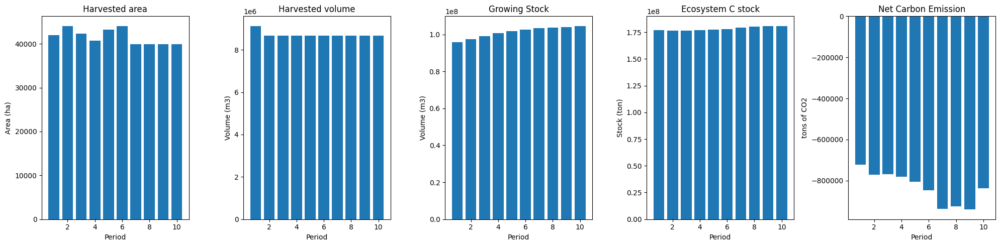

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


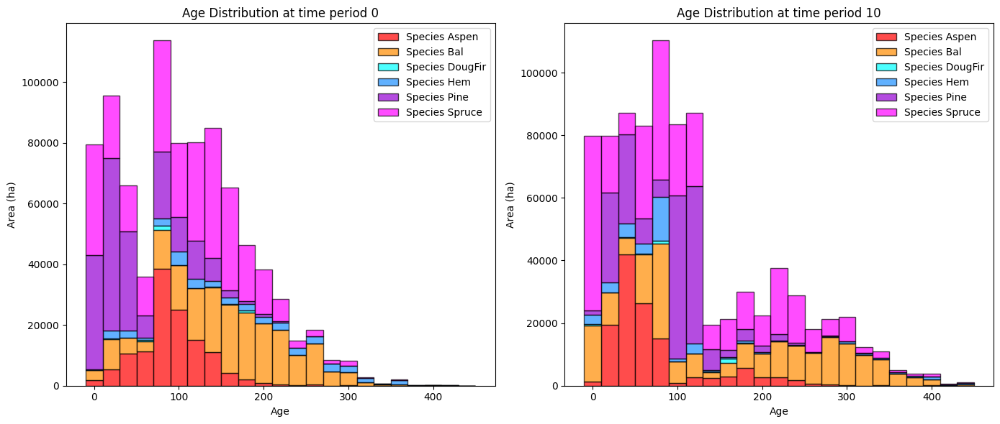

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


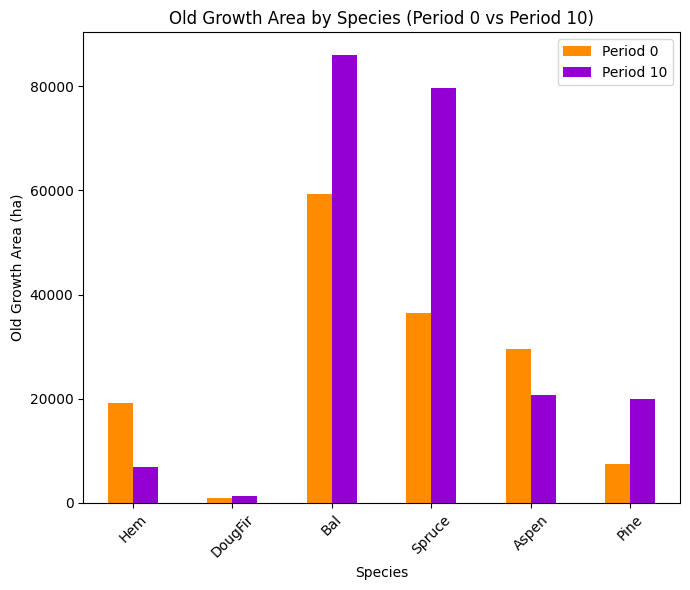

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


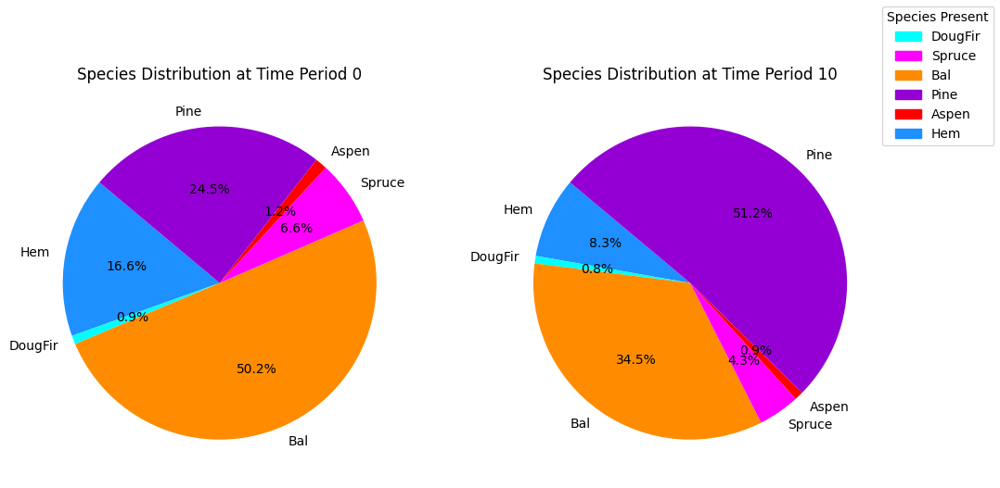

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


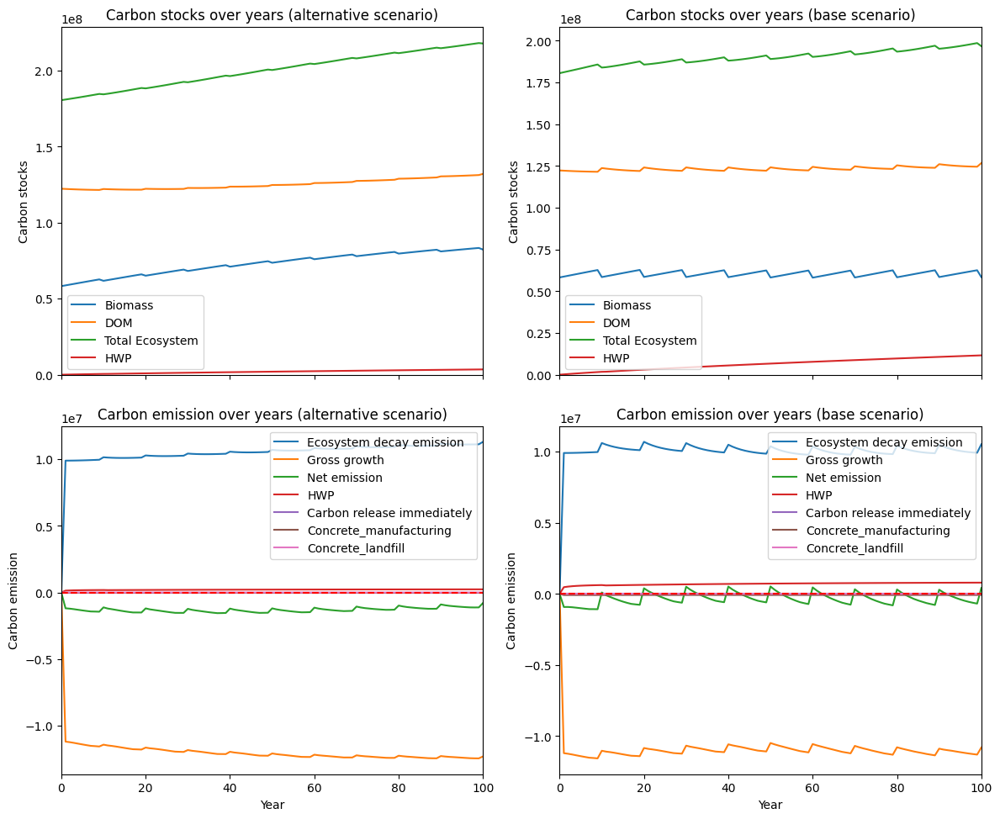

---------------------------------------------------------------------------------------
Net emission difference -97094844.27113591
Net emission base scenario -33180983.42591032
Net emission alternative scenario -130275827.69704625
dollar_per_ton is:  0.10299208032174344
Comparison of Old Growth Areas (Alternative - Base)
           0             10     Difference
Hem      0.0   17512.782588   17512.782588
DougFir  0.0    1331.937370    1331.937370
Bal      0.0   65999.656008   65999.656008
Spruce   0.0  108450.374262  108450.374262
Aspen    0.0    9565.006703    9565.006703
Pine     0.0   41748.598053   41748.598053

Overall, the old growth area has **increased** by 244608.35 hectares in the alternative scenario compared to the base scenario.


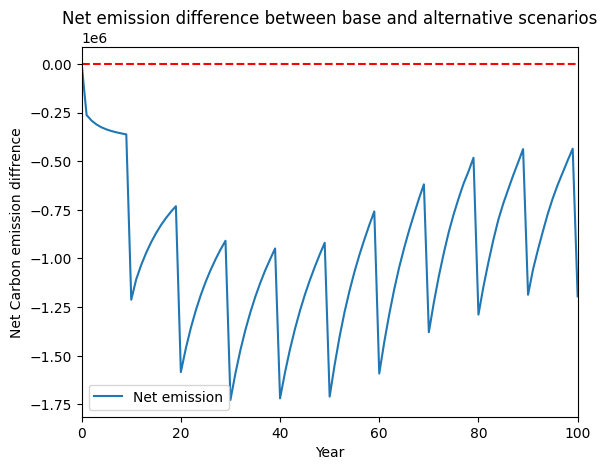

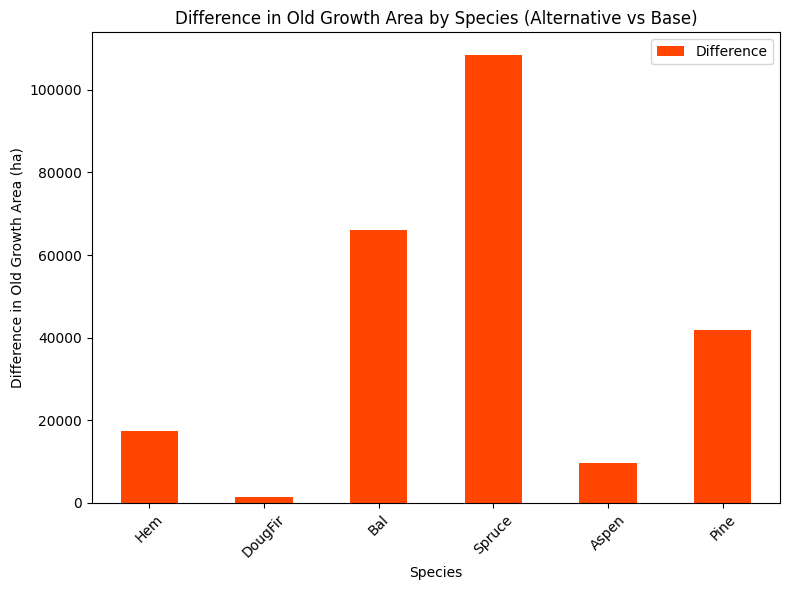

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


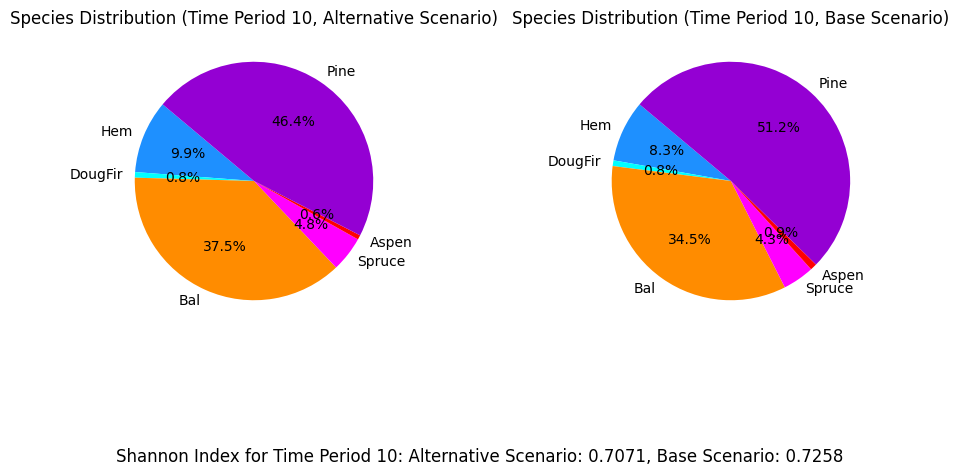

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_20%...
running the scenario for the Equity Silver mining site (20%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x41bd1f6a
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.23s
Presolved: 8375 r

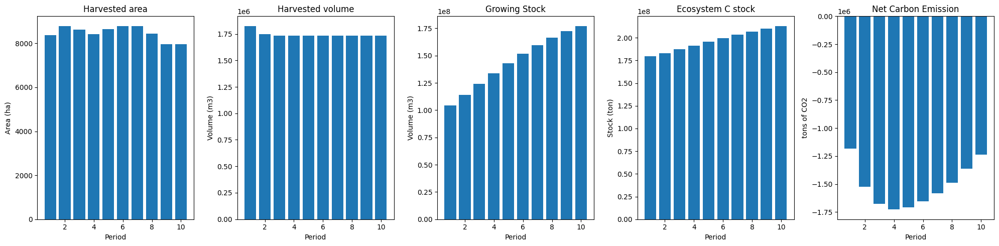

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_20%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  18443
The economic indicator (the provincial government revenues) is:  628976
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


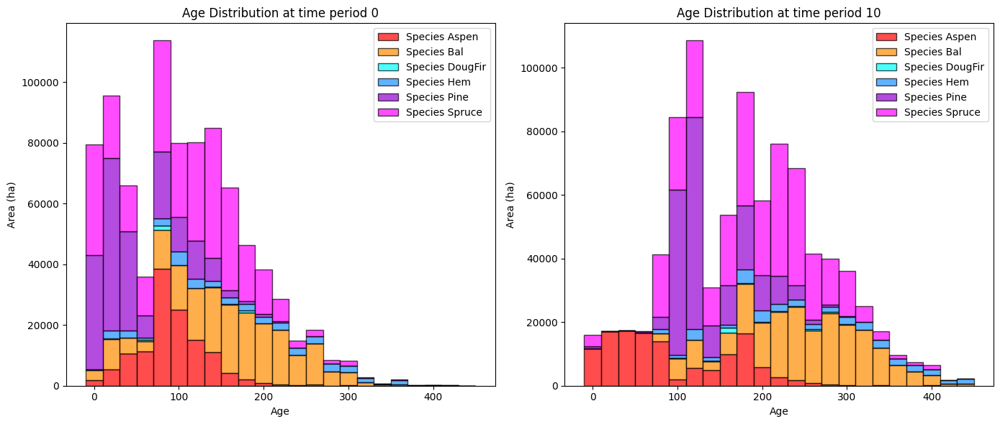

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_20%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   31417.407527   12265.280298
DougFir    947.047810    2749.298212    1802.250402
Bal      59315.970469  156280.549089   96964.578620
Spruce   36410.744598  194399.769736  157989.025138
Aspen    29632.731169   45224.869172   15592.138002
Pine      7432.733686   68653.588755   61220.855069

Old growth has **increased** by 345834.13 hectares from time period 0 to time period 10.


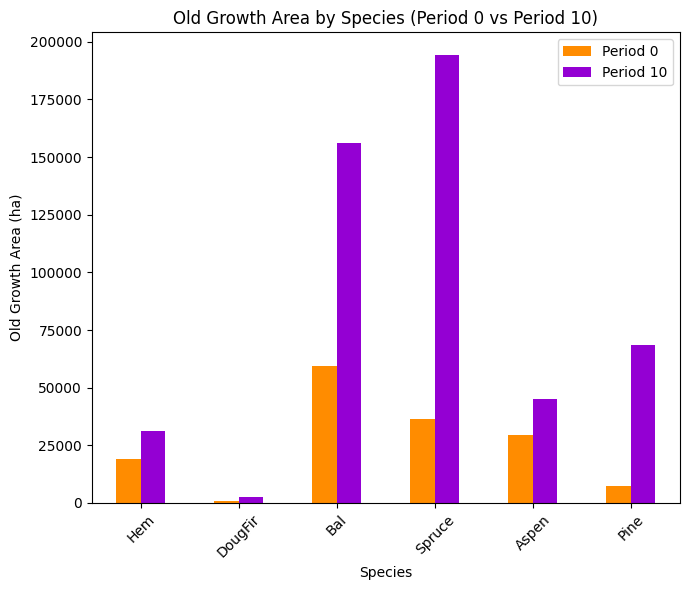

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_20%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7228

Diversity has **decreased** by 3.64% from time 0 to time 10.


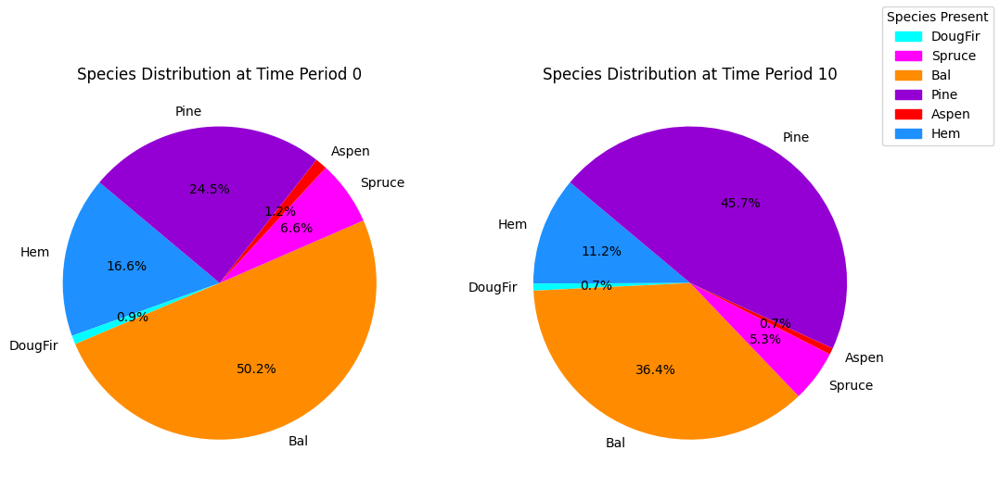

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_20%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.23s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

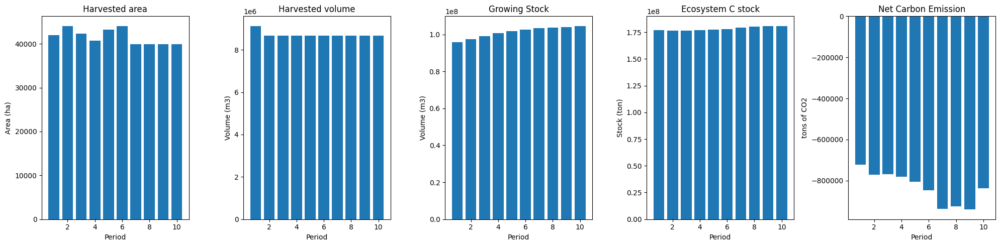

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


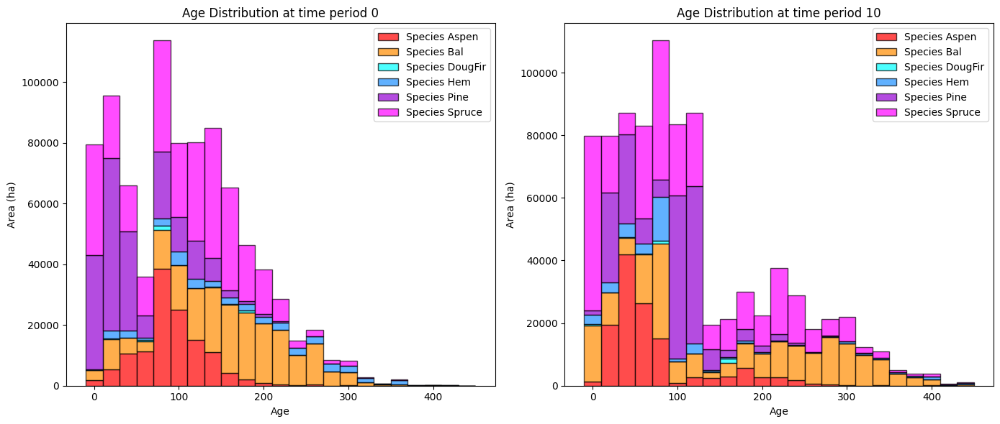

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


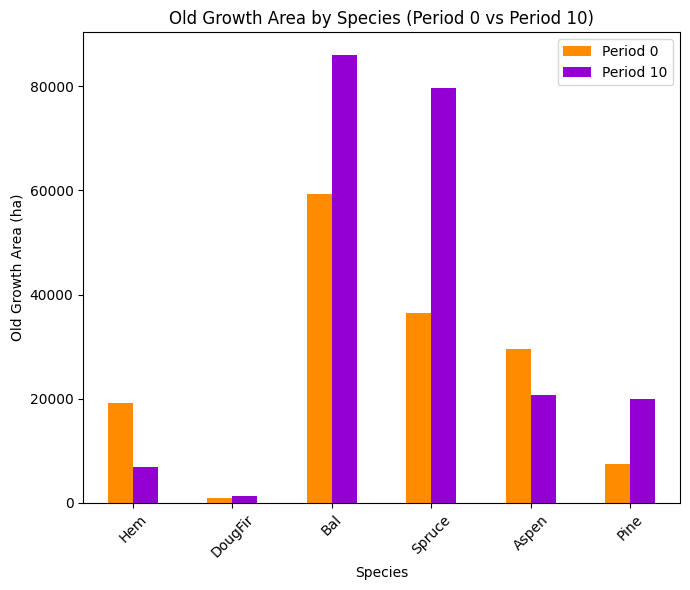

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


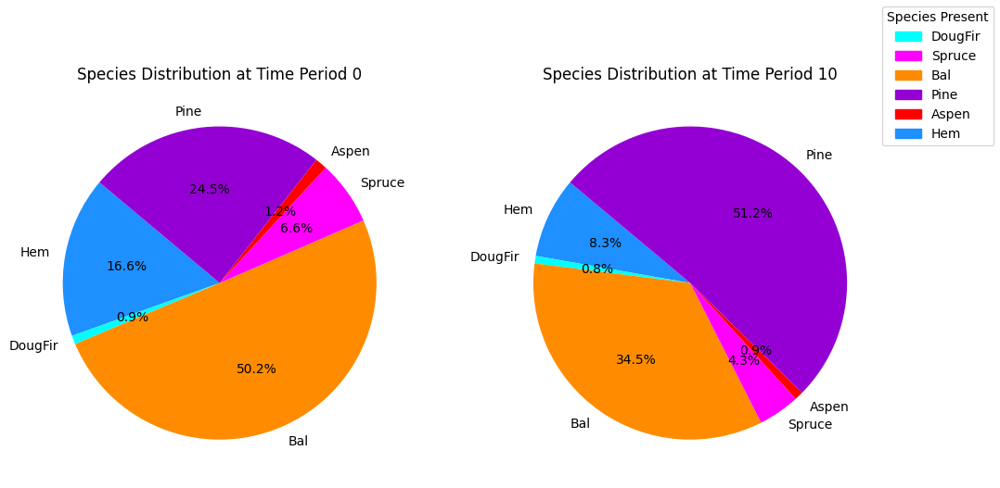

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


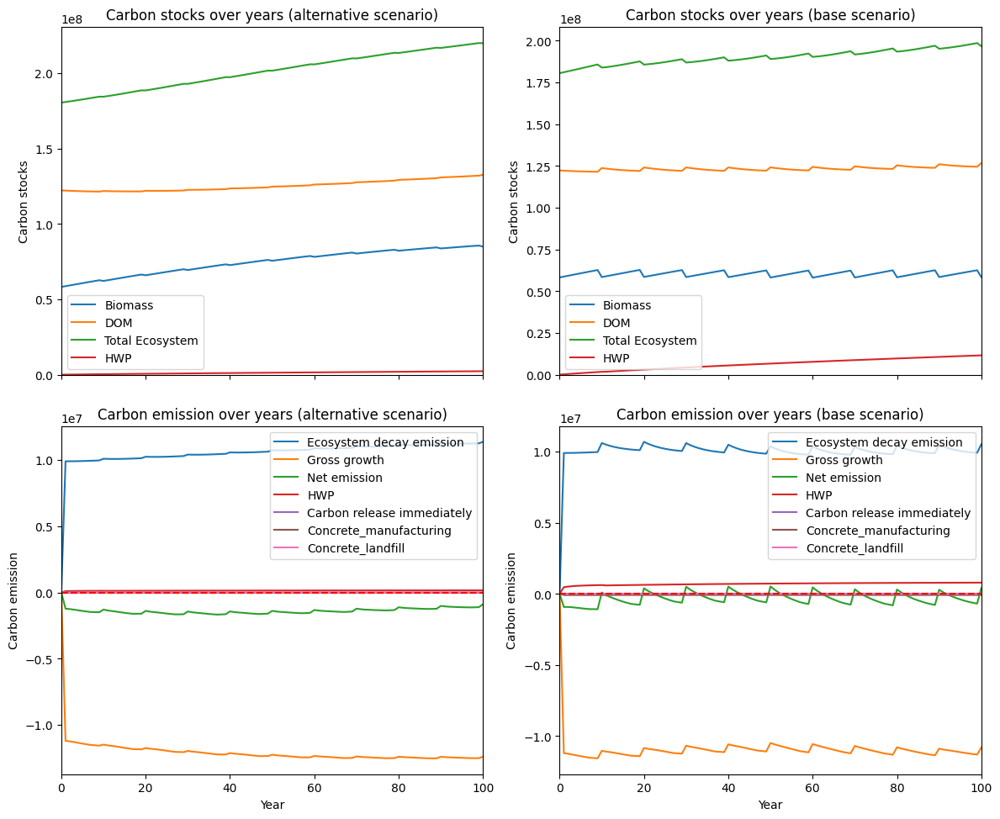

---------------------------------------------------------------------------------------
Net emission difference -107483239.69782825
Net emission base scenario -33180983.42591032
Net emission alternative scenario -140664223.12373856
dollar_per_ton is:  0.09303776131156247
Comparison of Old Growth Areas (Alternative - Base)
           0             10     Difference
Hem      0.0   24518.263143   24518.263143
DougFir  0.0    1435.434494    1435.434494
Bal      0.0   70252.131251   70252.131251
Spruce   0.0  114804.592234  114804.592234
Aspen    0.0   24459.499032   24459.499032
Pine     0.0   48716.345661   48716.345661

Overall, the old growth area has **increased** by 284186.27 hectares in the alternative scenario compared to the base scenario.


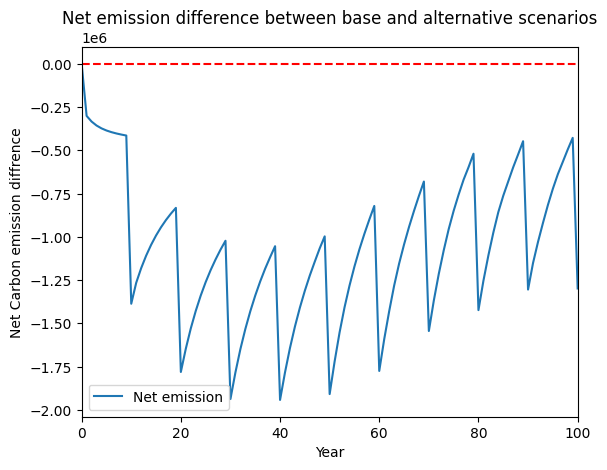

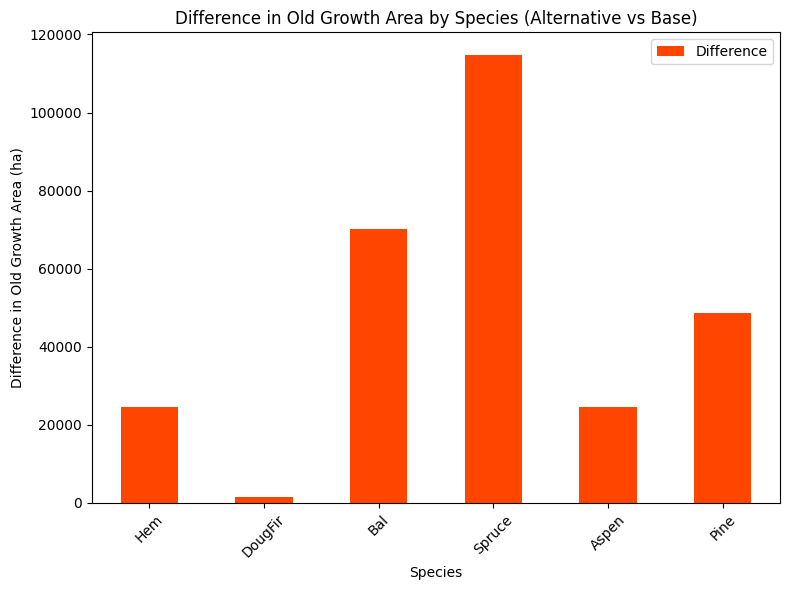

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


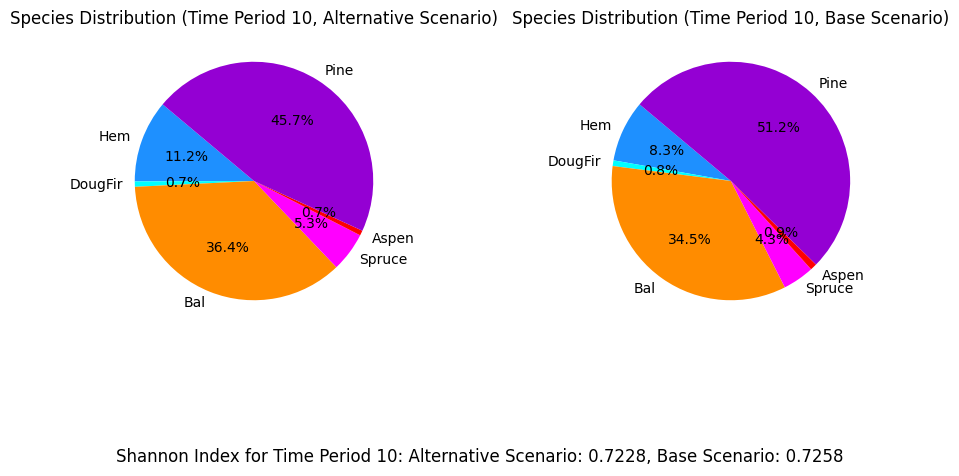

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_em_eqtslvr_AAC_10%...
running the scenario for the Equity Silver mining site (10%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x9408e534
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.25s
Presolved: 8375 r

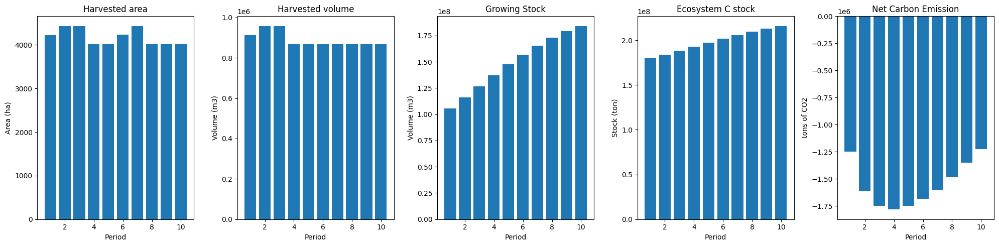

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  9408
The economic indicator (the provincial government revenues) is:  320857
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


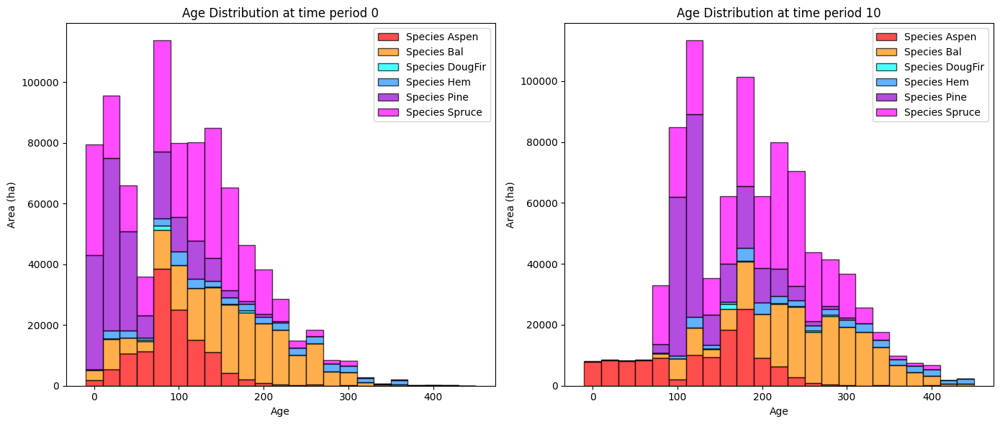

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   32688.964561   13536.837333
DougFir    947.047810    2749.298212    1802.250402
Bal      59315.970469  157496.619696   98180.649228
Spruce   36410.744598  198358.607639  161947.863041
Aspen    29632.731169   76832.243590   47199.512421
Pine      7432.733686   70644.159880   63211.426194

Old growth has **increased** by 385878.54 hectares from time period 0 to time period 10.


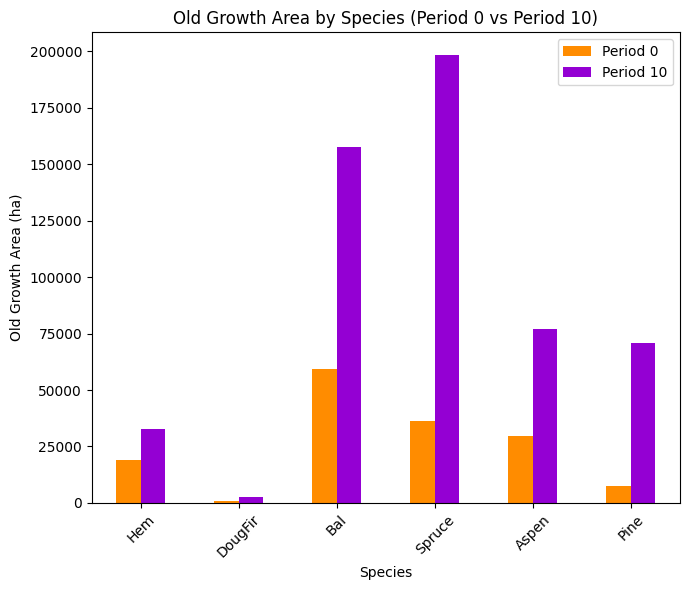

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7373

Diversity has **decreased** by 2.18% from time 0 to time 10.


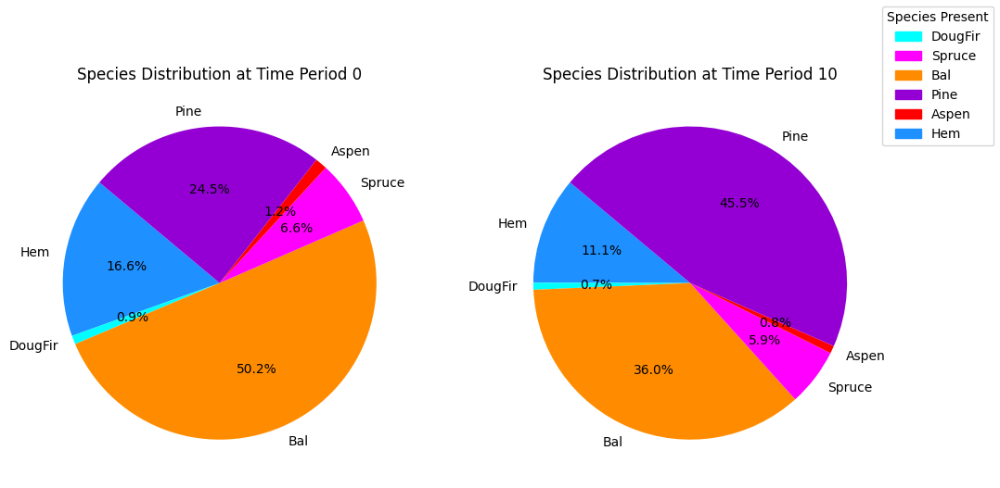

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.24s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

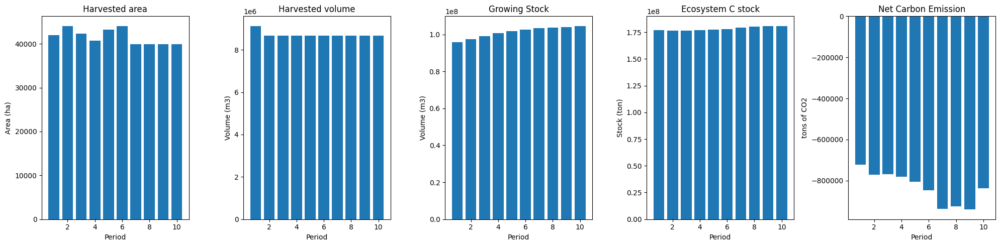

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------


In [ ]:
Start = time.time()
scenario_names = [ 'eqtslvr_AAC_50%', 'eqtslvr_AAC_40%', 'eqtslvr_AAC_30%', 'eqtslvr_AAC_20%', 'eqtslvr_AAC_10%']
for scenario_name in scenario_names:
    print(f"Running for {case_study}_{obj_mode}_{scenario_name}...")
    results_scenarios(fm, 
                      clt_percentage, 
                      credibility, 
                      budget_input, 
                      n_steps, 
                      max_harvest, 
                      scenario_name, 
                      displacement_effect, 
                      hwp_pool_effect_value, 
                      release_immediately_value, 
                      case_study, 
                      obj_mode,                   
                      pickle_output_base=False, 
                      pickle_output_alter=False)
print('It took', round((time.time() - Start) / 60, 1), "minutes to run all scenarios.")

Running for equitysilver_min_em_eqtslvr_AAC_10%...
running the scenario for the Equity Silver mining site (10%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x9408e534
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.31s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.01s

Barrier statistics:
 AA' NZ     : 2.583e+05
 Factor NZ  :

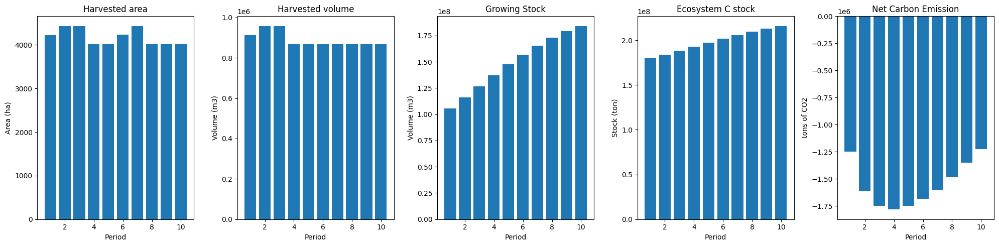

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  9408
The economic indicator (the provincial government revenues) is:  320857
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


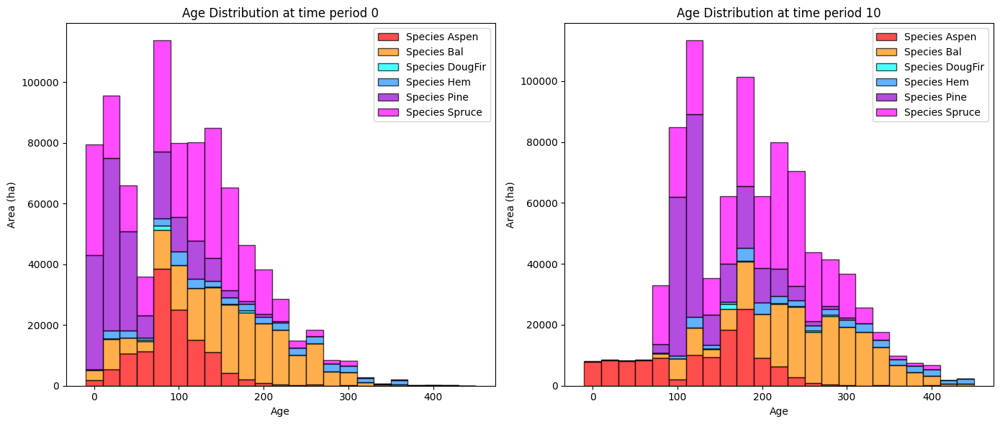

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   32688.964561   13536.837333
DougFir    947.047810    2749.298212    1802.250402
Bal      59315.970469  157496.619696   98180.649228
Spruce   36410.744598  198358.607639  161947.863041
Aspen    29632.731169   76832.243590   47199.512421
Pine      7432.733686   70644.159880   63211.426194

Old growth has **increased** by 385878.54 hectares from time period 0 to time period 10.


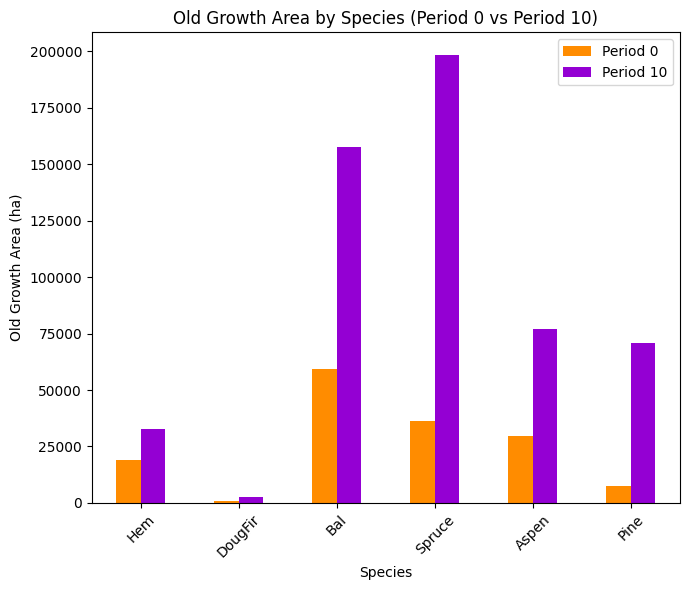

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7373

Diversity has **decreased** by 2.18% from time 0 to time 10.


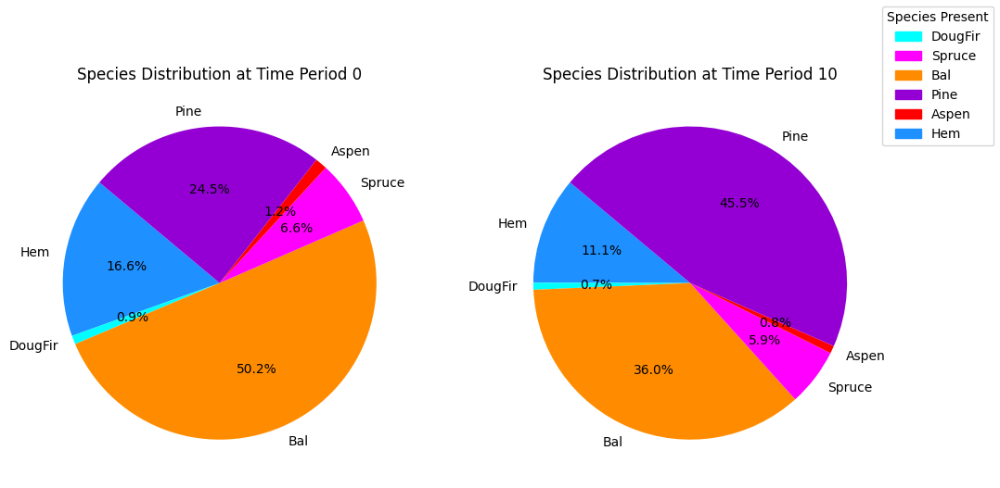

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_eqtslvr_AAC_10%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xdad7d0c8
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [3e-02, 7e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8884 columns
Presolve time: 0.28s
Presolved: 8375 rows, 74375 columns, 536310 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

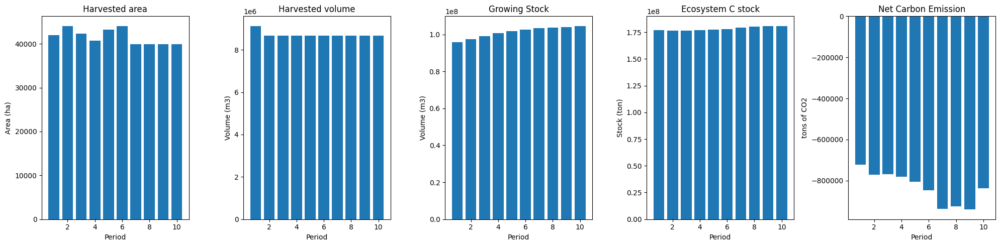

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_scheduling_minemission.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


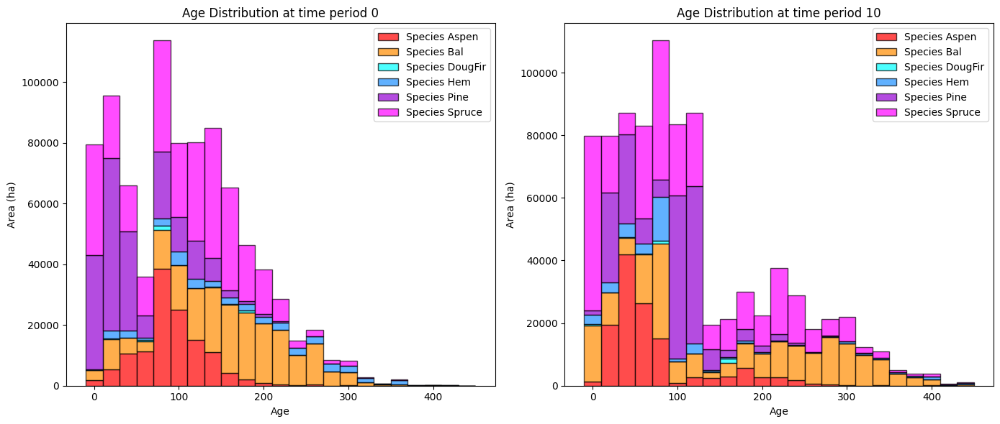

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0            10    Difference
Hem      19152.127229   6899.144385 -12252.982844
DougFir    947.047810   1313.863717    366.815907
Bal      59315.970469  86028.417837  26712.447369
Spruce   36410.744598  79595.177502  43184.432904
Aspen    29632.731169  20765.370139  -8867.361030
Pine      7432.733686  19937.243094  12504.509408

Old growth has **increased** by 61647.86 hectares from time period 0 to time period 10.


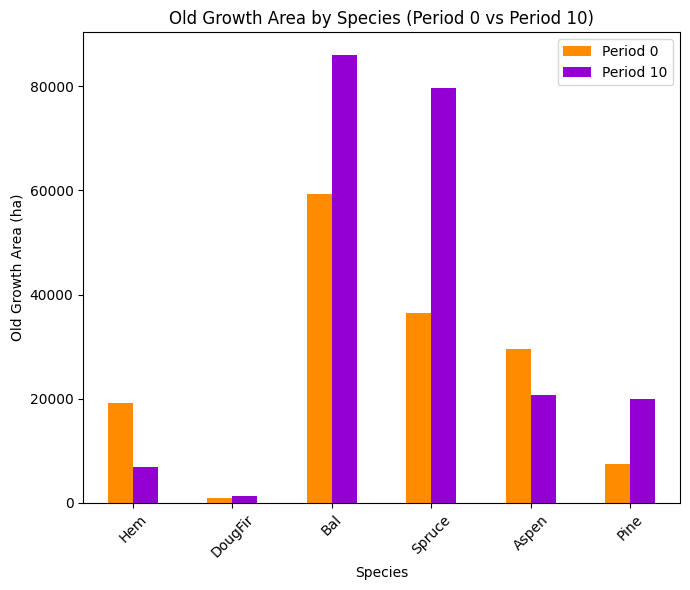

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7258

Diversity has **decreased** by 3.34% from time 0 to time 10.


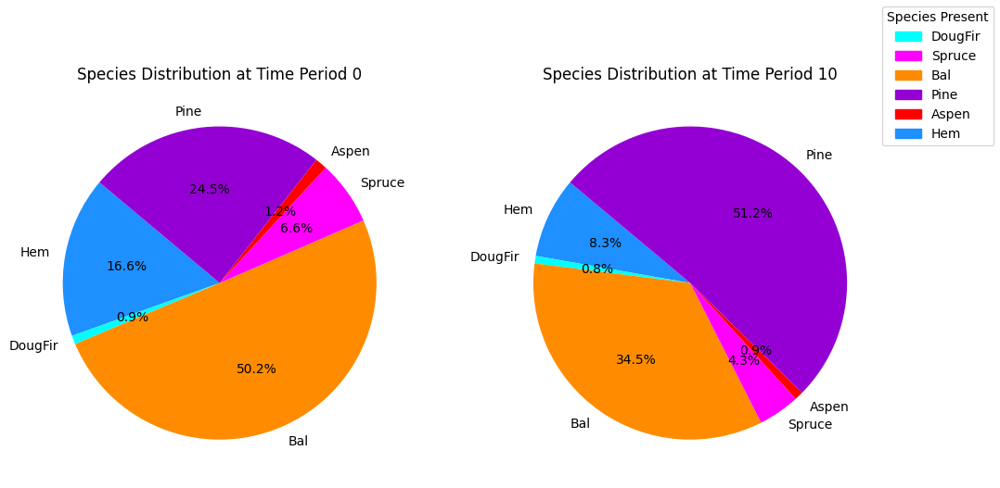

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_bau_eqtslvr_species_pie.pdf


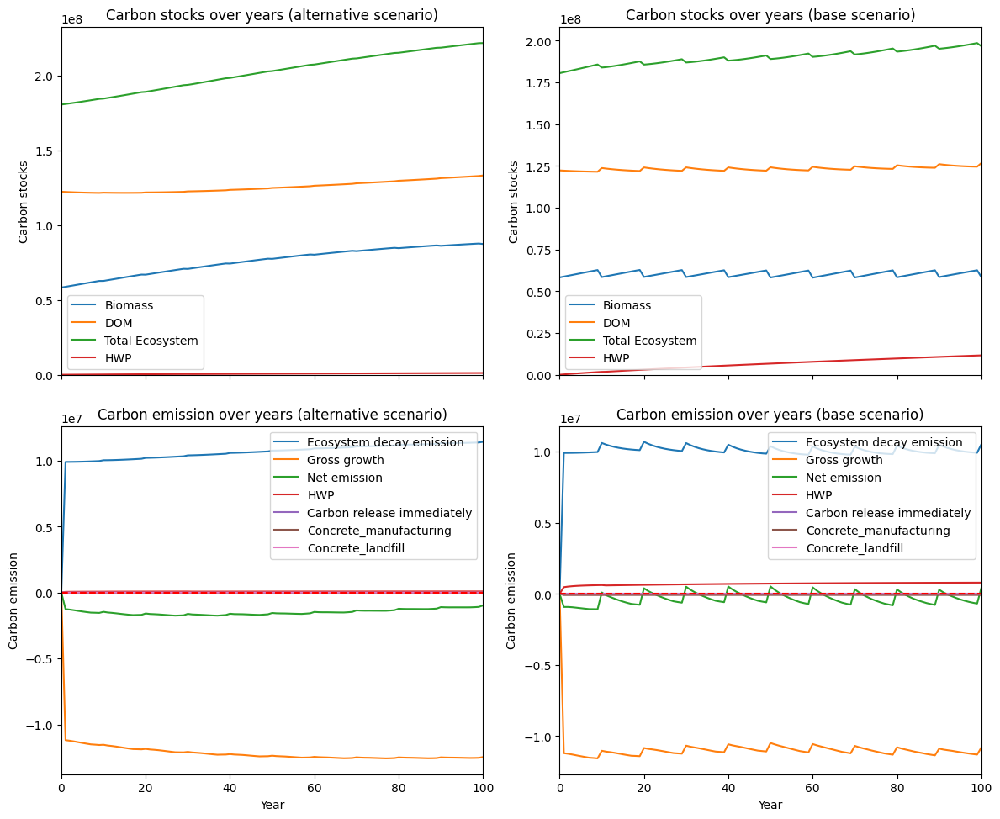

---------------------------------------------------------------------------------------
Net emission difference -115711059.47402841
Net emission base scenario -33180983.42591032
Net emission alternative scenario -148892042.89993873
dollar_per_ton is:  0.0864221626303968
Comparison of Old Growth Areas (Alternative - Base)
           0             10     Difference
Hem      0.0   25789.820177   25789.820177
DougFir  0.0    1435.434494    1435.434494
Bal      0.0   71468.201859   71468.201859
Spruce   0.0  118763.430137  118763.430137
Aspen    0.0   56066.873451   56066.873451
Pine     0.0   50706.916786   50706.916786

Overall, the old growth area has **increased** by 324230.68 hectares in the alternative scenario compared to the base scenario.


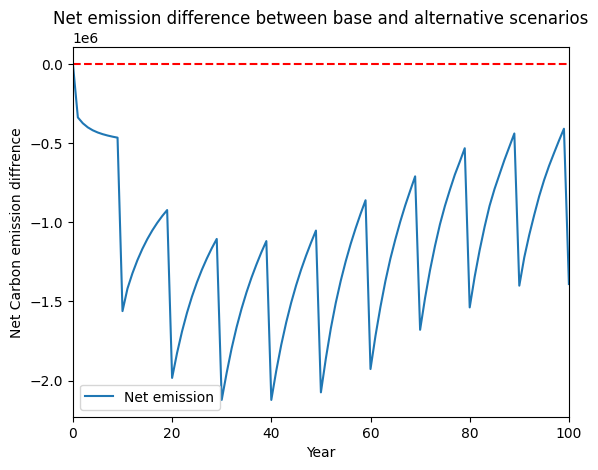

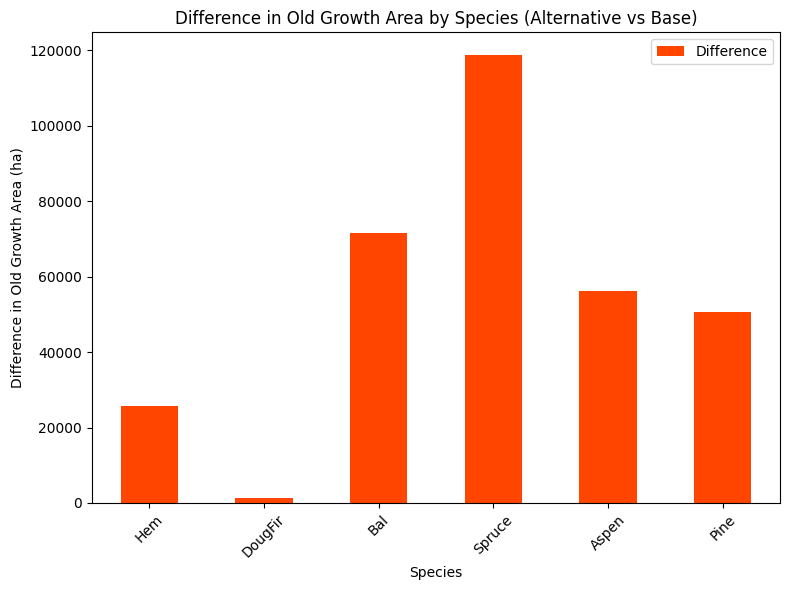

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_age_difference.pdf


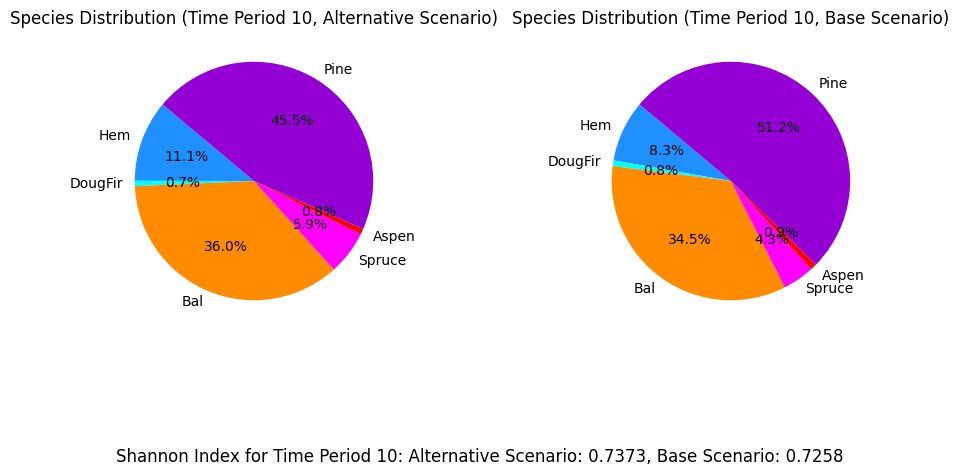

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_em_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
It took 30.0 minutes to run all scenarios.


In [15]:
Start = time.time()
scenario_names = ['eqtslvr_AAC_10%']
for scenario_name in scenario_names:
    print(f"Running for {case_study}_{obj_mode}_{scenario_name}...")
    results_scenarios(fm, 
                      clt_percentage, 
                      credibility, 
                      budget_input, 
                      n_steps, 
                      max_harvest, 
                      scenario_name, 
                      displacement_effect, 
                      hwp_pool_effect_value, 
                      release_immediately_value, 
                      case_study, 
                      obj_mode,                   
                      pickle_output_base=False, 
                      pickle_output_alter=False)
print('It took', round((time.time() - Start) / 60, 1), "minutes to run all scenarios.")

In [ ]:
print('It took', round((time.time() - Start) / 60, 1), "minutes to run this script.")